# Adjust lake quality

In [1]:
%matplotlib widget
import os
os.environ["GDAL_DATA"] = "/home/parndt/anaconda3/envs/geo_py37/share/gdal"
os.environ["PROJ_LIB"] = "/home/parndt/anaconda3/envs/geo_py37/share/proj"
import h5py
import math
import datetime
import traceback
import shapely
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib
import matplotlib.pylab as plt
from datetime import datetime
from datetime import timedelta
from datetime import timezone
from matplotlib.patches import Rectangle
from cmcrameri import cm as cmc
from mpl_toolkits.axes_grid1 import make_axes_locatable
# from icelakes.utilities import convert_time_to_string
from IPython.display import Image, display
from matplotlib.collections import PatchCollection
from sklearn.neighbors import KDTree
from scipy.stats import binned_statistic
from scipy.signal import find_peaks

from lakeanalysis.utils import dictobj, get_quality_summary, convert_time_to_string, read_melt_lake_h5

# Specify the directory where the data lives
Make sure this is the right one!

In [2]:
# base_dir = '/Volumes/nox/Philipp/IceLakesRun1/GlacierLakeDetectionICESat2/'
# base_dir = '/Volumes/nox/Philipp/IceLakesRun2/GlacierLakeDetectionICESat2/'
base_dir = 'data/lakes/'
# base_dir = 'zzz_bad_data/'
# base_dir = '../GlacierLakeDetectionICESat2/detection_out_data/'
base_dir = 'zzz_gris_test_data/'

In [3]:
# out_data_dir = 'detection_out_data/'
# out_plot_dir = 'detection_out_data/'
# granule_stats_fn = '/Users/parndt/jupyterprojects/IceLakesRun2/stats_combined_GLD2_except91granules.csv'

In [4]:
# stats_column_names=['region', 'granule', 'xatc_total', 'xatc_lakes', 'nphot_total', 'nphot_lakes']
# df_granule_stats = pd.read_csv(granule_stats_fn, header=None, names=stats_column_names)

In [5]:
# total_xatc = df_granule_stats.xatc_total.sum()
# lakes_xatc = df_granule_stats.xatc_lakes.sum()
# total_photons = df_granule_stats.nphot_total.sum()
# lakes_photons = df_granule_stats.nphot_lakes.sum()
# print('Total along-track distance analyzed: %.1f million km (%.1f million miles)' % (total_xatc/1e9, total_xatc/1e9*0.621371))
# print('Total along-track distance of lakes: %.1f thousand km (%.1f thousand miles)' % (lakes_xatc/1e6, lakes_xatc/1e6*0.621371))
# print('Percentage that is lakes:            %.5f' % (lakes_xatc/total_xatc*100))
# print('')
# print('Total number of photons analyzed:    %i billion' % (total_photons/1e9))
# print('Total number of lake photons:        %i million' % (lakes_photons/1e6))
# print('Percentage that is lakes:            %.5f' % (lakes_photons/total_photons*100))

# get lake info

In [6]:
searchfor = '.h5'
# searchfor = 'ATL03_20190119174407_03400210_006'
searchdir = base_dir # + out_data_dir
filelist = [searchdir+f for f in os.listdir(searchdir) \
            if os.path.isfile(os.path.join(searchdir, f)) & (searchfor in f)]
filelist.sort()
print('There are %i data files.' % len(filelist))
zerolakes = [f for f in filelist if 'lake_10000000_' in f]
print('There are %i files with zero quality.' % len(zerolakes))

There are 138 data files.
There are 0 files with zero quality.


In [7]:
searchfor_img = '.jpg'
searchdir = base_dir # + out_plot_dir
filelist_plot = [searchdir+f for f in os.listdir(searchdir) \
            if os.path.isfile(os.path.join(searchdir, f)) & (searchfor_img in f)]
filelist_plot.sort()
print('There are %i plot files.' % len(filelist_plot))

There are 0 plot files.


In [8]:
# from shapely.geometry import Point
# fn_basins = '../GlacierLakeDetectionICESat2/basins/shapefiles/ANT_basins_merged.shp'
# gdf = gpd.read_file(fn_basins).set_index('Subregions')
# ep_f = gdf.loc['Ep-F'].geometry
# ep_f

# Run this to compile lake stats by reading in all the available data files

In [9]:
# lake_mean_delta_time = np.median(f['mframe_data']['dt'][()])
# # ATLAS SDP epoch is 2018-01-01:T00.00.00.000000 UTC, from ATL03 data dictionary 
# ATLAS_SDP_epoch_datetime = datetime(2018, 1, 1, tzinfo=timezone.utc)
# ATLAS_SDP_epoch_timestamp = datetime.timestamp(ATLAS_SDP_epoch_datetime)
# lake_mean_timestamp = ATLAS_SDP_epoch_timestamp + lake_mean_delta_time
# lake_mean_datetime = datetime.fromtimestamp(lake_mean_timestamp, tz=timezone.utc)
# time_format_out = '%Y-%m-%dT%H:%M:%SZ'
# is2time = datetime.strftime(lake_mean_datetime, time_format_out)
# print(is2time)
# epoch = lake_mean_delta_time + datetime.timestamp(datetime(2018,1,1))
# print(datetime.fromtimestamp(epoch).strftime("%Y-%m-%dT%H:%M:%SZ"))

In [10]:
###########################################################################
def read_lake_file(fn):
    lakedict = {}
    with h5py.File(fn, 'r') as f:
        # metadata
        for key in f['properties'].keys(): 
            lakedict[key] = f['properties'][key][()]
            if f['properties'][key].dtype == object:
                lakedict[key] = lakedict[key].decode('utf-8')
        names = ['depth_data', 'photon_data']
        for name in names:
            d = {}
            for key in f[name].keys():
                d[key] = f[name][key][()]
            lakedict[name] = pd.DataFrame(d)
    return lakedict

In [44]:
coef = np.polyfit(df_bed.xatc, df_bed.h_fit_surf, 1)
poly1d_f = np.poly1d(coef)
xminmax = [df_bed.xatc.min(), df_bed.xatc.max()]
hminmax1 = np.abs(np.diff(poly1d_f(xminmax))[0])
hminmax2 = np.std(df_bed.h_fit_surf)
print((hminmax1, hminmax2))
maxd5 = np.max(dfd.depth[dfd.conf >= 0.3])
hminmax = np.max((hminmax1, hminmax2))
slope_adjust = np.clip(maxd5 / hminmax / 4, 0, 1)

(0.26405642118379546, 0.08917279629562269)


1.0

In [40]:
np.max(dfd.depth[dfd.conf >= 0.5])

nan

In [56]:
# ! rm -f zzz_qual_test_sort/*
! tar czvf zzz_qual_test_sort.tar.gz zzz_qual_test_sort
! ls zzz_qual_test_sort | wc -l

a zzz_qual_test_sort
a zzz_qual_test_sort/lake_099950_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1l_0004.jpg
a zzz_qual_test_sort/lake_099975_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt2l_0005.jpg
a zzz_qual_test_sort/lake_099965_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0023.jpg
a zzz_qual_test_sort/lake_099943_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3l_0026.jpg
a zzz_qual_test_sort/lake_099447_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0013.jpg
a zzz_qual_test_sort/lake_099835_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1l_0001.jpg
a zzz_qual_test_sort/lake_099224_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0006.jpg
a zzz_qual_test_sort/lake_099968_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0022.jpg
a zzz_qual_test_sort/lake_099985_GrIS_2023_


_________________________0___________________________________

(0.004032824922433065, 0.022892083976740345)


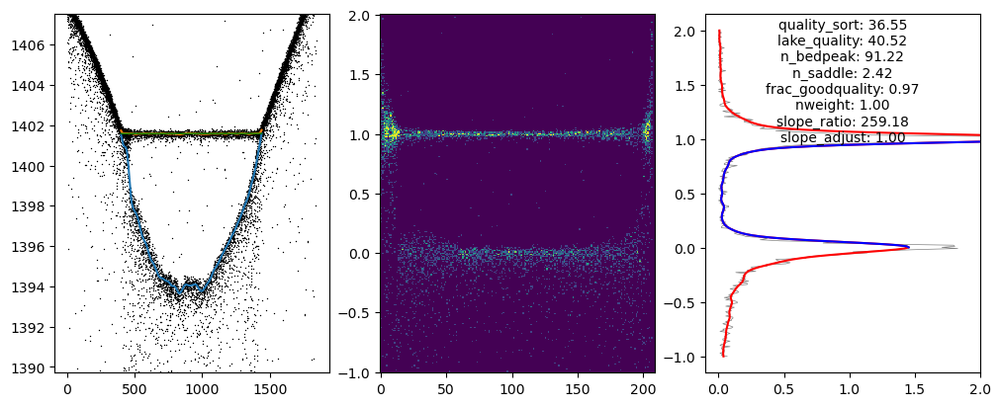

saved zzz_qual_test_sort/lake_096345_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3l_0025.jpg
36.5509234202975

_________________________1___________________________________

(0.0043210232768160495, 0.022874128845563897)


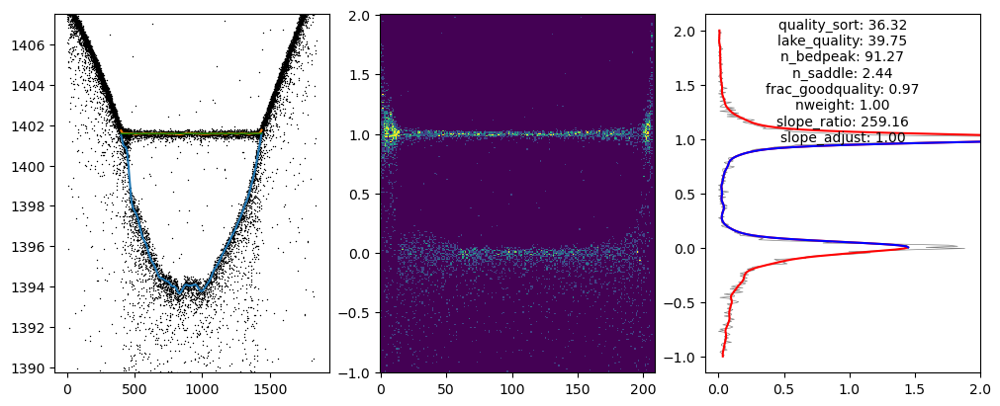

saved zzz_qual_test_sort/lake_096368_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3l_0025.jpg
36.321473181360865

_________________________2___________________________________

(0.012631294757056821, 0.034054880415062994)


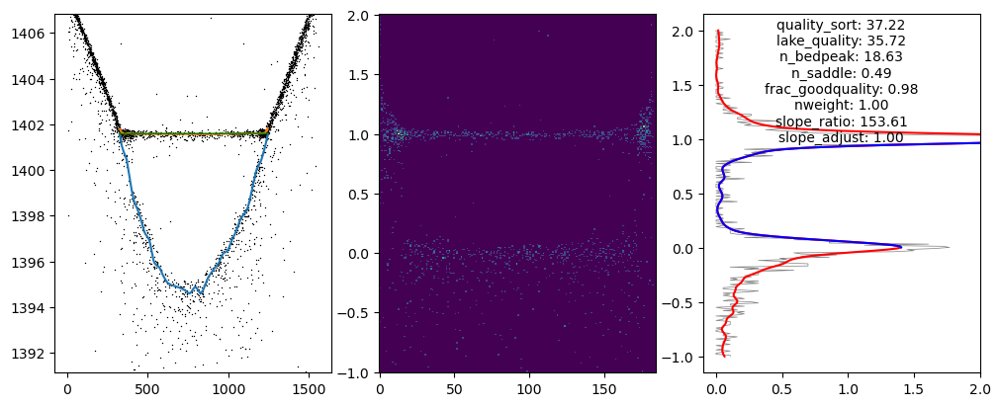

saved zzz_qual_test_sort/lake_096278_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3r_0028.jpg
37.21723197542993

_________________________3___________________________________

(0.012673530103711528, 0.03389363537698089)


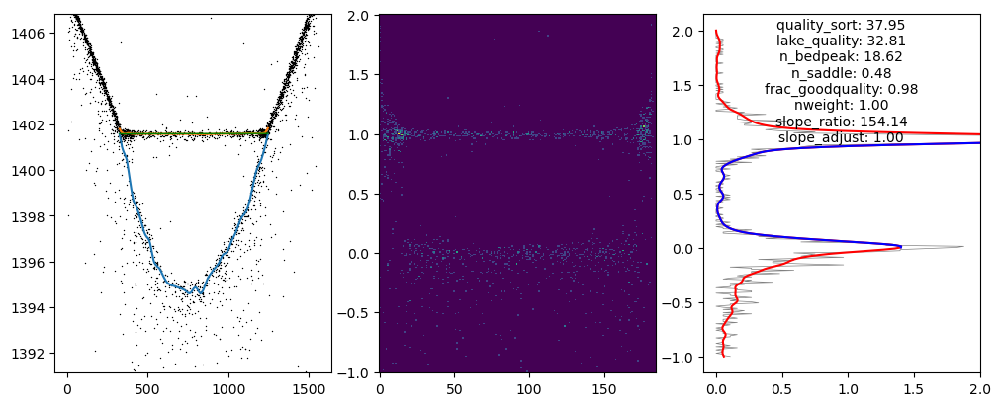

saved zzz_qual_test_sort/lake_096205_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3r_0028.jpg
37.94687622588484

_________________________4___________________________________

(0.02133796102521046, 0.03321774081312836)


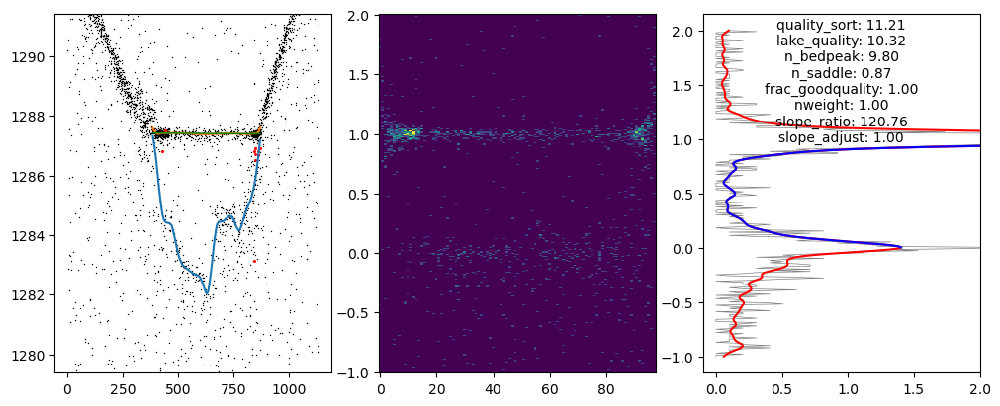

saved zzz_qual_test_sort/lake_098879_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1r_0006.jpg
11.213247565508723

_________________________5___________________________________

(0.02166735560035704, 0.02565029643092131)


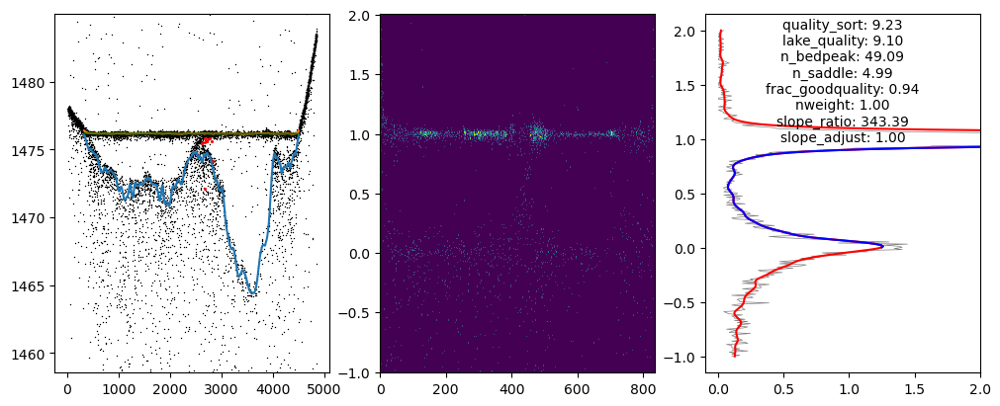

saved zzz_qual_test_sort/lake_099077_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0019.jpg
9.233613082096314

_________________________6___________________________________

(0.02150489394921351, 0.02562508234182633)


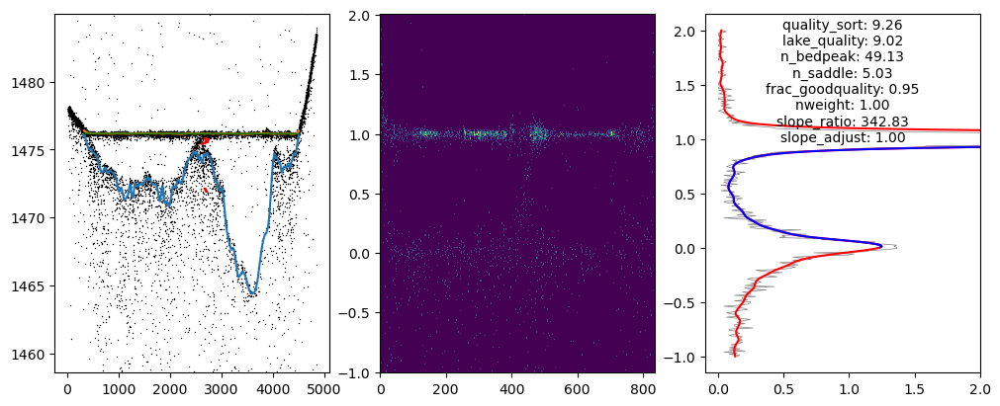

saved zzz_qual_test_sort/lake_099074_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0022.jpg
9.259518140675013

_________________________7___________________________________

(0.03585609141578061, 0.03414175934924701)


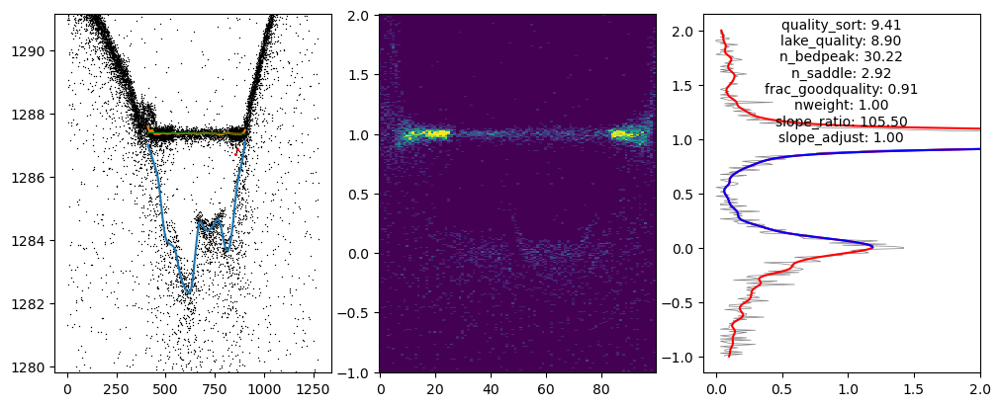

saved zzz_qual_test_sort/lake_099059_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1l_0002.jpg
9.414427357318749

_________________________8___________________________________

(0.0921566652675665, 0.0671678550877844)


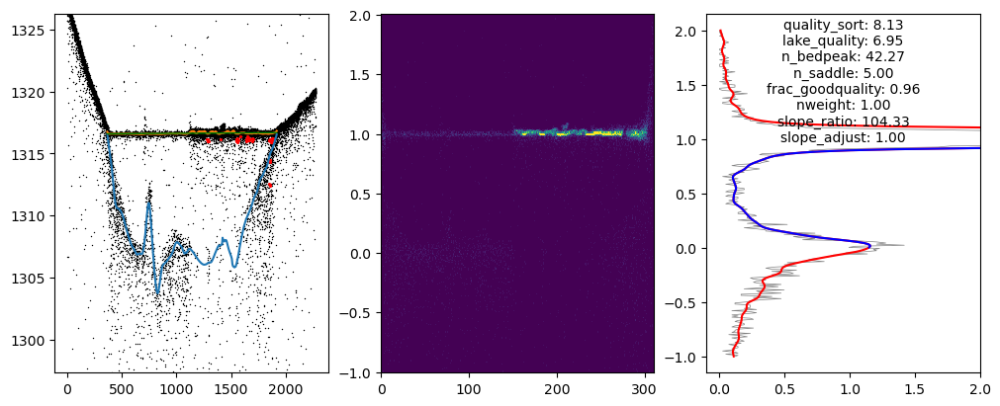

saved zzz_qual_test_sort/lake_099187_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0006.jpg
8.128201968323168

_________________________9___________________________________

(0.09221779243307537, 0.06721024779293348)


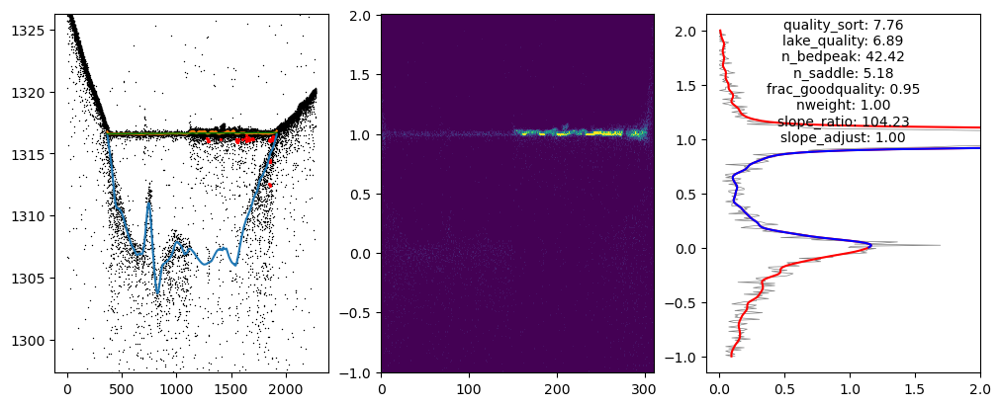

saved zzz_qual_test_sort/lake_099224_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0006.jpg
7.762578137444773

_________________________10___________________________________

(0.12461419131977891, 0.05091682119407332)


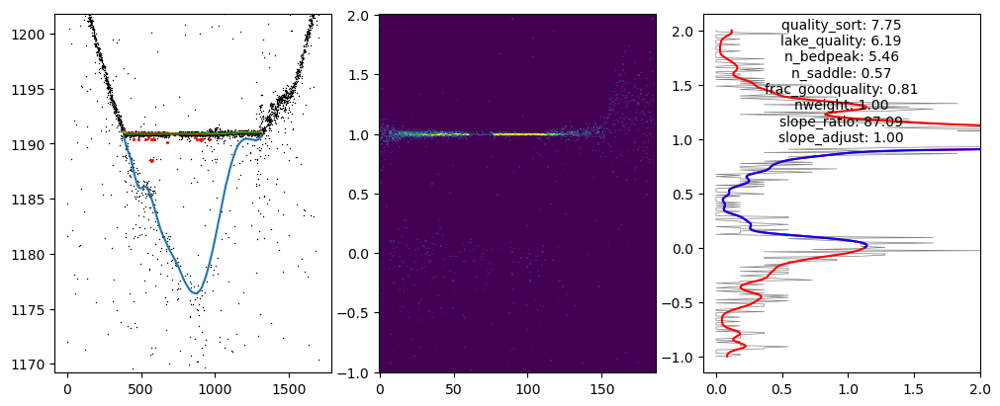

saved zzz_qual_test_sort/lake_099225_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0020.jpg
7.747367122147548

_________________________11___________________________________

(0.12464734318155024, 0.05097084430455)


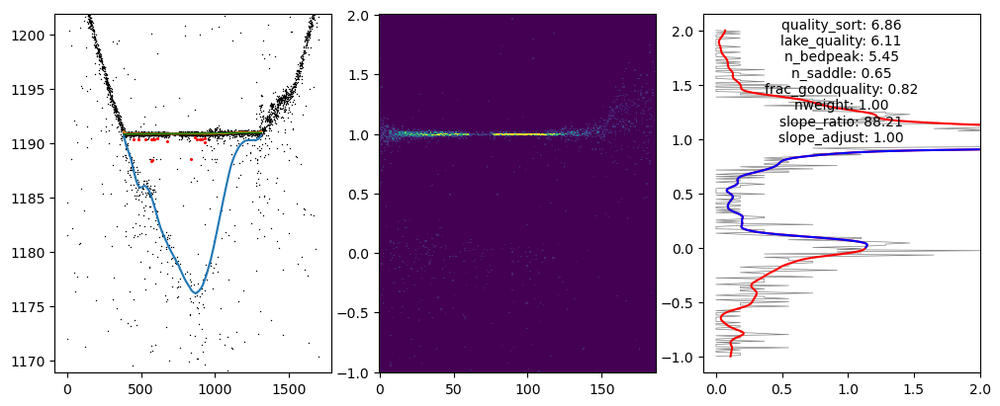

saved zzz_qual_test_sort/lake_099314_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0020.jpg
6.857282582761952

_________________________12___________________________________

(0.018408886568067828, 0.029413967961735937)


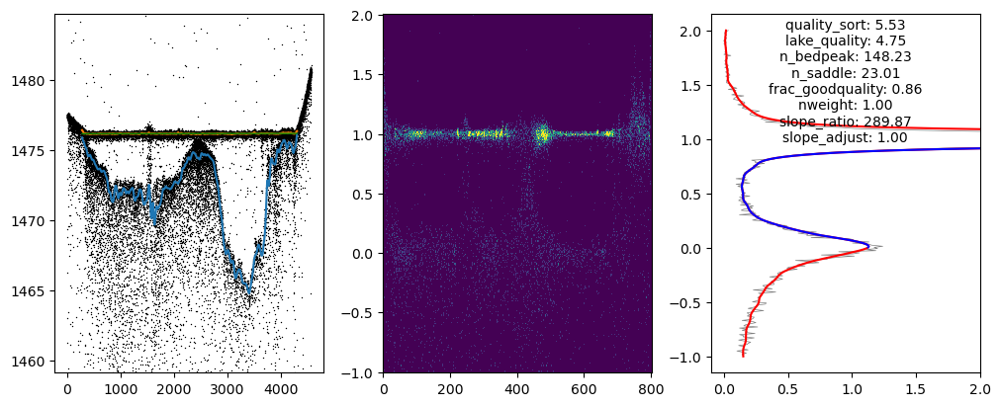

saved zzz_qual_test_sort/lake_099447_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0013.jpg
5.5272571703571325

_________________________13___________________________________

(0.01838842637334892, 0.029443039463250303)


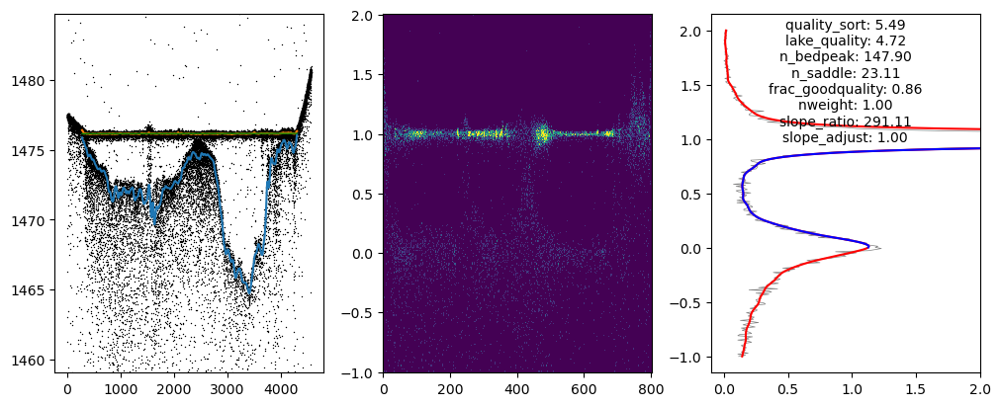

saved zzz_qual_test_sort/lake_099451_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0012.jpg
5.490031748538803

_________________________14___________________________________

(0.07190852271651238, 0.059690586402608825)


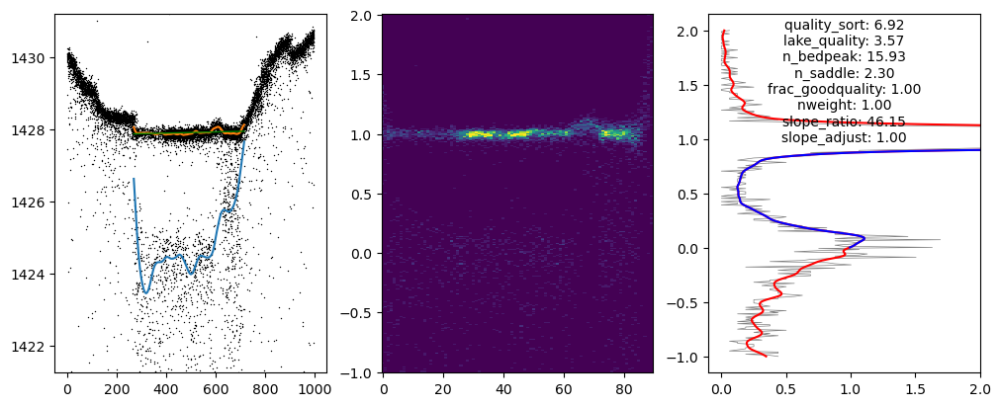

saved zzz_qual_test_sort/lake_099308_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1l_0002.jpg
6.924046092332817

_________________________15___________________________________

(0.1350395360264529, 0.04935635104219969)


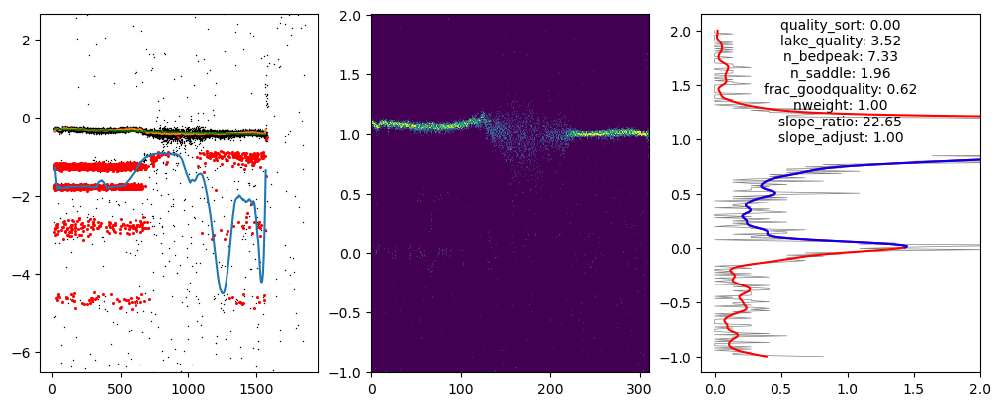

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt2r_0013.jpg
0.0

_________________________16___________________________________

(0.021890511649720112, 0.03512226724011575)


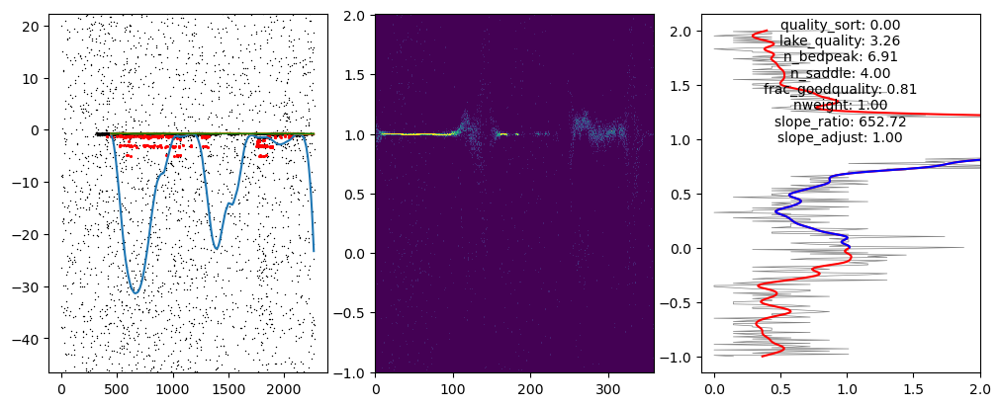

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_CE_ATL03_20230806174214_07262005_006_02_gt3r_0002.jpg
0.0

_________________________17___________________________________

(0.043385779005689074, 0.02331103363535835)


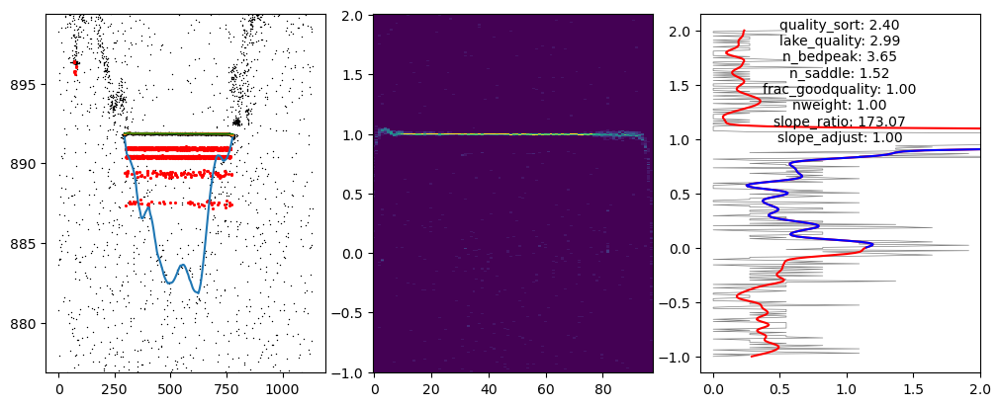

saved zzz_qual_test_sort/lake_099760_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt2r_0014.jpg
2.402993579787326

_________________________18___________________________________

(0.04786260092555494, 0.048860252949581184)


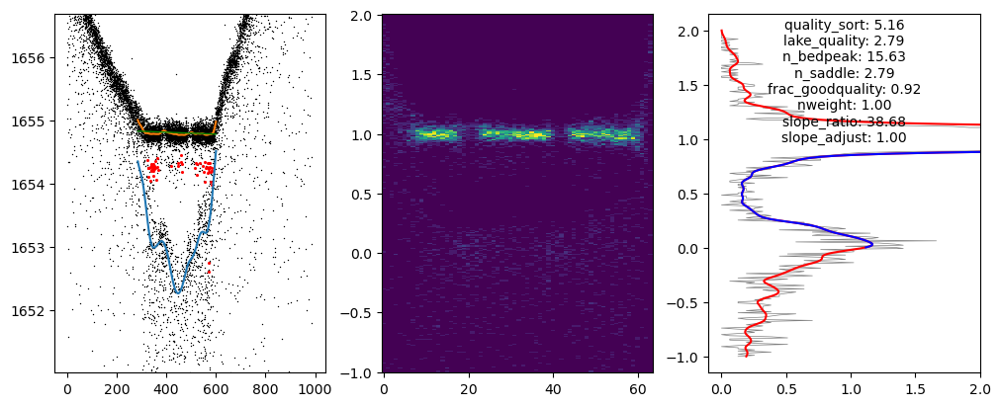

saved zzz_qual_test_sort/lake_099484_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0007.jpg
5.157736578017226

_________________________19___________________________________

(0.04782749586661339, 0.048791836638104366)


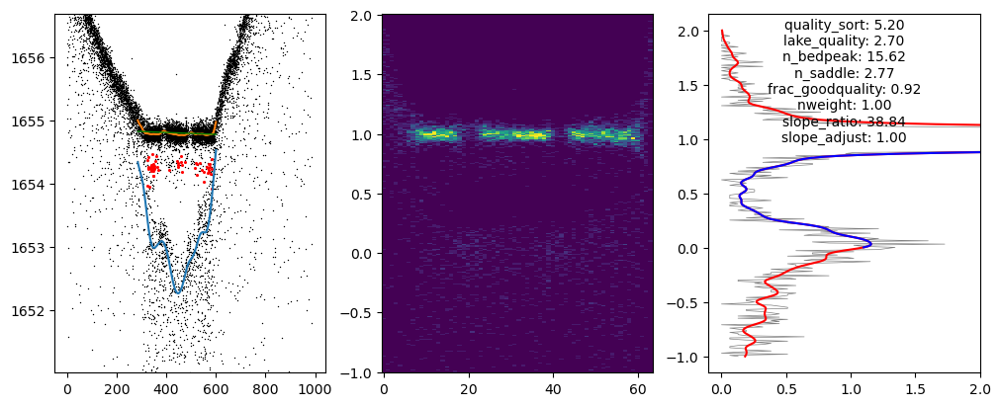

saved zzz_qual_test_sort/lake_099480_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0007.jpg
5.2009259137785415

_________________________20___________________________________

(0.033317408672019155, 0.05130600714834884)


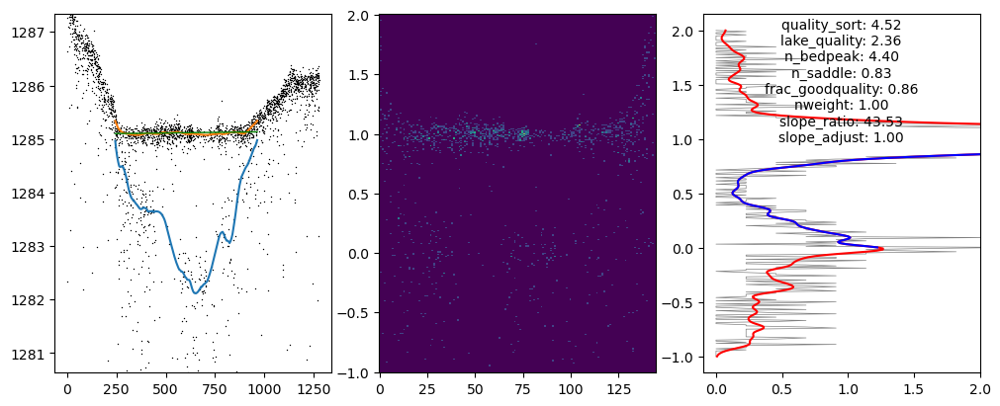

saved zzz_qual_test_sort/lake_099548_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0008.jpg
4.5239190031825744

_________________________21___________________________________

(0.21215861614223286, 0.07934811632538291)


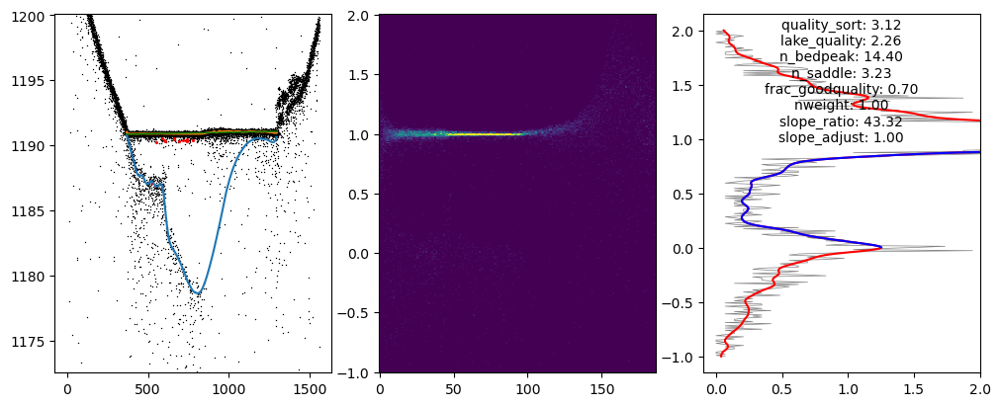

saved zzz_qual_test_sort/lake_099688_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0015.jpg
3.120325294338823

_________________________22___________________________________

(0.033517937214128324, 0.05124870362647977)


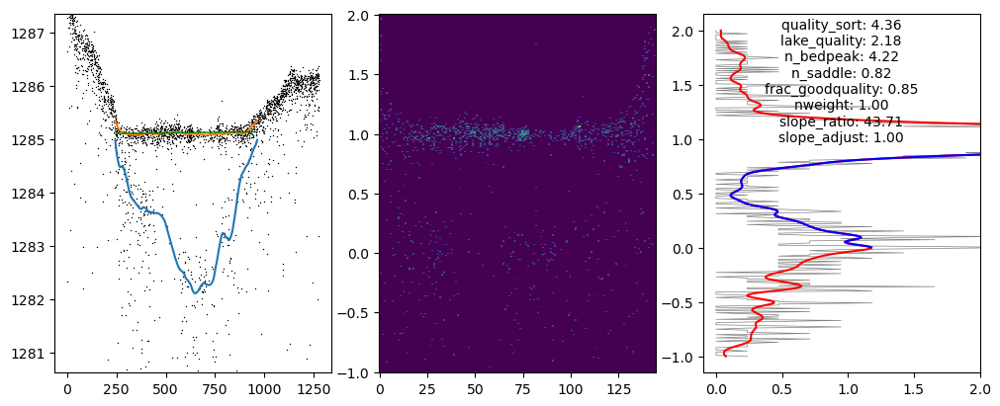

saved zzz_qual_test_sort/lake_099564_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0008.jpg
4.361139364126304

_________________________23___________________________________

(0.2120650146209755, 0.07934816476295231)


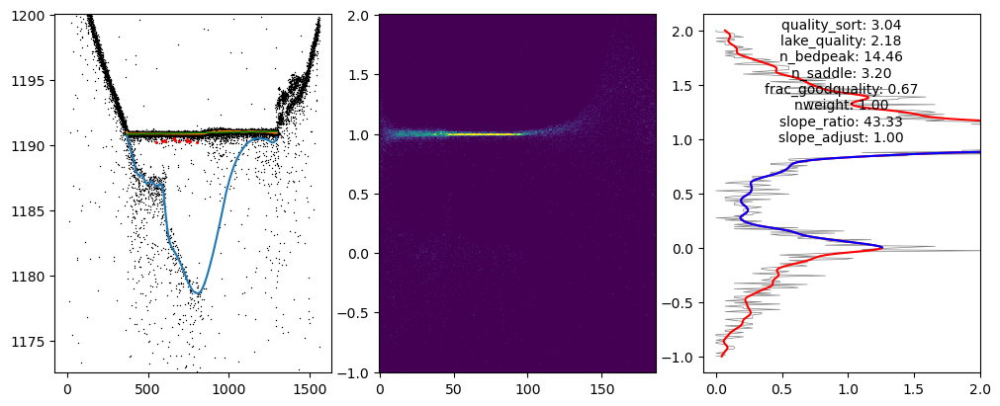

saved zzz_qual_test_sort/lake_099696_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0015.jpg
3.042400399145515

_________________________24___________________________________

(0.25374788617341437, 0.0804489428762249)


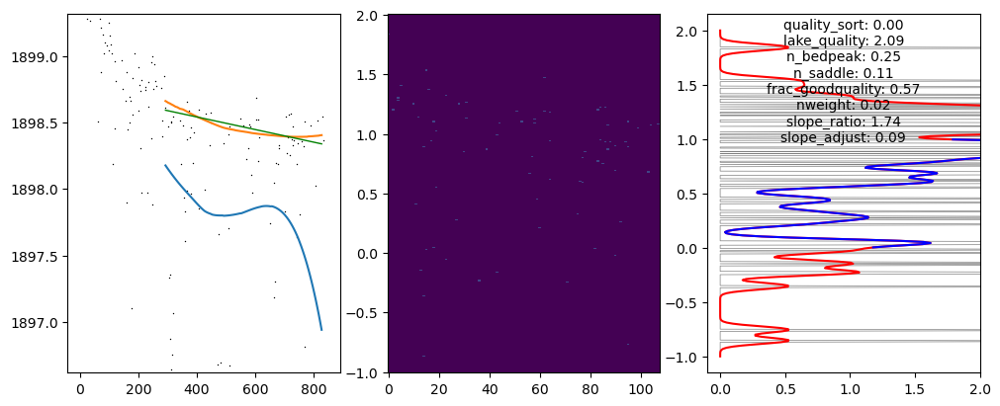

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0017.jpg
0.001978868906386621

_________________________25___________________________________

(0.058676358473348955, 0.05565917588037334)


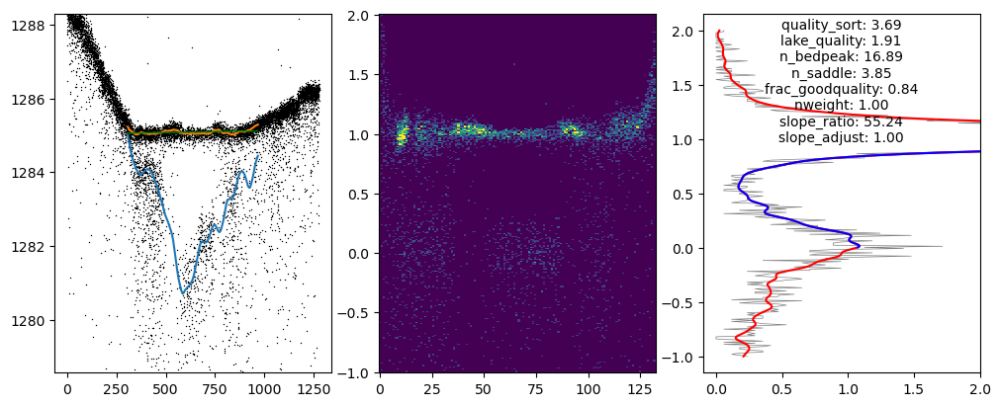

saved zzz_qual_test_sort/lake_099631_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0001.jpg
3.692992217181016

_________________________26___________________________________

(0.09994412121341156, 0.07106620188495358)


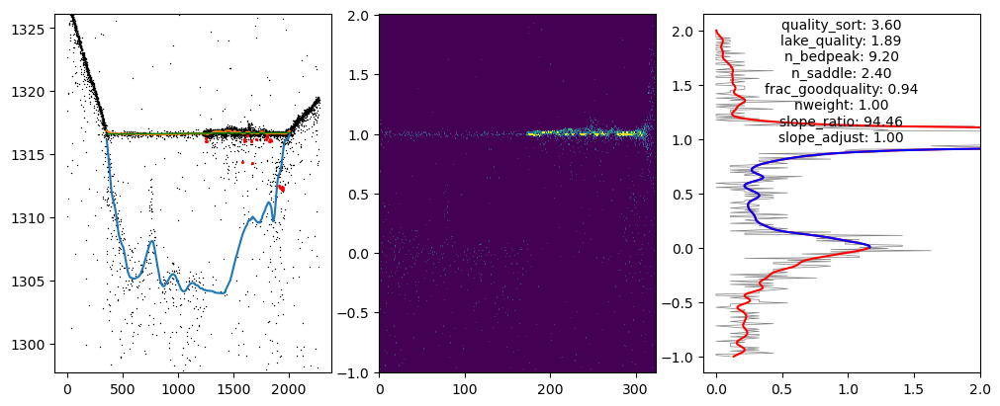

saved zzz_qual_test_sort/lake_099640_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0012.jpg
3.598178082021119

_________________________27___________________________________

(0.05861882676754249, 0.0556770043545068)


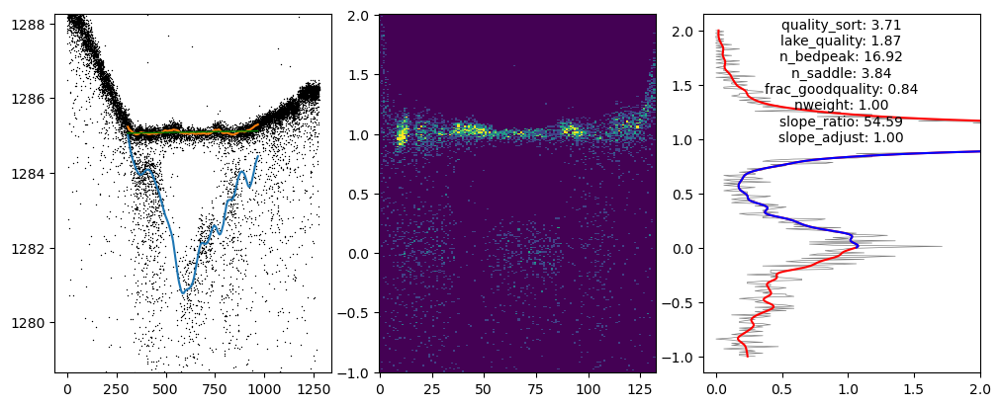

saved zzz_qual_test_sort/lake_099629_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0001.jpg
3.7128522982796657

_________________________28___________________________________

(0.10130643020443131, 0.07121294297877112)


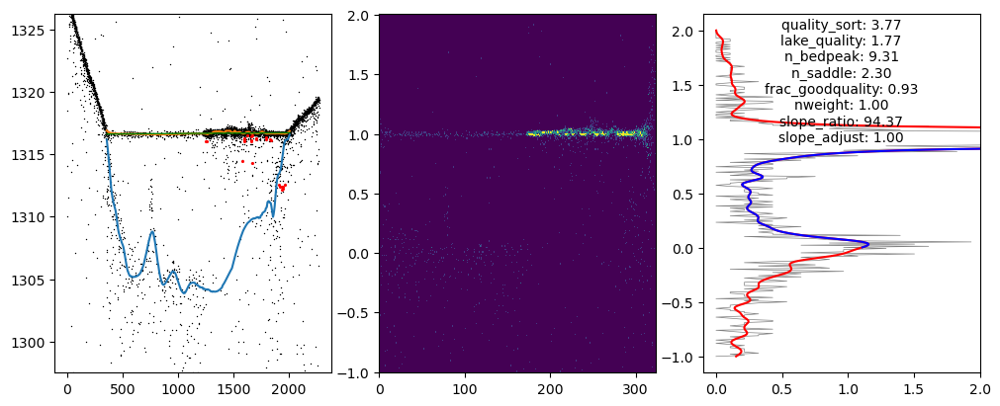

saved zzz_qual_test_sort/lake_099623_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0012.jpg
3.769500155759143

_________________________29___________________________________

(0.4778917998896759, 0.14089253685750355)


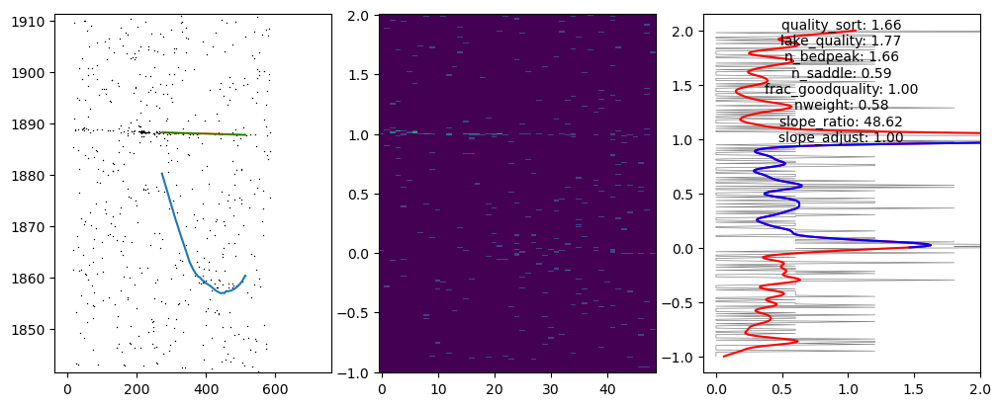

saved zzz_qual_test_sort/lake_099834_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806045720_07182003_006_02_gt2r_0002.jpg
1.6567146859272084

_________________________30___________________________________

(0.26405642118379546, 0.08917279629562269)


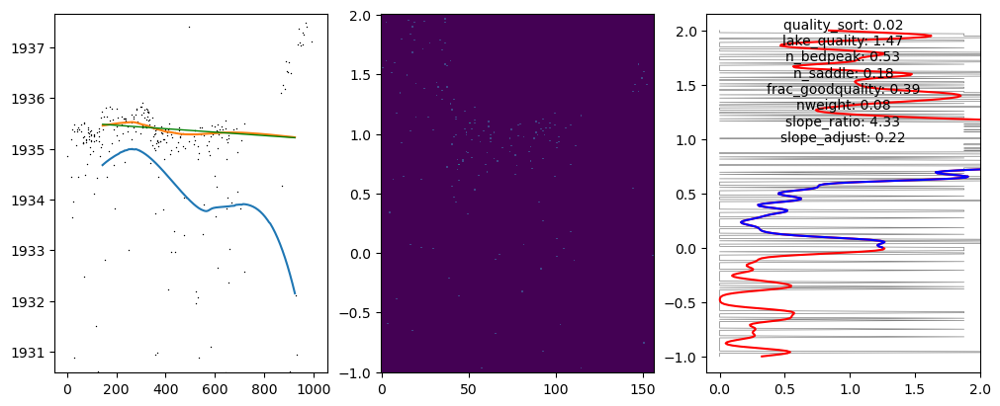

saved zzz_qual_test_sort/lake_099998_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1r_0003.jpg
0.01870630500551022

_________________________31___________________________________

(0.24035875672484508, 0.0842143648337273)


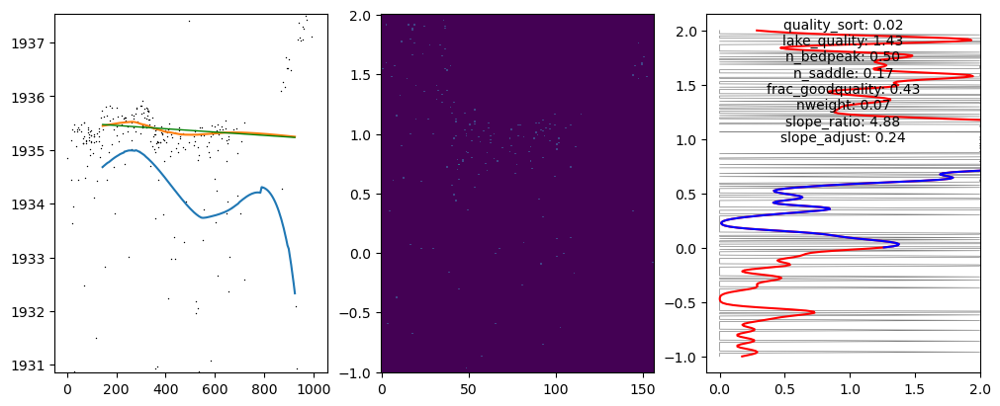

saved zzz_qual_test_sort/lake_099998_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1r_0003.jpg
0.020756964153268574

_________________________32___________________________________

(0.010523381038410662, 0.044890045292173074)


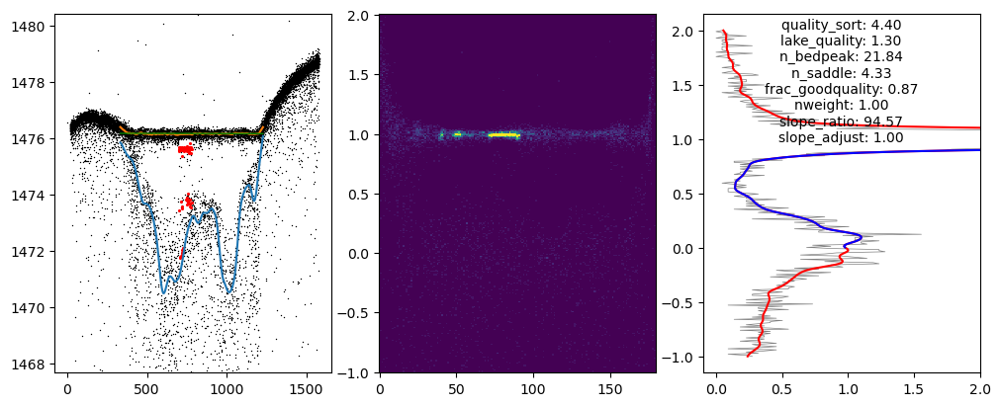

saved zzz_qual_test_sort/lake_099560_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0012.jpg
4.404525420709599

_________________________33___________________________________

(0.010493040025949085, 0.044923314620083796)


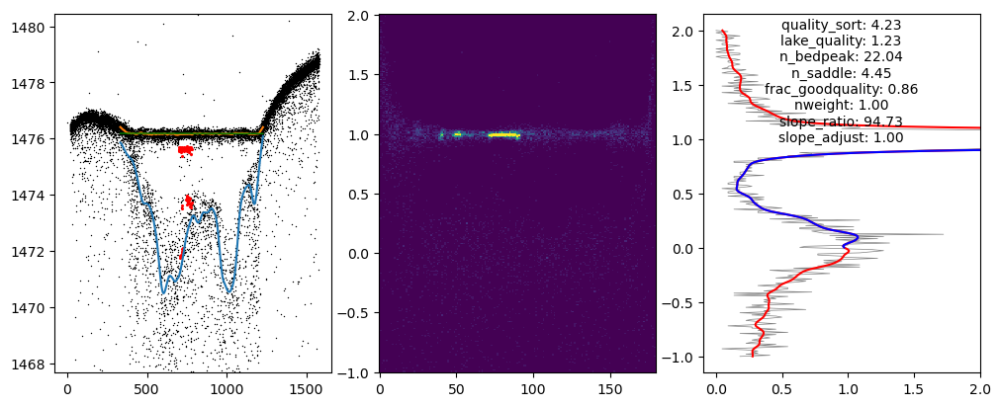

saved zzz_qual_test_sort/lake_099577_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0011.jpg
4.232644983059132

_________________________34___________________________________

(0.027510195667673543, 0.03581804785634505)


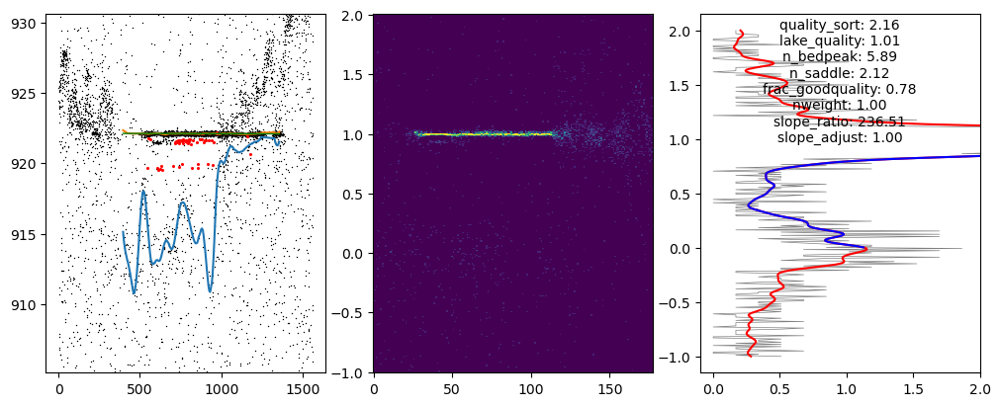

saved zzz_qual_test_sort/lake_099784_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1r_0007.jpg
2.1598112053343

_________________________35___________________________________

(0.03327925921826136, 0.05833924327069671)


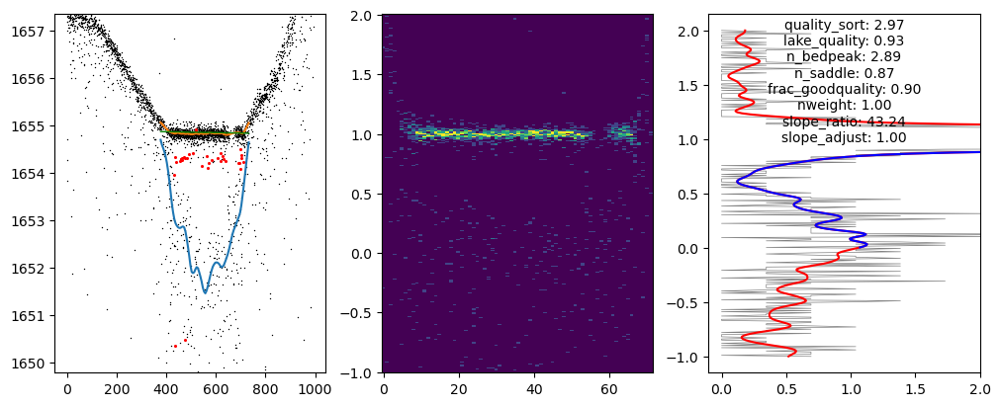

saved zzz_qual_test_sort/lake_099703_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0013.jpg
2.9698042752572356

_________________________36___________________________________



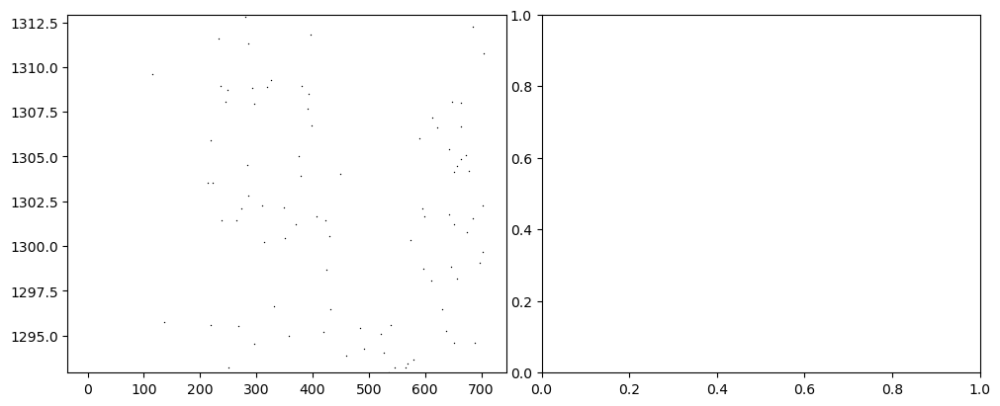

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0016.jpg
0.0

_________________________37___________________________________

(0.03335418148139979, 0.05830109855503112)


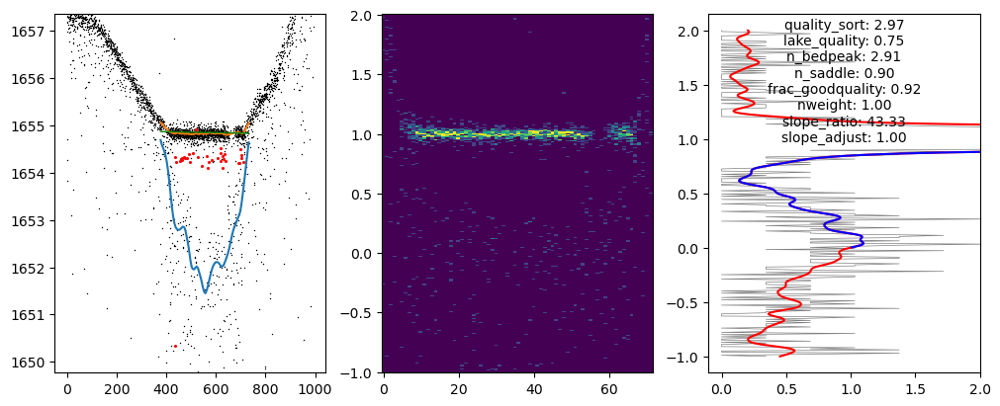

saved zzz_qual_test_sort/lake_099703_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0013.jpg
2.9701722506414843

_________________________38___________________________________

(0.08486371778292323, 0.03243890538121843)


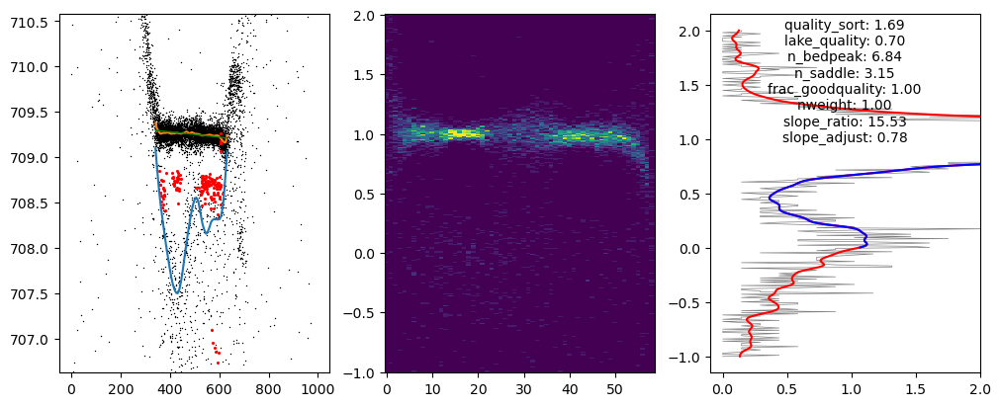

saved zzz_qual_test_sort/lake_099831_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt3l_0017.jpg
1.685189118483018

_________________________39___________________________________

(0.023363733181810176, 0.021832026076046368)


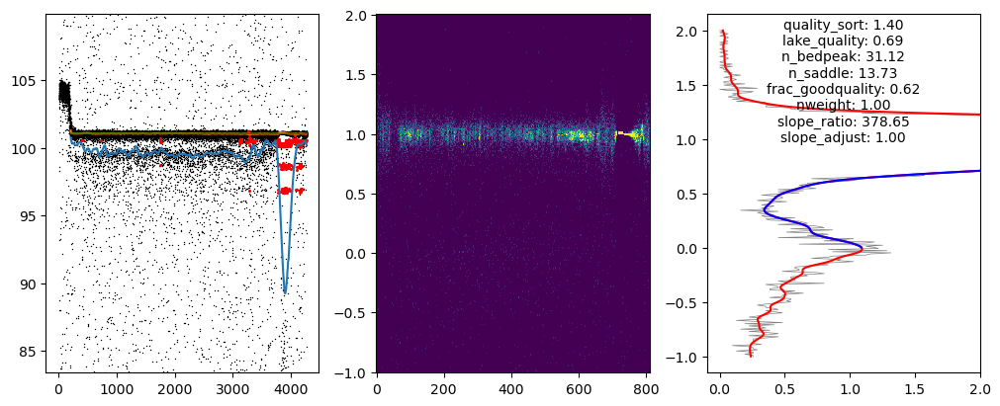

saved zzz_qual_test_sort/lake_099860_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt2l_0007.jpg
1.3977331403615854

_________________________40___________________________________

(0.10416881508695042, 0.07111556609814938)


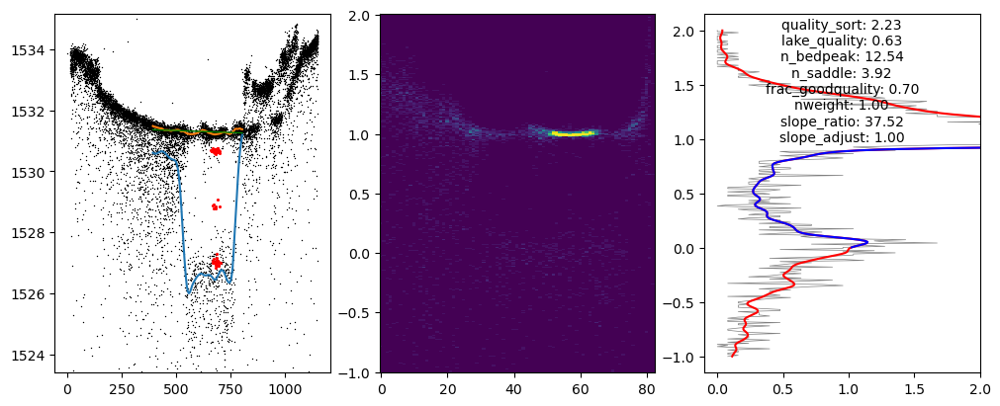

saved zzz_qual_test_sort/lake_099777_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0009.jpg
2.2335776831260867

_________________________41___________________________________

(0.10411286611588366, 0.0711490670895156)


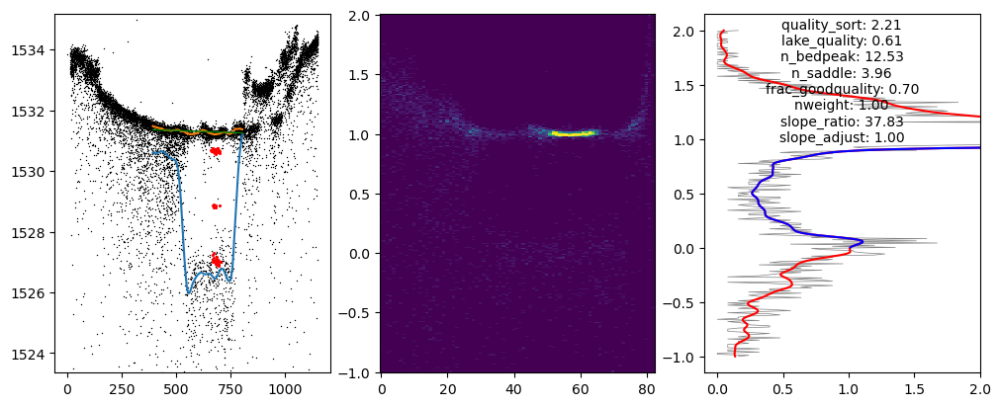

saved zzz_qual_test_sort/lake_099779_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0010.jpg
2.2131553182238606

_________________________42___________________________________

(0.021826921220991835, 0.013188358712168224)


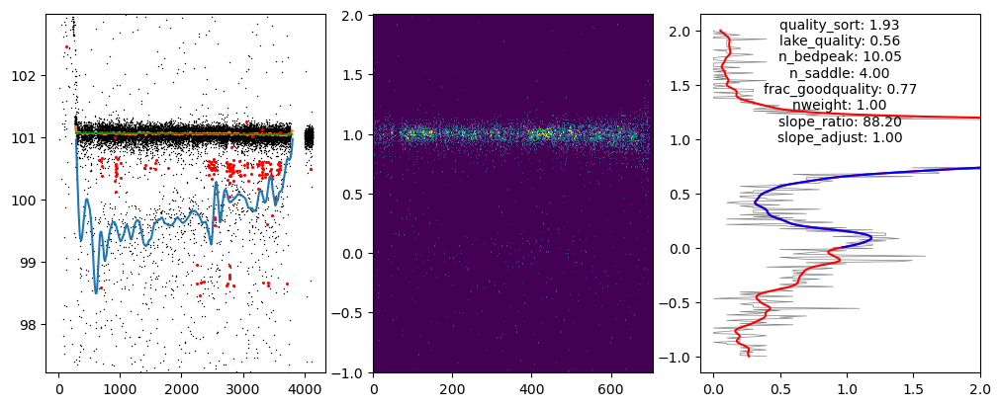

saved zzz_qual_test_sort/lake_099807_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt2r_0012.jpg
1.9280281609477385

_________________________43___________________________________

(0.04121780352465976, 0.07338079950941295)


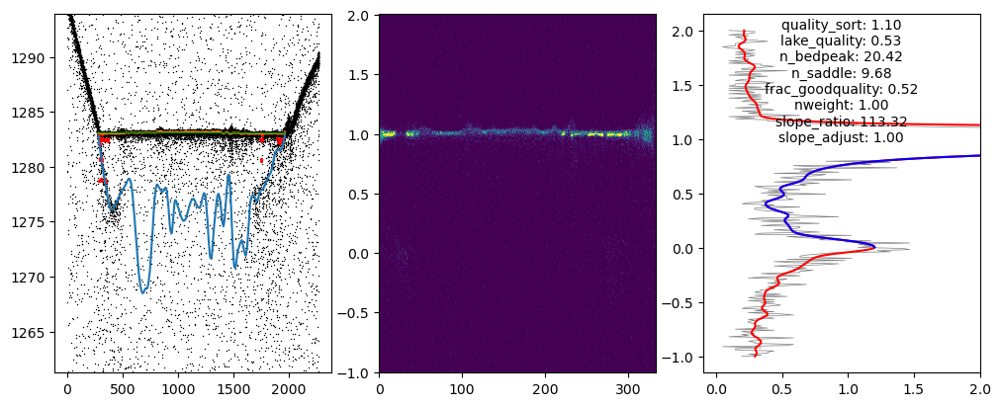

saved zzz_qual_test_sort/lake_099890_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt2l_0009.jpg
1.0989548948903813

_________________________44___________________________________

(0.14418789833962364, 0.11188001241524624)


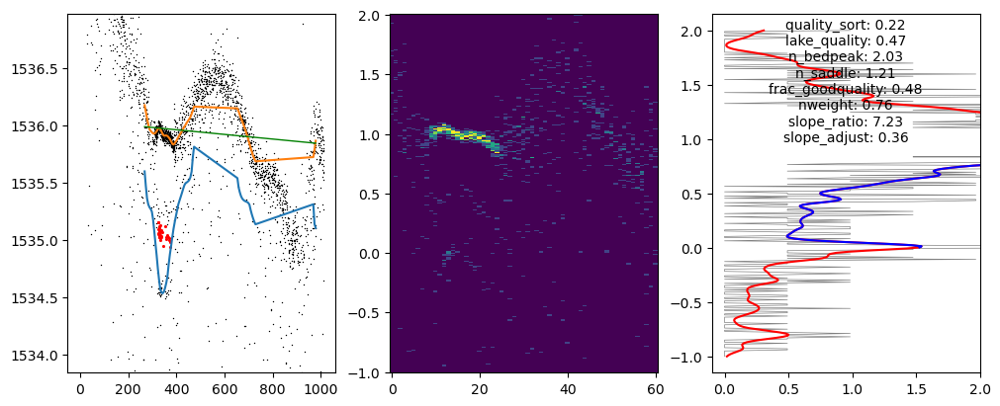

saved zzz_qual_test_sort/lake_099978_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt2r_0007.jpg
0.22037530506745265

_________________________45___________________________________

(0.007927556370987077, 0.03328188497819905)


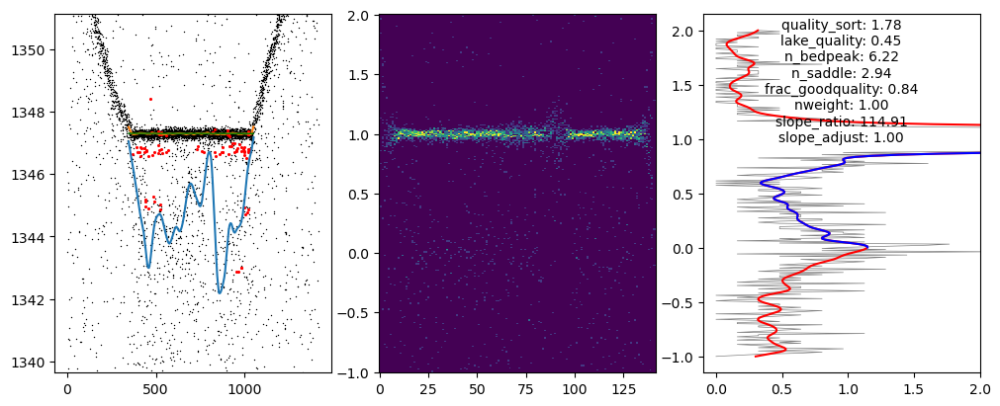

saved zzz_qual_test_sort/lake_099822_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1r_0005.jpg
1.7752905975759057

_________________________46___________________________________

(0.14346759231671058, 0.11179641971289672)


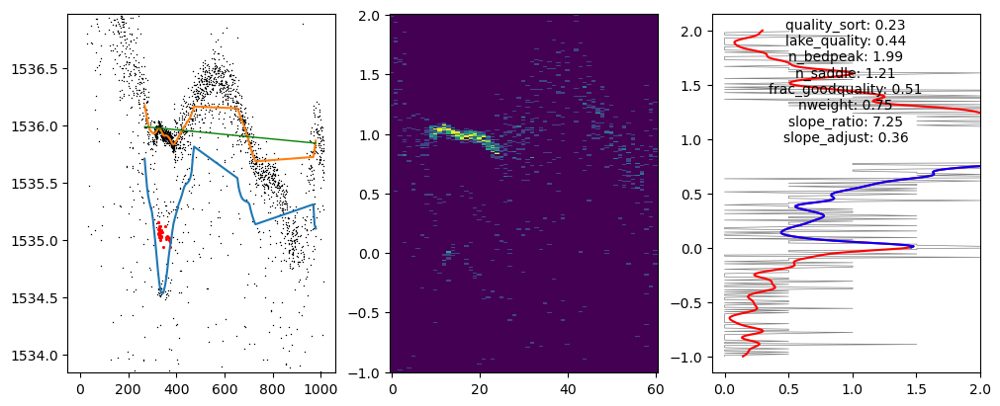

saved zzz_qual_test_sort/lake_099977_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt2r_0006.jpg
0.2269526645923817

_________________________47___________________________________

(0.013048575915036054, 0.05637800470892401)


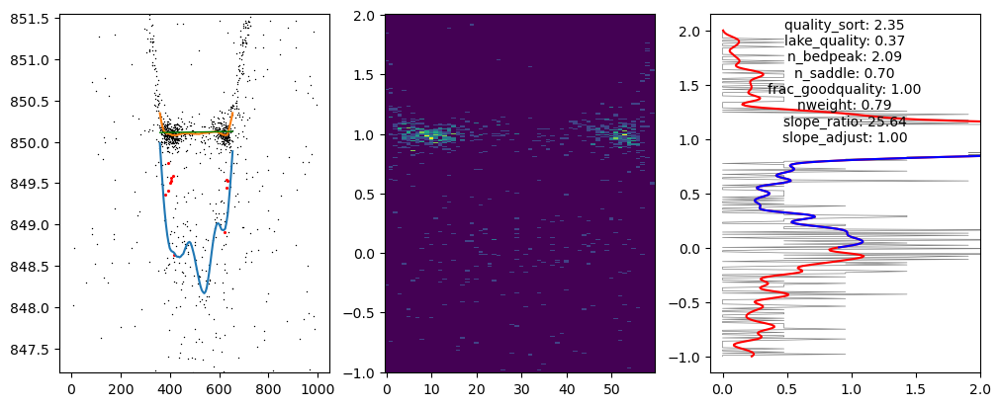

saved zzz_qual_test_sort/lake_099765_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1r_0008.jpg
2.3480777025856225

_________________________48___________________________________

(0.024020506432634647, 0.04815473315181322)


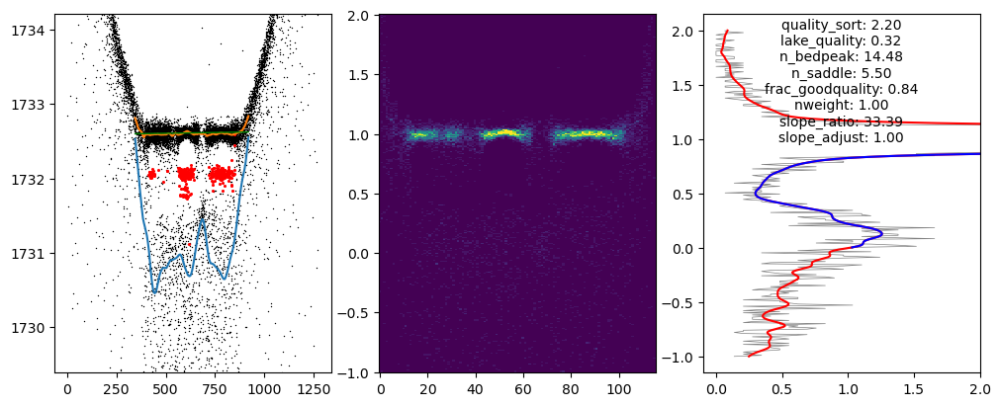

saved zzz_qual_test_sort/lake_099780_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0019.jpg
2.200179477498316

_________________________49___________________________________

(0.04491711077844229, 0.04759637210969036)


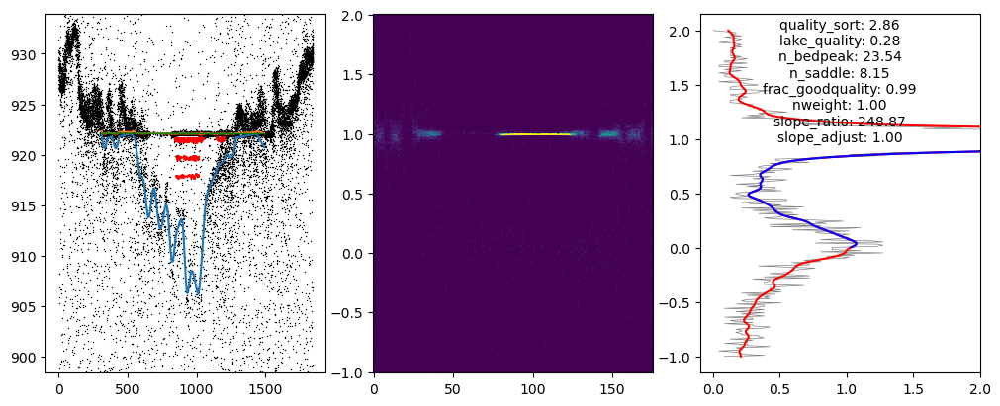

saved zzz_qual_test_sort/lake_099714_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1l_0003.jpg
2.855185780580666

_________________________50___________________________________

(0.024031941605016982, 0.04816219924694434)


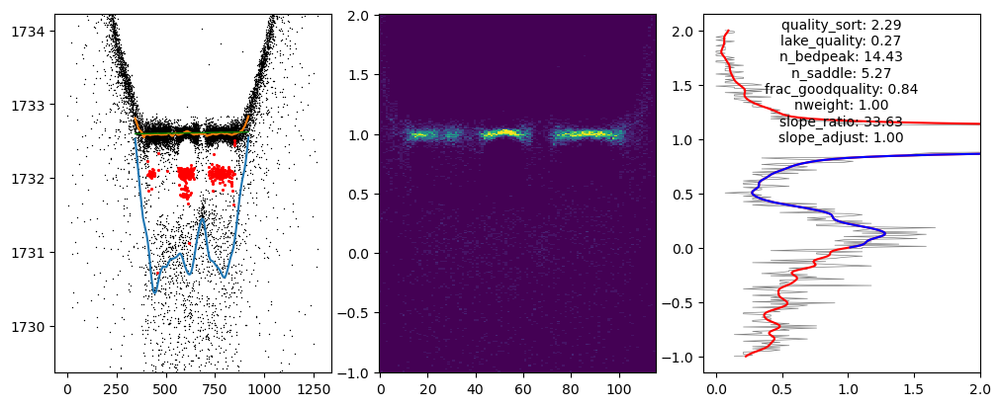

saved zzz_qual_test_sort/lake_099771_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0019.jpg
2.291758326690409

_________________________51___________________________________

(0.05686505980674861, 0.02540670633720472)


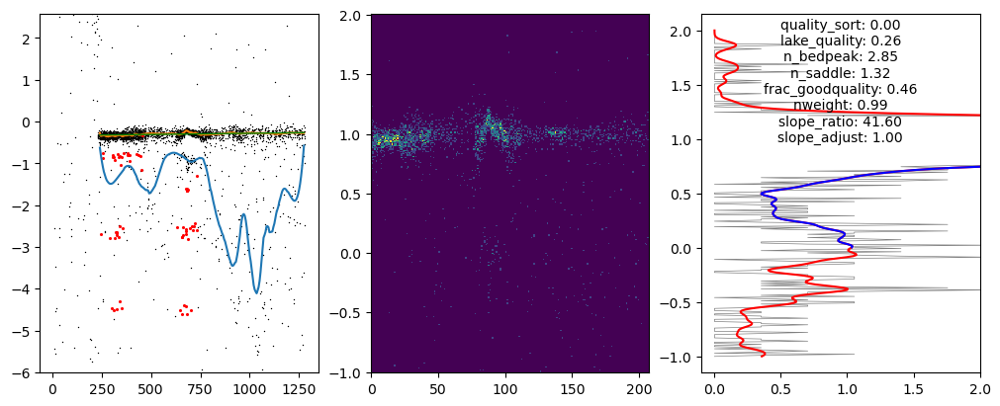

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt3r_0017.jpg
0.0

_________________________52___________________________________

(0.00032926953213063825, 0.04222918868045504)


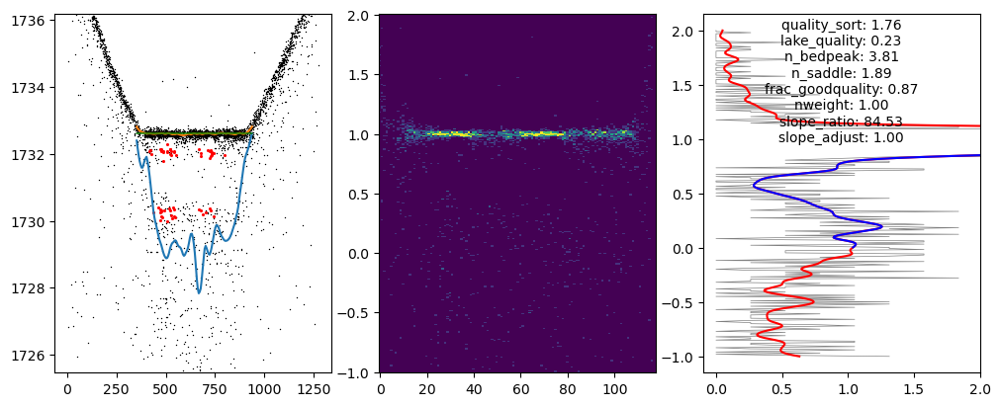

saved zzz_qual_test_sort/lake_099824_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0024.jpg
1.7591561357463497

_________________________53___________________________________

(0.11185716829743342, 0.05862386404338172)


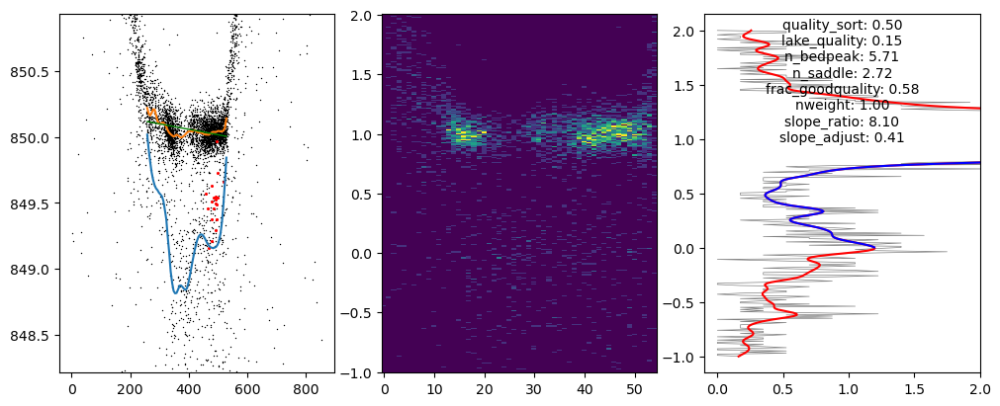

saved zzz_qual_test_sort/lake_099950_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1l_0004.jpg
0.4950842172571523

_________________________54___________________________________

(0.0003510138603814994, 0.04215440553491427)


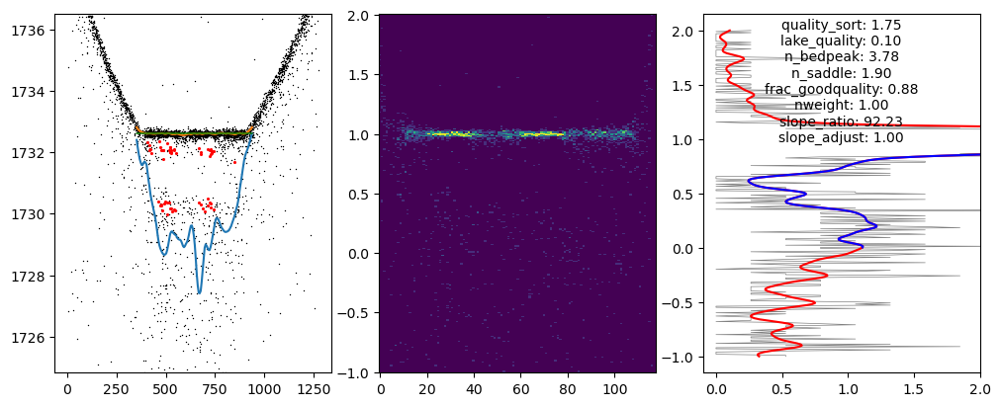

saved zzz_qual_test_sort/lake_099825_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0024.jpg
1.753722017017416

_________________________55___________________________________

(0.04655627641618887, 0.03490977596329827)


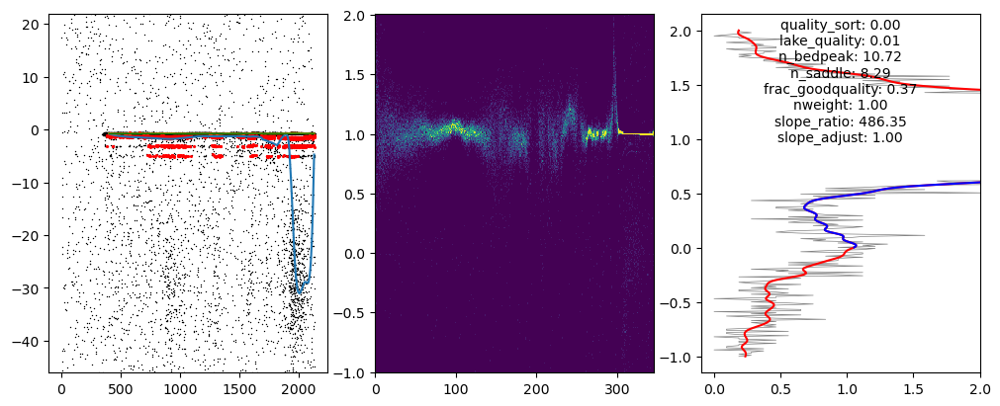

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_CE_ATL03_20230806174214_07262005_006_02_gt3l_0001.jpg
0.0

_________________________56___________________________________

(0.04049599110589952, 0.07978859425160918)


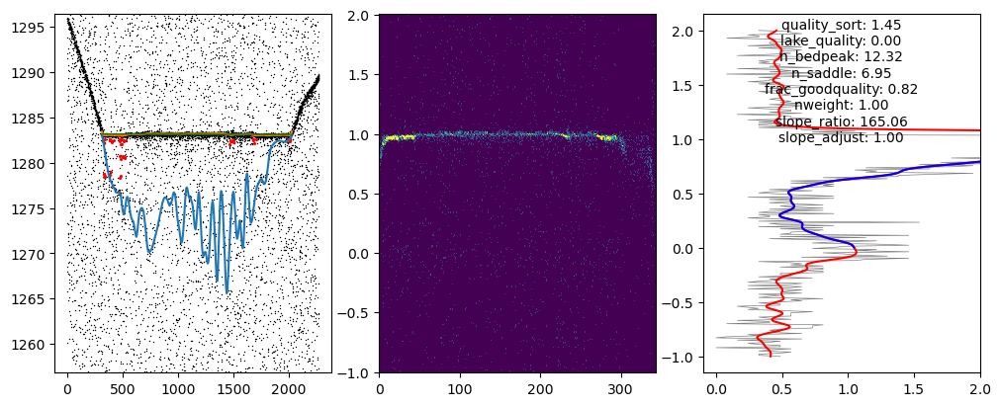

saved zzz_qual_test_sort/lake_099855_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt2r_0012.jpg
1.4538006571037039

_________________________57___________________________________

(0.12539962114919945, 0.06268245869866204)


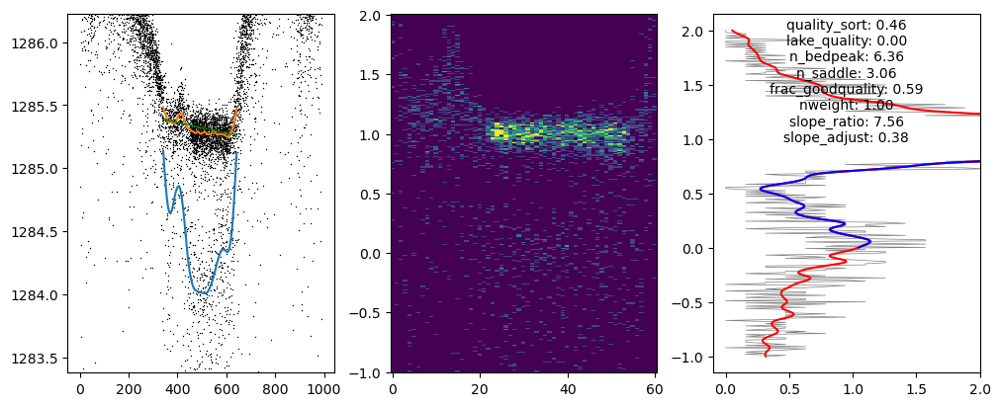

saved zzz_qual_test_sort/lake_099954_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0000.jpg
0.464346165542608

_________________________58___________________________________

(0.2542428290996668, 0.08005895912945307)


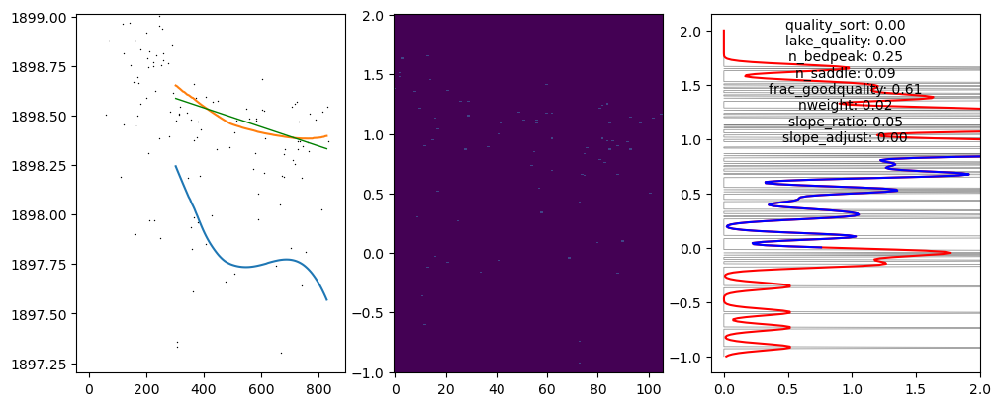

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0014.jpg
7.67563457697111e-05

_________________________59___________________________________

(0.03071803121144967, 0.03320418629504994)


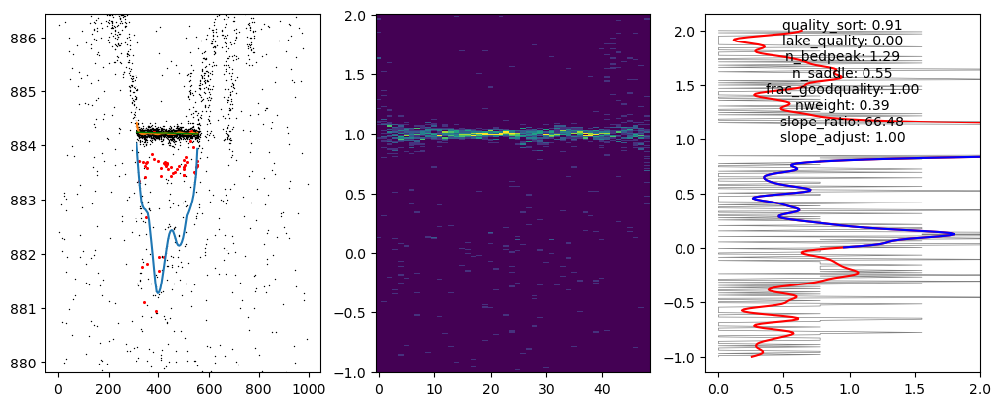

saved zzz_qual_test_sort/lake_099909_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt2r_0013.jpg
0.9145460278376

_________________________60___________________________________

(0.019612061819998416, 0.06463022593983446)


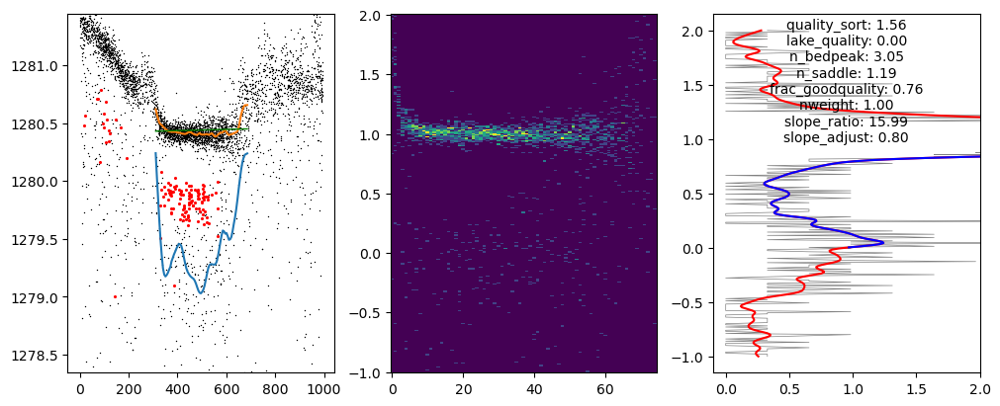

saved zzz_qual_test_sort/lake_099844_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0010.jpg
1.5556193344129527

_________________________61___________________________________

(0.043951823485485875, 0.08892438773280506)


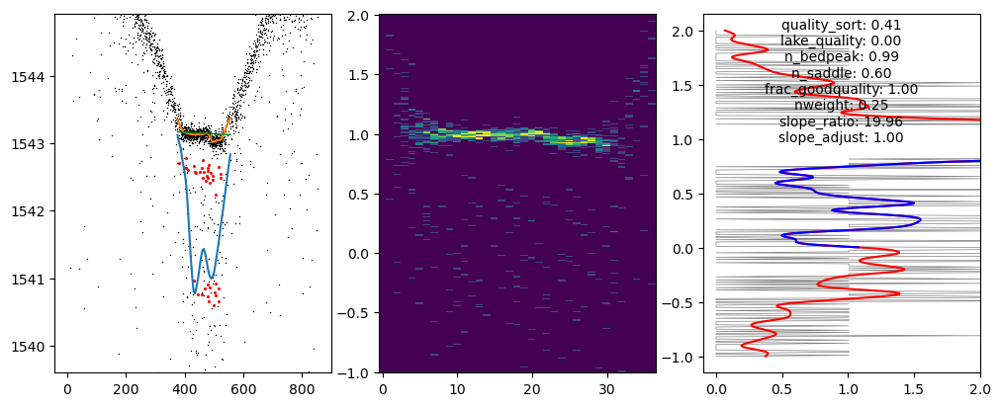

saved zzz_qual_test_sort/lake_099959_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0019.jpg
0.410710980175876

_________________________62___________________________________

(0.03958577083062664, 0.033877481279484443)


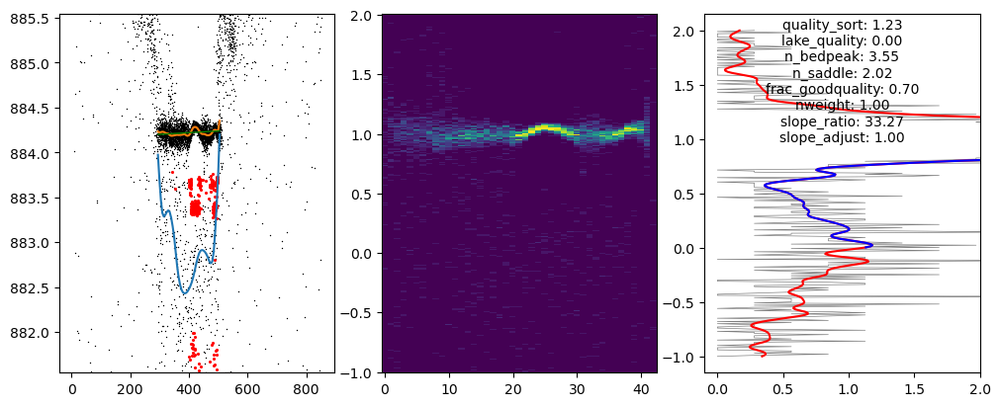

saved zzz_qual_test_sort/lake_099877_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt2l_0010.jpg
1.2264813055479555

_________________________63___________________________________

(0.047238870552185064, 0.02454566120881718)


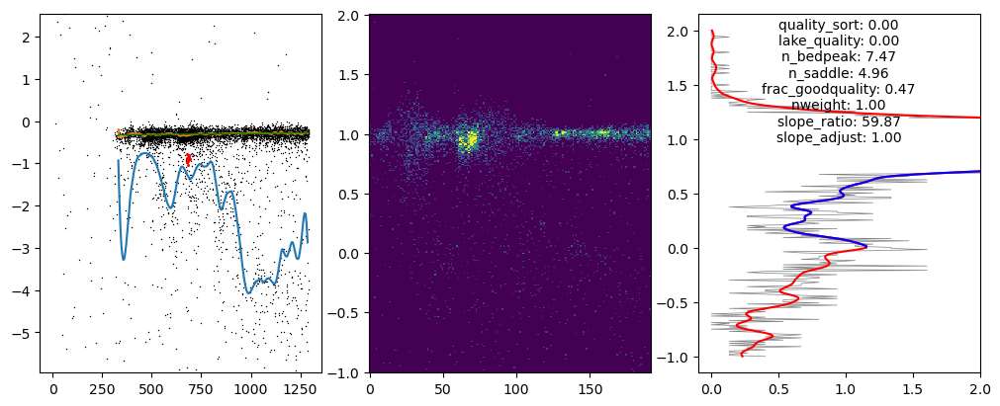

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt3l_0016.jpg
0.0

_________________________64___________________________________

(0.016299054996693485, 0.027176905873871865)


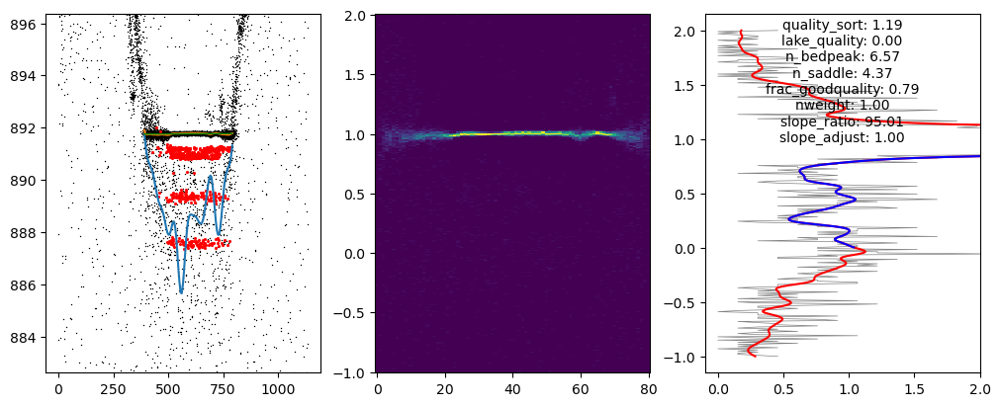

saved zzz_qual_test_sort/lake_099881_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt2l_0011.jpg
1.1864857252822716

_________________________65___________________________________

(0.15938324492412903, 0.06792987675899576)


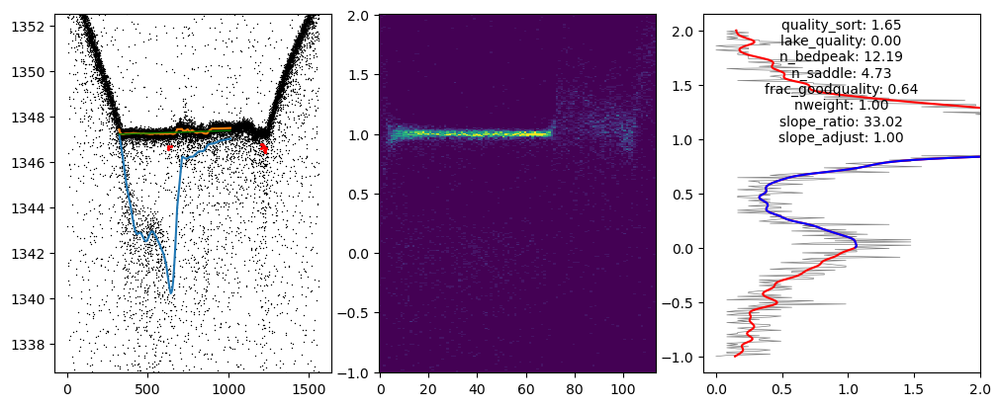

saved zzz_qual_test_sort/lake_099835_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1l_0001.jpg
1.6499562691355816

_________________________66___________________________________

(0.019225097366188493, 0.06441747173107926)


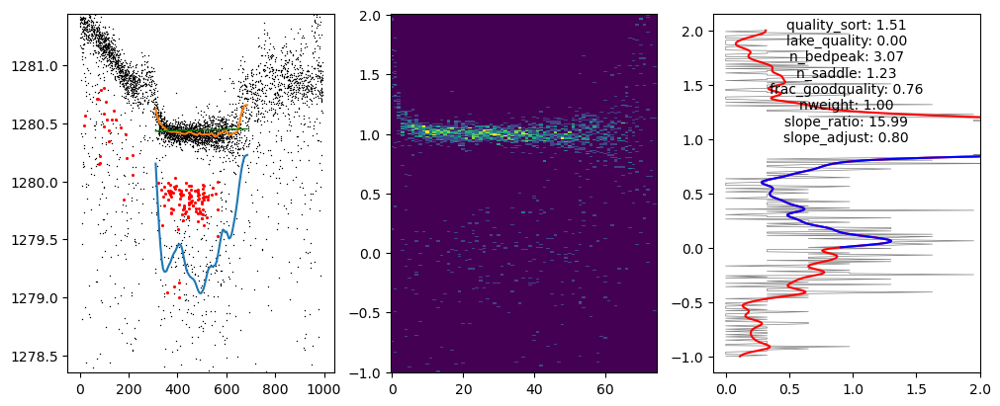

saved zzz_qual_test_sort/lake_099849_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0010.jpg
1.5135334250102745

_________________________67___________________________________

(0.03205043418256537, 0.10494720152907505)


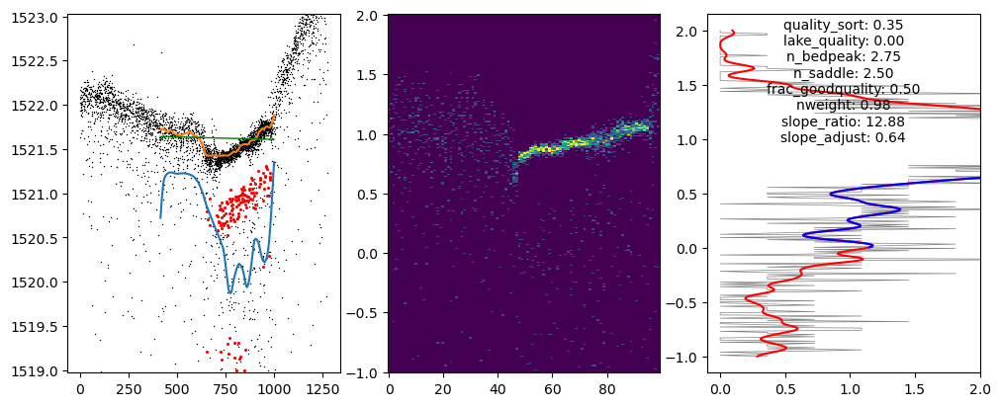

saved zzz_qual_test_sort/lake_099965_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0023.jpg
0.3494013916776248

_________________________68___________________________________

(0.11412816934443981, 0.05706867549066993)


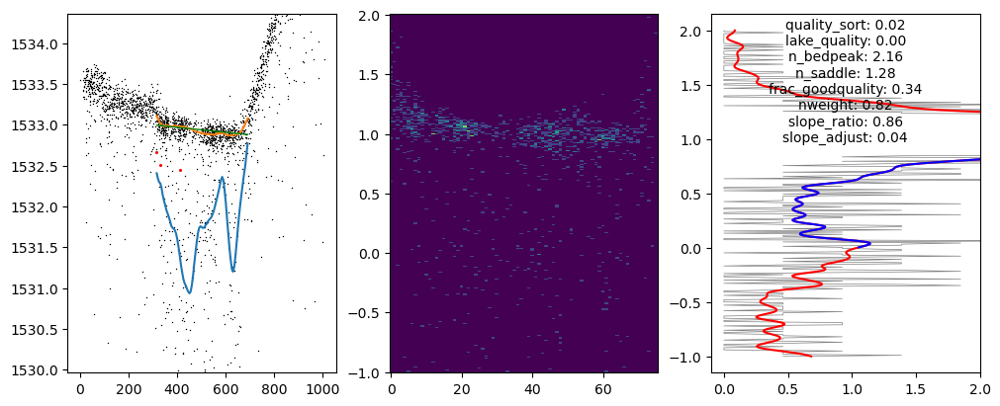

saved zzz_qual_test_sort/lake_099998_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0017.jpg
0.020396658291030347

_________________________69___________________________________

(0.011420352739605732, 0.07329210970668053)


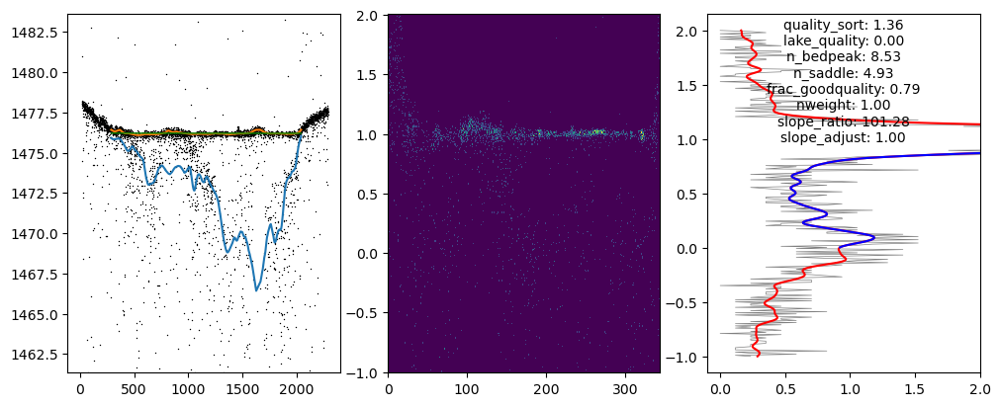

saved zzz_qual_test_sort/lake_099864_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0018.jpg
1.358410469716132

_________________________70___________________________________

(0.03190286868266412, 0.10493260437227862)


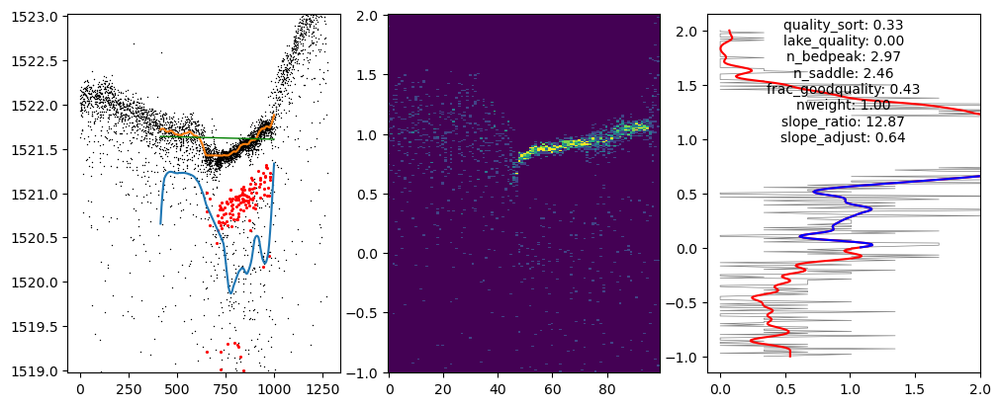

saved zzz_qual_test_sort/lake_099967_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0023.jpg
0.33413453298990925

_________________________71___________________________________

(0.06487282076432166, 0.06799548909757125)


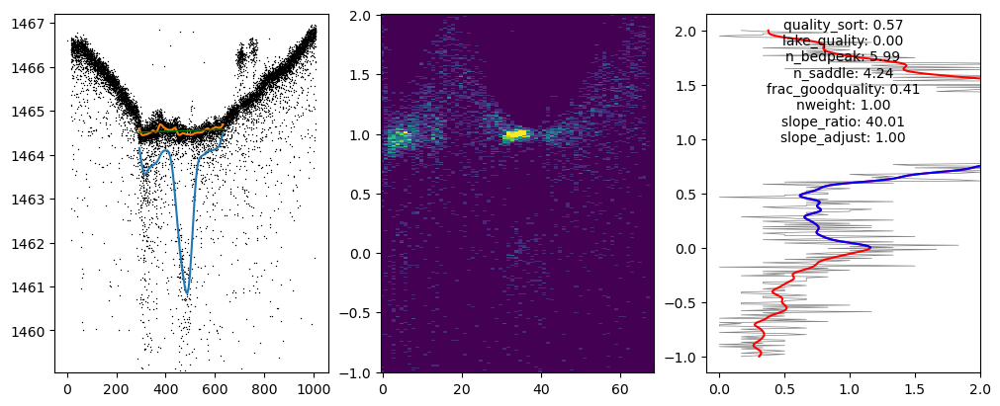

saved zzz_qual_test_sort/lake_099943_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1l_0001.jpg
0.5730635370078729

_________________________72___________________________________

(0.04445105358435486, 0.021668392417038253)


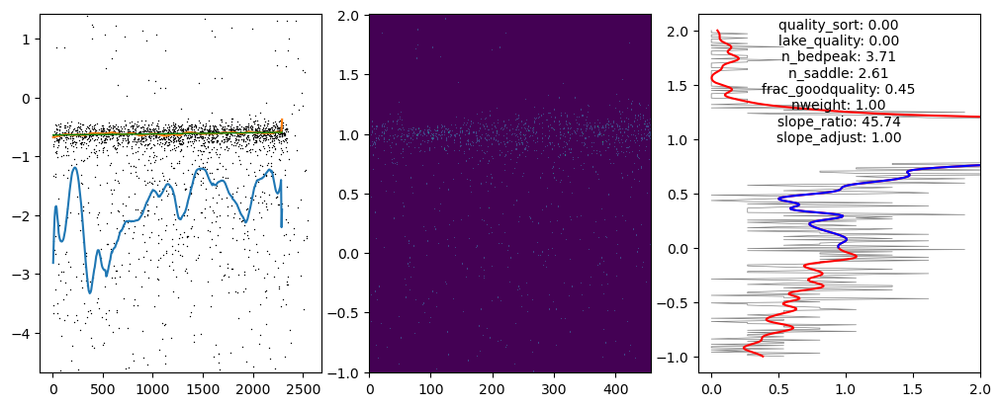

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt2r_0011.jpg
0.0

_________________________73___________________________________

(0.11411569267534105, 0.05700560707809931)


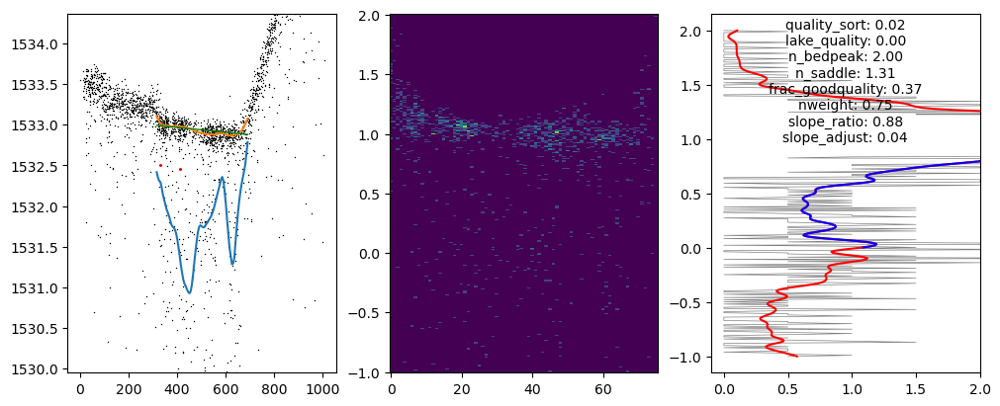

saved zzz_qual_test_sort/lake_099998_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0020.jpg
0.018544288987192247

_________________________74___________________________________

(0.05386340166978698, 0.06621109570801084)


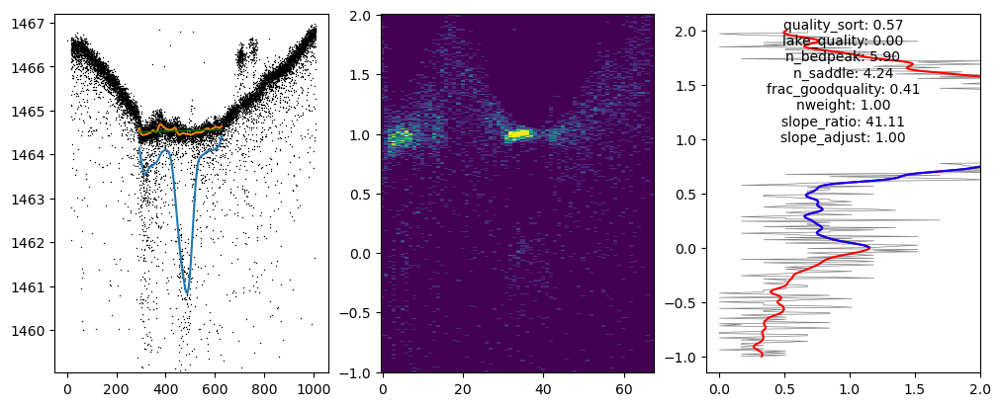

saved zzz_qual_test_sort/lake_099943_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1l_0001.jpg
0.5732038290615724

_________________________75___________________________________

(0.019825731214950792, 0.04803409759448545)


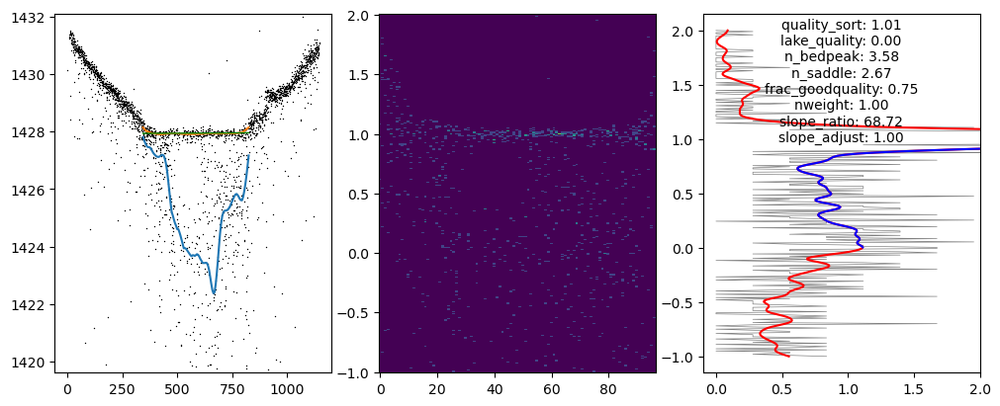

saved zzz_qual_test_sort/lake_099899_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1r_0004.jpg
1.0092511117954124

_________________________76___________________________________

(0.011575929253240247, 0.07322381614733917)


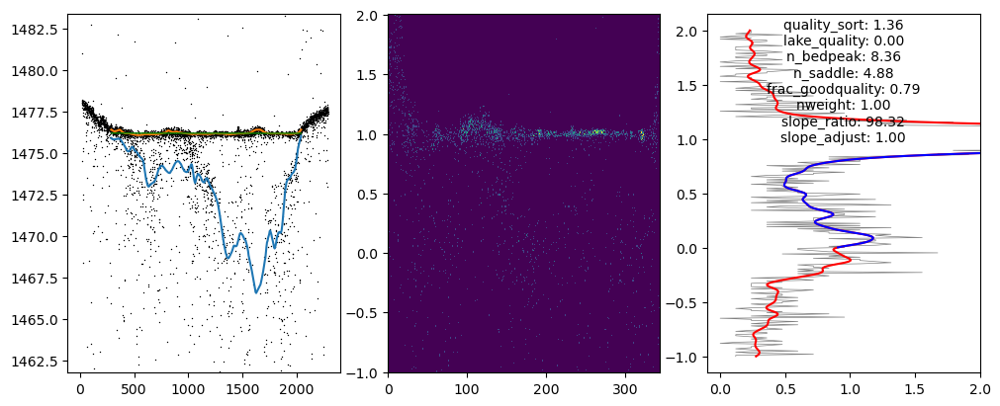

saved zzz_qual_test_sort/lake_099864_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0021.jpg
1.3590656208472542

_________________________77___________________________________

(0.045177775289403144, 0.06666112924739462)


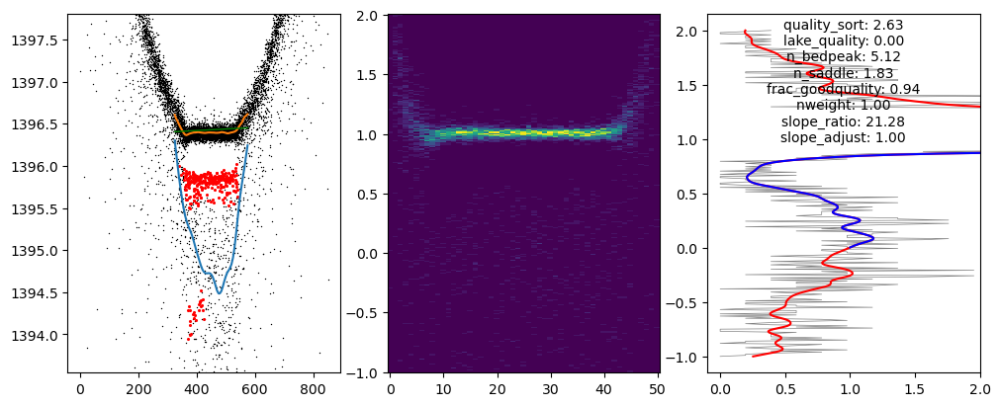

saved zzz_qual_test_sort/lake_099737_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3l_0027.jpg
2.6313352761053266

_________________________78___________________________________

(0.04521839457333954, 0.06669128064065581)


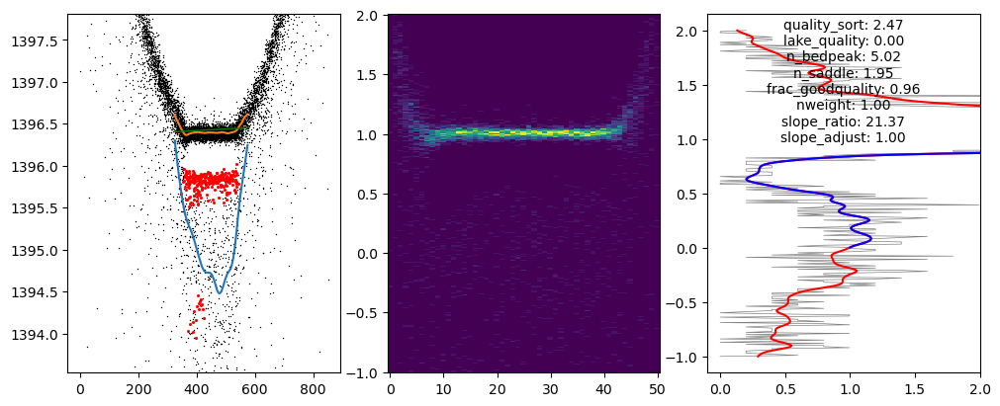

saved zzz_qual_test_sort/lake_099753_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3l_0027.jpg
2.474405986992569

_________________________79___________________________________

(0.15154133222631572, 0.10027720591778262)


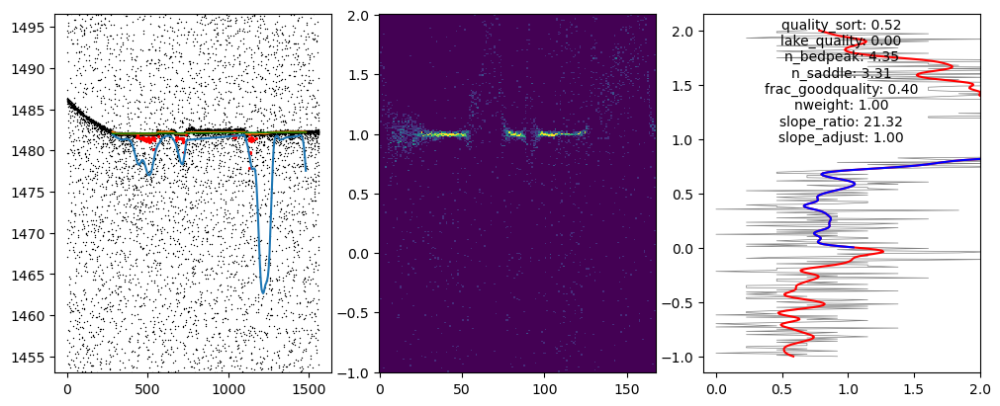

saved zzz_qual_test_sort/lake_099948_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt3r_0018.jpg
0.5233337511334057

_________________________80___________________________________



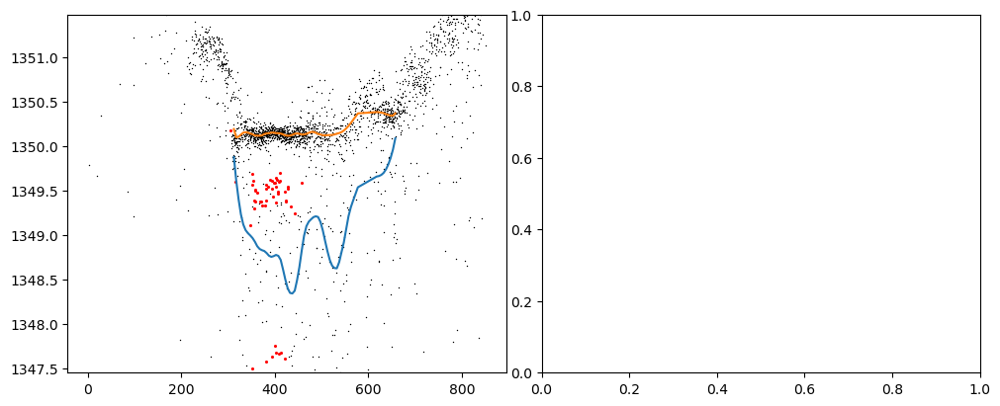

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0021.jpg
0.0

_________________________81___________________________________



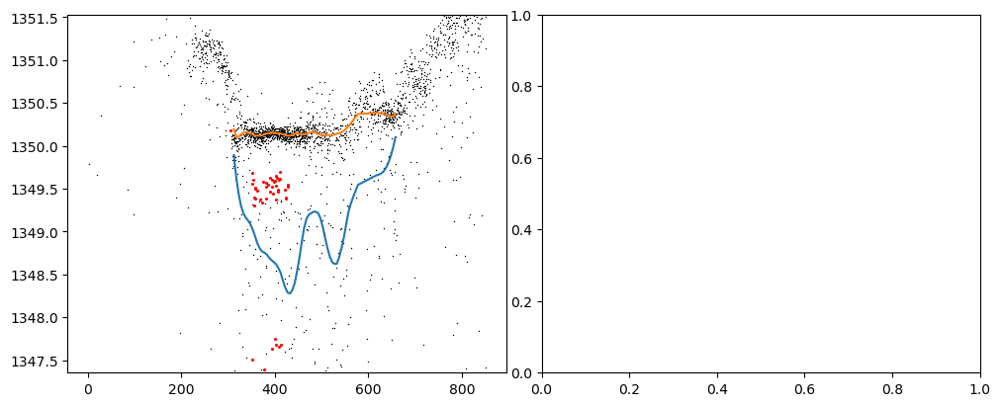

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0021.jpg
0.0

_________________________82___________________________________

(0.049244534877061596, 0.08411668849392266)


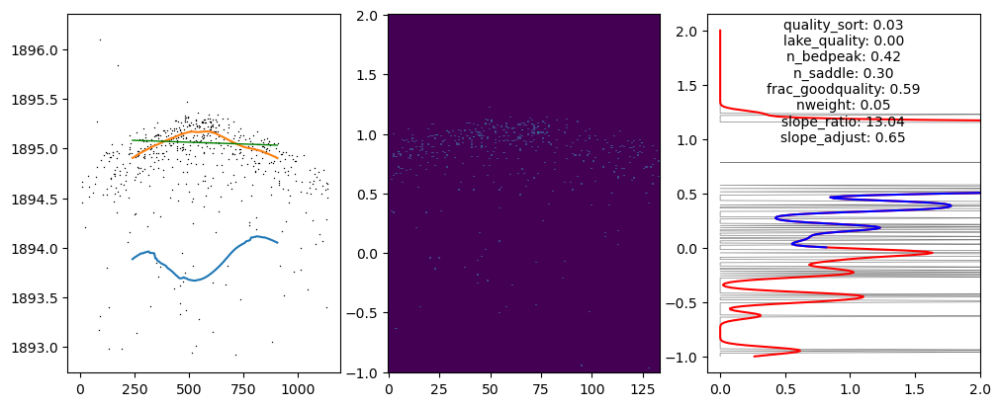

saved zzz_qual_test_sort/lake_099997_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0015.jpg
0.02613916886743922

_________________________83___________________________________

(0.04276354388207437, 0.0889664441761358)


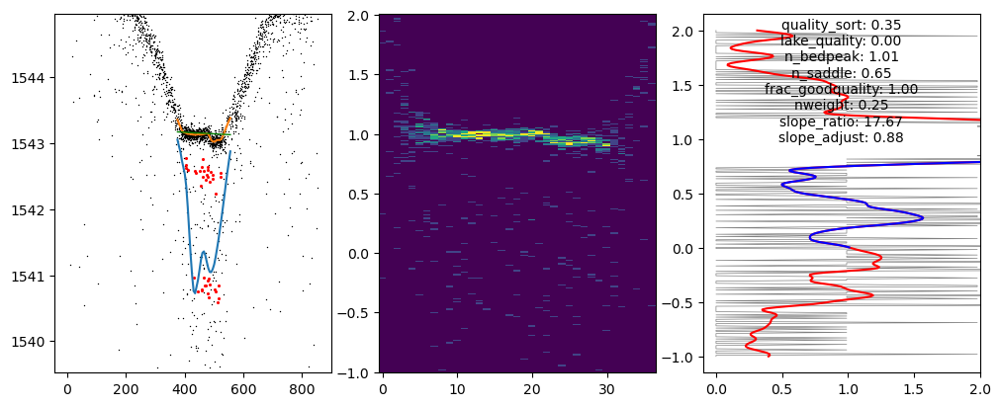

saved zzz_qual_test_sort/lake_099965_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0016.jpg
0.34914608244159256

_________________________84___________________________________

(0.1489103525759674, 0.08442677105598989)


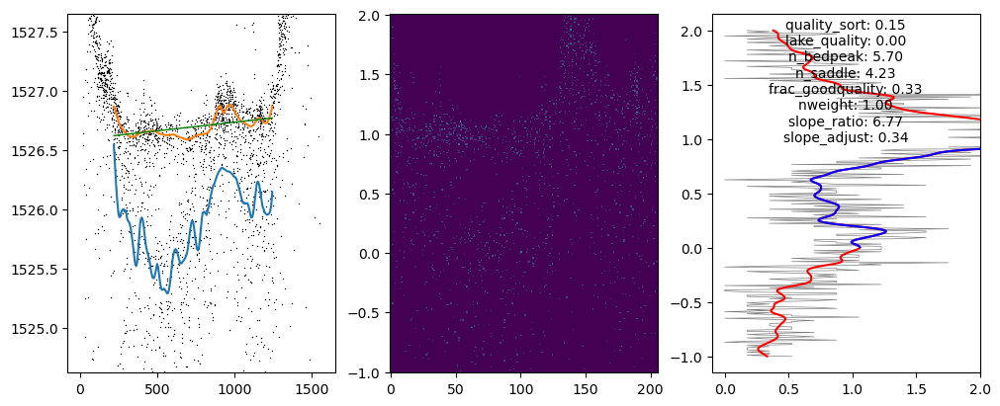

saved zzz_qual_test_sort/lake_099985_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt2r_0008.jpg
0.14823401587994103

_________________________85___________________________________

(0.14867817085769275, 0.08435444504044368)


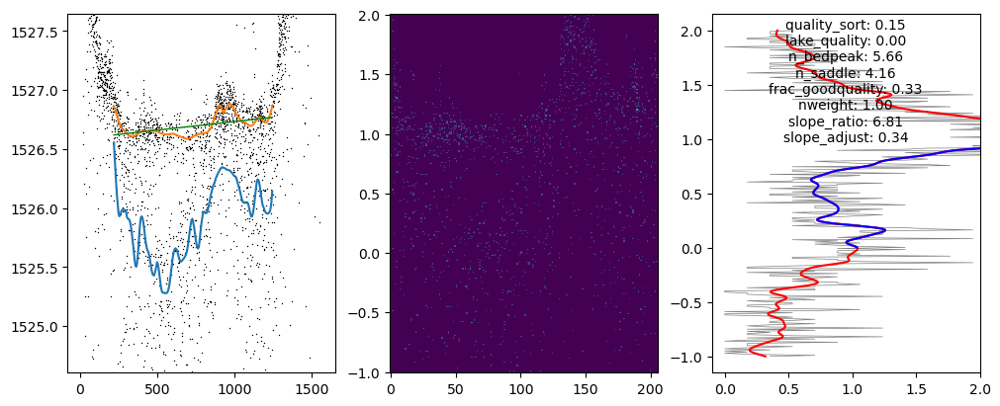

saved zzz_qual_test_sort/lake_099985_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt2r_0007.jpg
0.15069129423819244

_________________________86___________________________________

(0.020616319910686798, 0.0502902748688273)


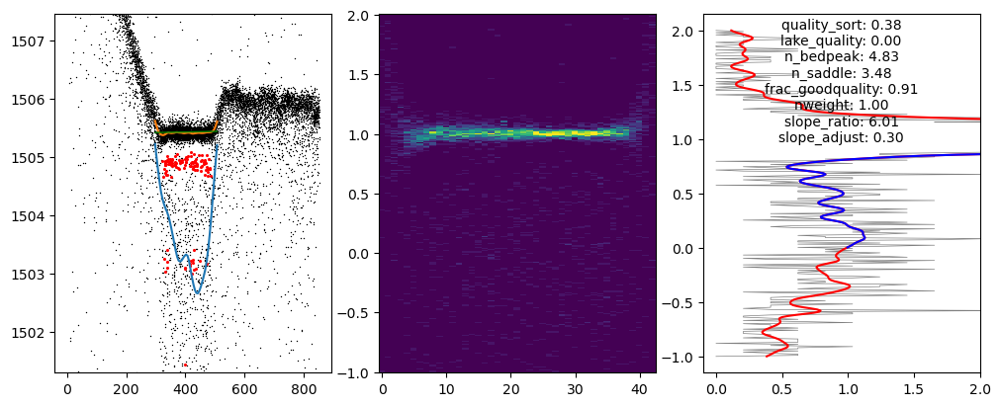

saved zzz_qual_test_sort/lake_099962_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt1l_0000.jpg
0.37878933371531376

_________________________87___________________________________

(0.020125585754158237, 0.048026491990367064)


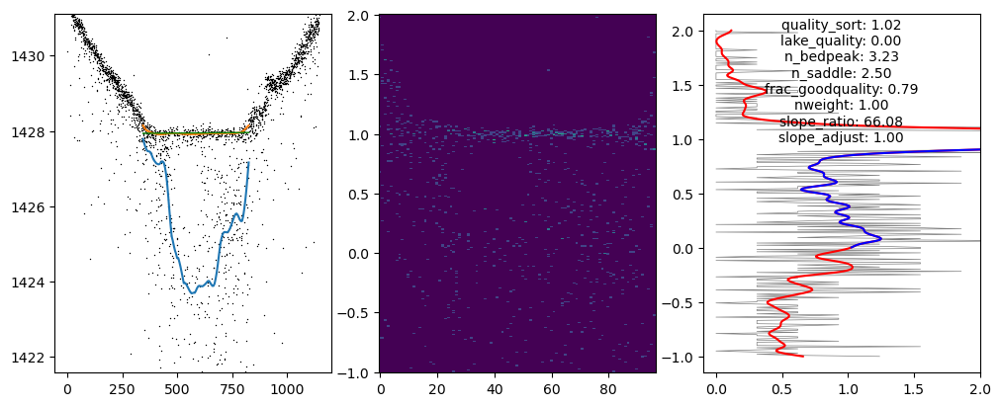

saved zzz_qual_test_sort/lake_099898_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1r_0004.jpg
1.0238854457276307

_________________________88___________________________________

(0.08370286350213973, 0.056133104227105775)


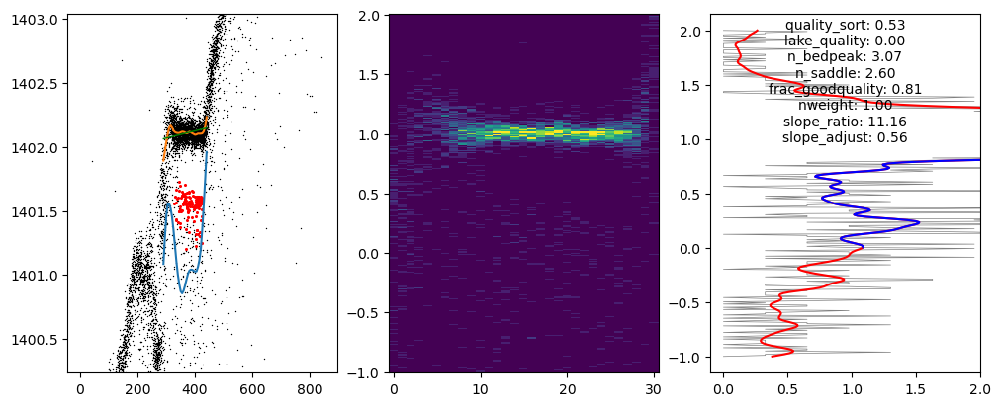

saved zzz_qual_test_sort/lake_099947_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3l_0026.jpg
0.5296410812959598

_________________________89___________________________________

(0.08366275872526785, 0.05611432813375477)


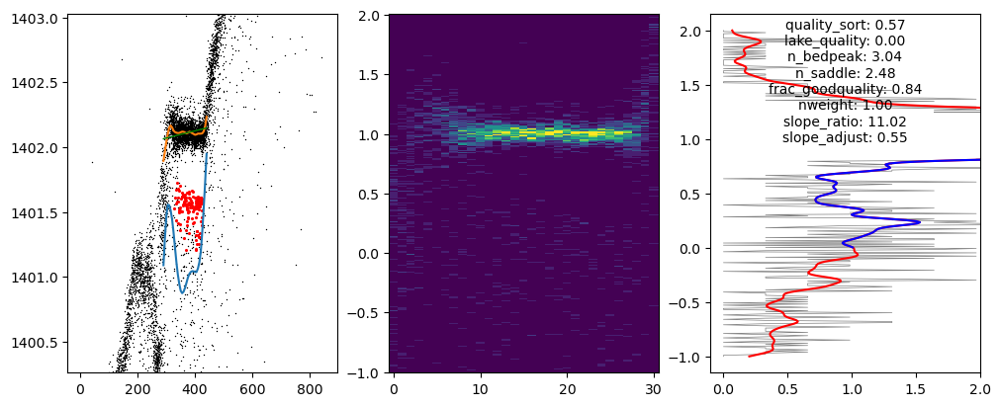

saved zzz_qual_test_sort/lake_099943_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt3l_0026.jpg
0.5661817422783081

_________________________90___________________________________

(0.066151627976069, 0.0873125594145604)


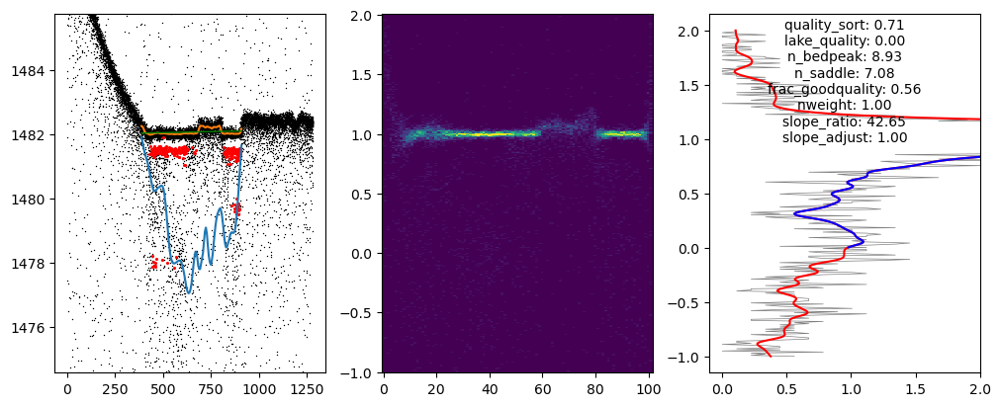

saved zzz_qual_test_sort/lake_099929_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt3l_0015.jpg
0.7053561263780774

_________________________91___________________________________

(0.010482285212958686, 0.02203247366966045)


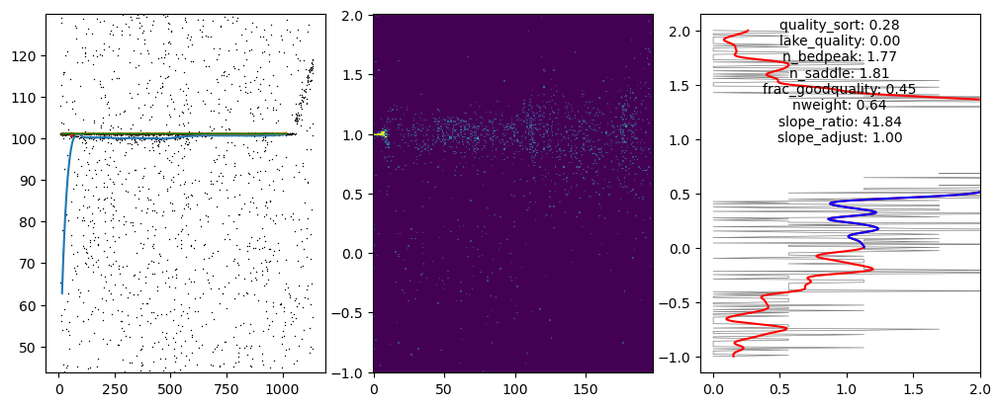

saved zzz_qual_test_sort/lake_099972_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt1r_0004.jpg
0.2842896175751815

_________________________92___________________________________



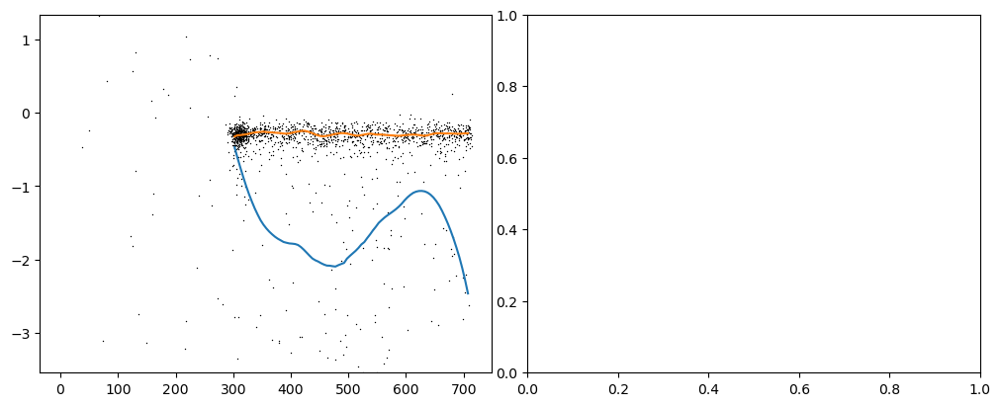

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt2l_0010.jpg
0.0

_________________________93___________________________________

(0.09857111180212996, 0.06553597473271133)


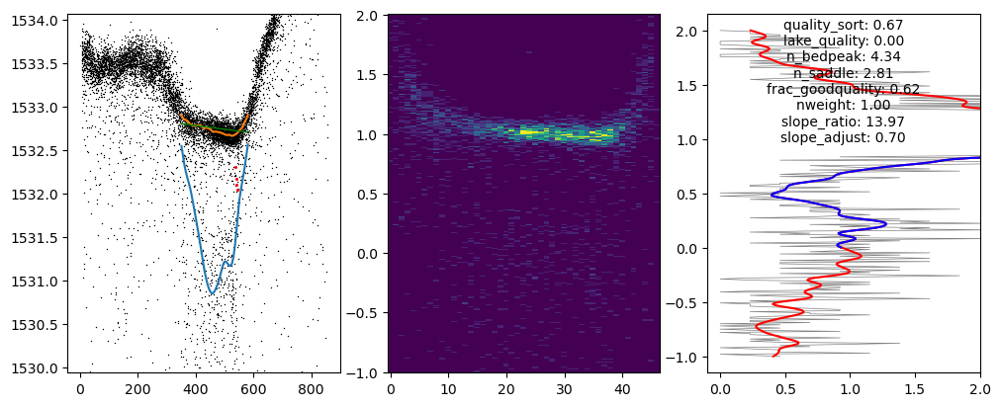

saved zzz_qual_test_sort/lake_099933_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0011.jpg
0.6657356891158486

_________________________94___________________________________

(0.14316953780985386, 0.09991502082838942)


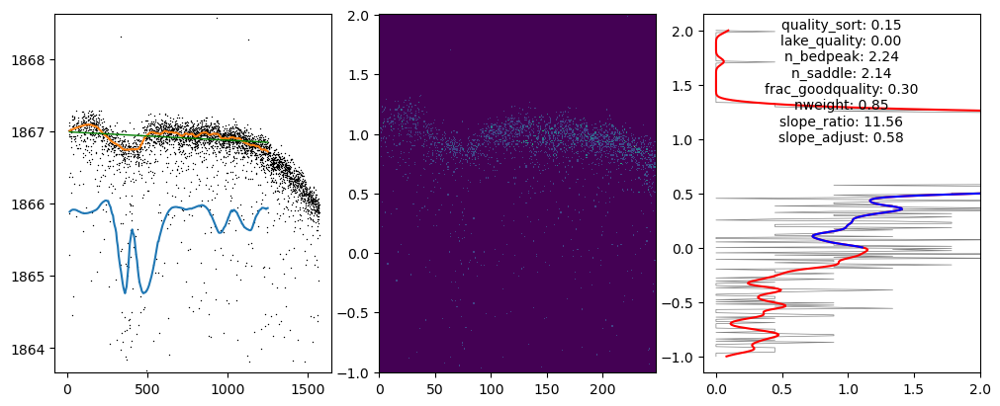

saved zzz_qual_test_sort/lake_099985_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt2r_0006.jpg
0.1530521455494595

_________________________95___________________________________

(0.09856439510940618, 0.06558347142172744)


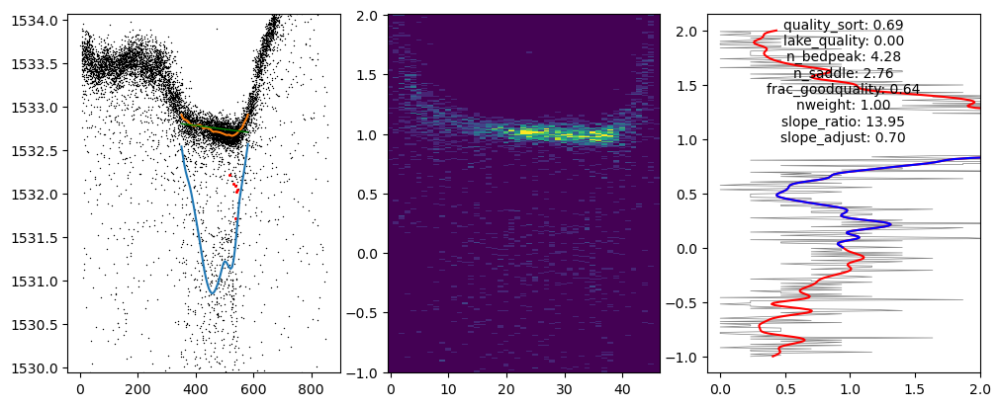

saved zzz_qual_test_sort/lake_099931_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0010.jpg
0.6893275919533992

_________________________96___________________________________

(0.13167578330421748, 0.12808024942114324)


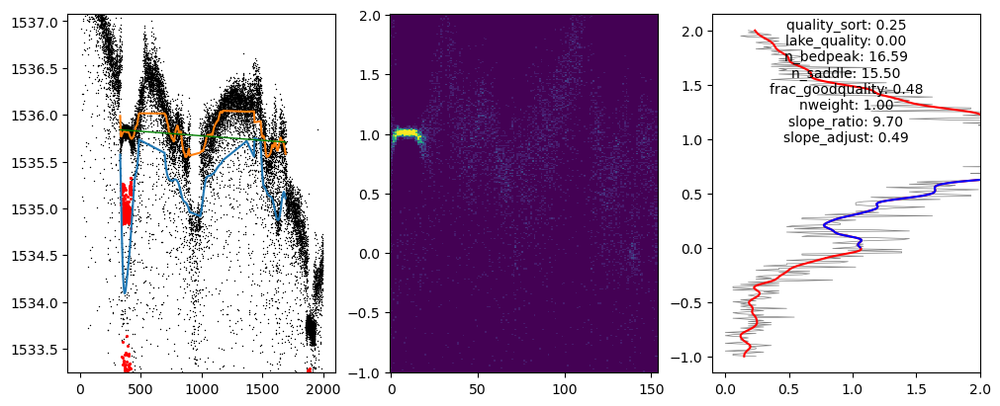

saved zzz_qual_test_sort/lake_099975_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt2l_0005.jpg
0.24951770067886817

_________________________97___________________________________

(0.03648250607420778, 0.05640680592280972)


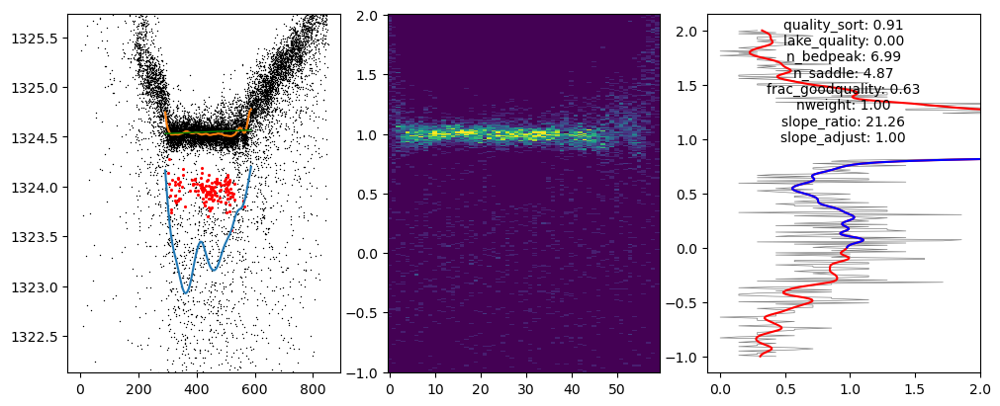

saved zzz_qual_test_sort/lake_099909_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0004.jpg
0.9101858178904196

_________________________98___________________________________

(0.011608364222043366, 0.025750958101335524)


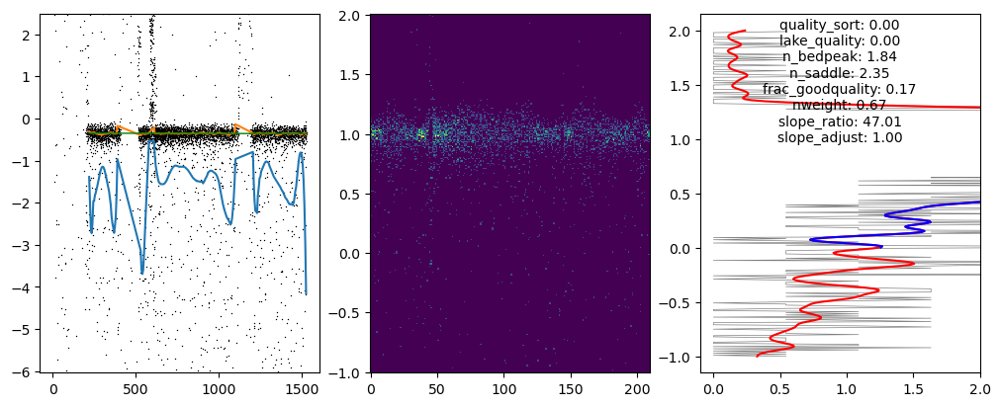

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt1l_0001.jpg
0.0

_________________________99___________________________________

(0.03785900986866264, 0.02620413358246679)


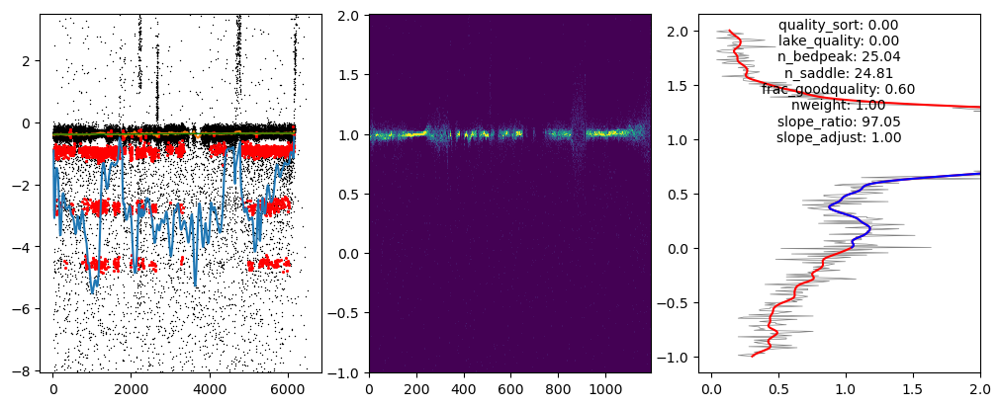

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt1l_0002.jpg
0.0

_________________________100___________________________________

(0.02571508553418106, 0.038001089686238824)


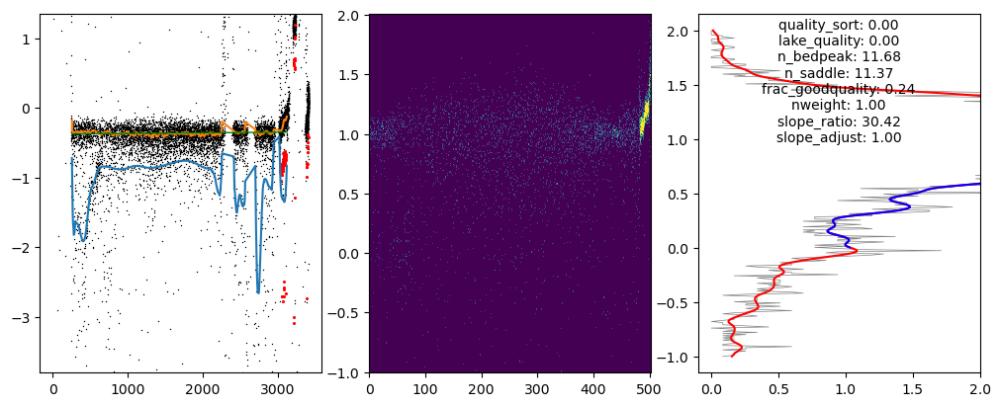

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt2l_0008.jpg
0.0

_________________________101___________________________________

(0.03658395039587958, 0.05642263868038774)


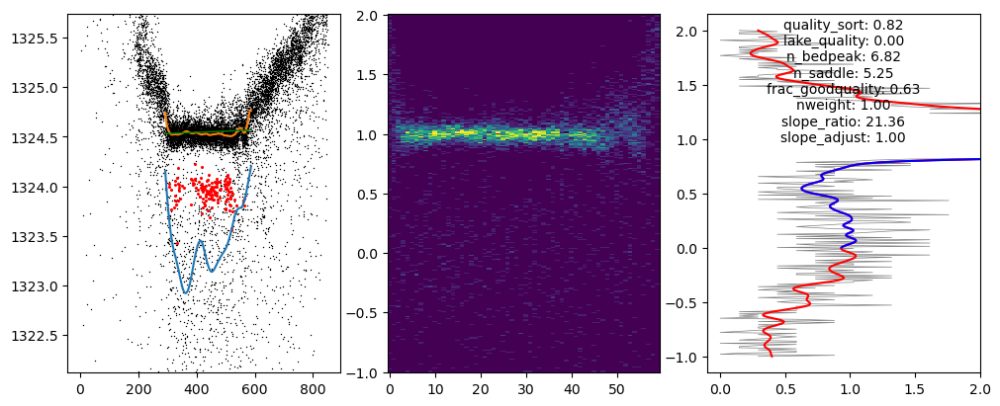

saved zzz_qual_test_sort/lake_099918_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0004.jpg
0.821870116873124

_________________________102___________________________________

(0.10621441706393853, 0.07553360133749573)


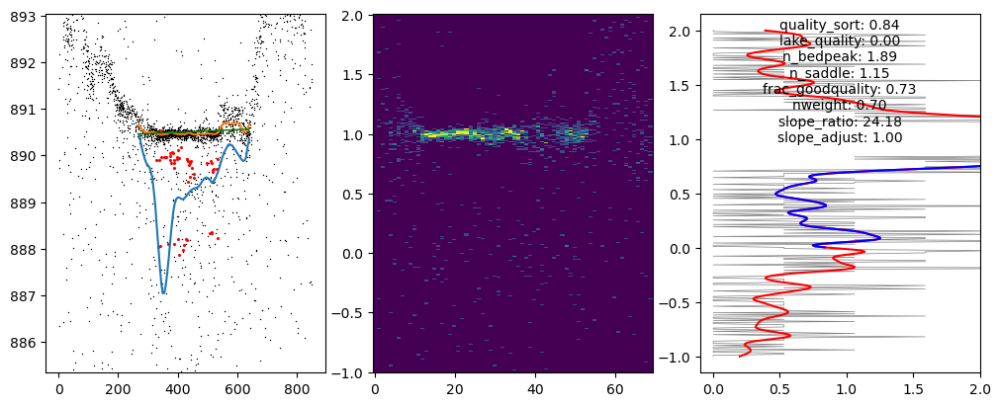

saved zzz_qual_test_sort/lake_099916_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt3r_0019.jpg
0.8351093493641609

_________________________103___________________________________

(0.04990140024665379, 0.08414263047785103)


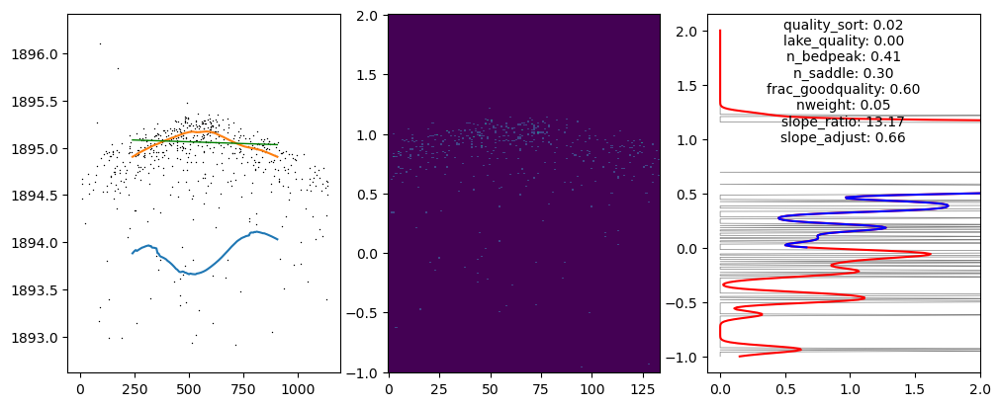

saved zzz_qual_test_sort/lake_099998_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0018.jpg
0.023744090581084513

_________________________104___________________________________

(0.05289568537159539, 0.04028455451063695)


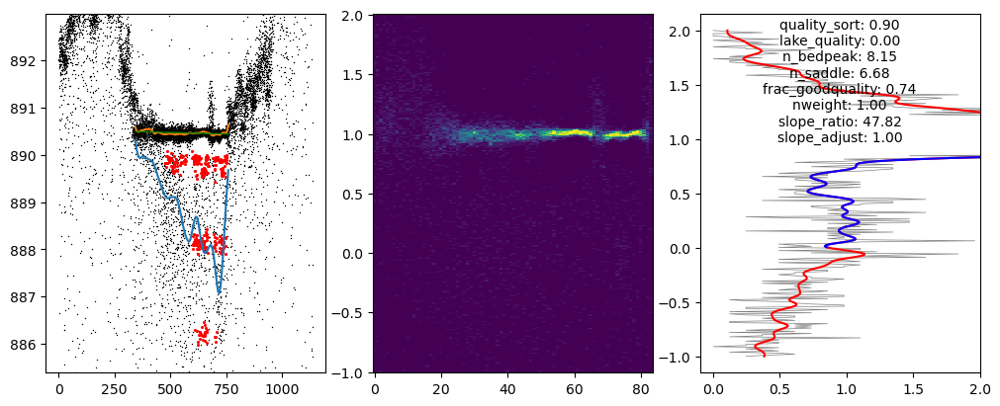

saved zzz_qual_test_sort/lake_099910_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806191631_07272005_006_02_gt3l_0016.jpg
0.9002261900072208

_________________________105___________________________________

(0.07875573818993353, 0.028698298298601158)


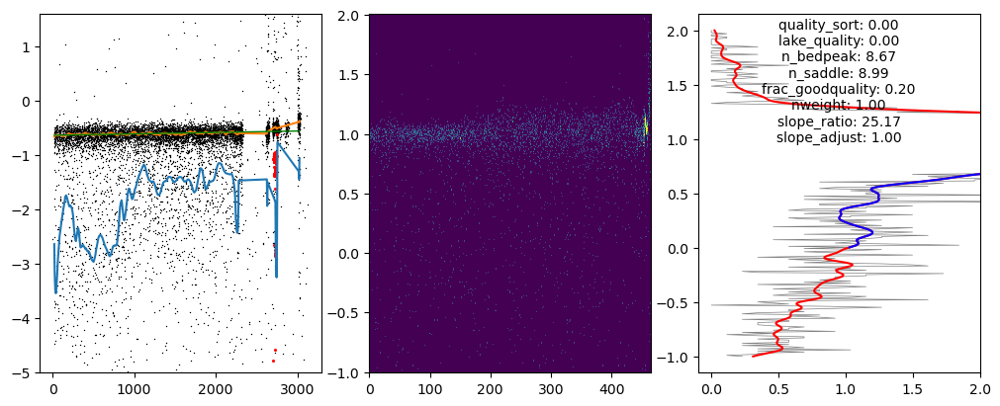

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt2l_0006.jpg
0.0

_________________________106___________________________________

(0.1382575086754514, 0.06687342617851696)


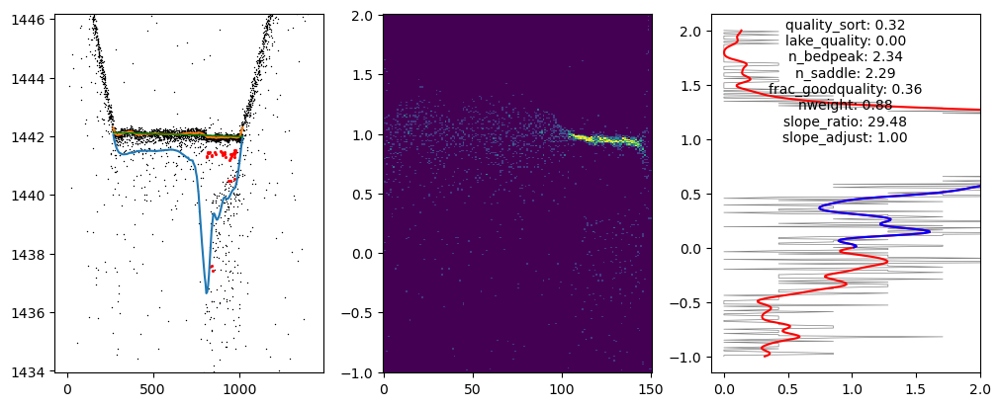

saved zzz_qual_test_sort/lake_099968_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0022.jpg
0.32322204266229154

_________________________107___________________________________

(0.100418699441434, 0.06266023355263403)


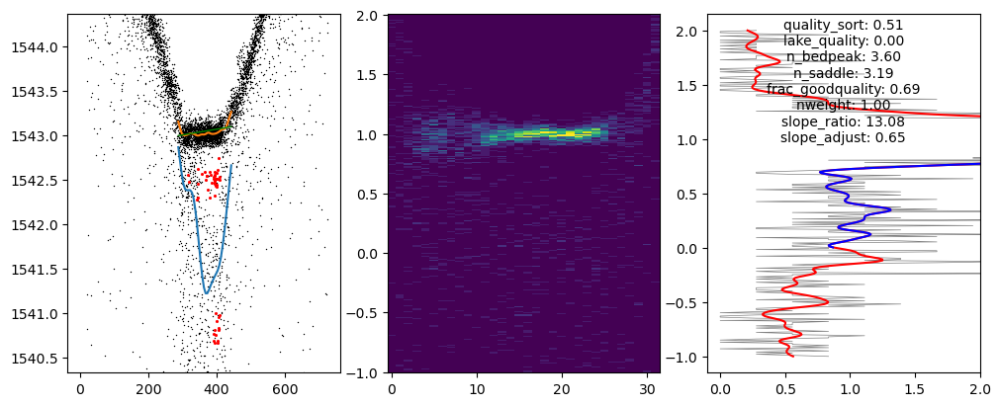

saved zzz_qual_test_sort/lake_099949_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0009.jpg
0.5071634921830968

_________________________108___________________________________

(0.09997111110465084, 0.06268427414880157)


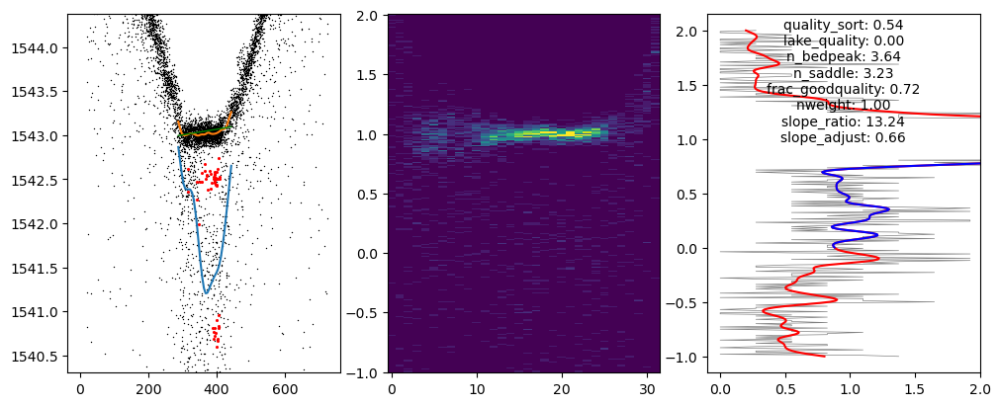

saved zzz_qual_test_sort/lake_099946_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3l_0008.jpg
0.5352995224760185

_________________________109___________________________________

(0.12228014058882763, 0.06817608478045288)


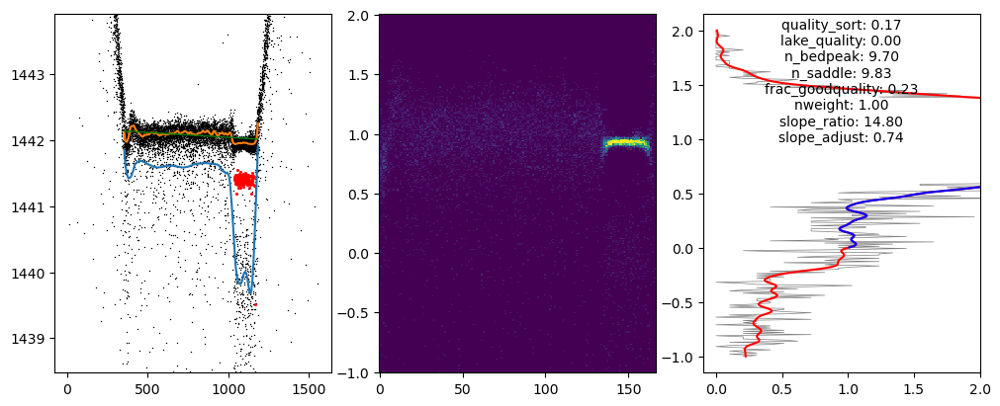

saved zzz_qual_test_sort/lake_099983_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0017.jpg
0.17054067254859956

_________________________110___________________________________

(0.12224278292592317, 0.06823006369719367)


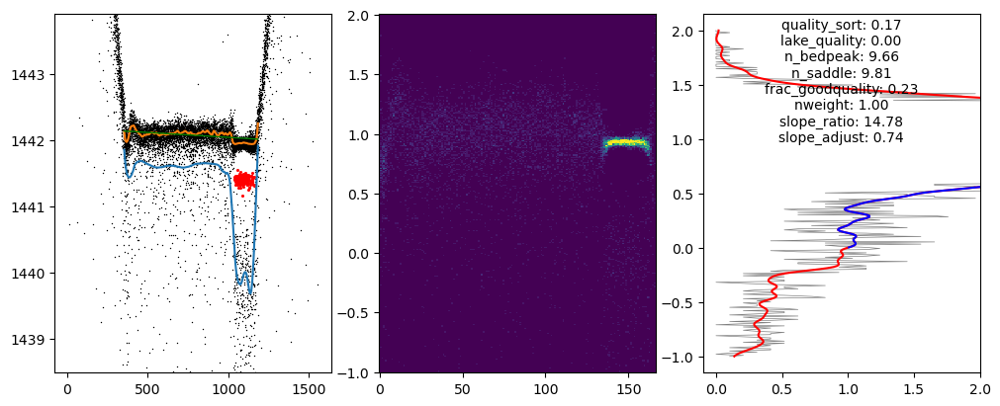

saved zzz_qual_test_sort/lake_099983_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0017.jpg
0.1698720056410894

_________________________111___________________________________

(0.12320416219699837, 0.07621670760954825)


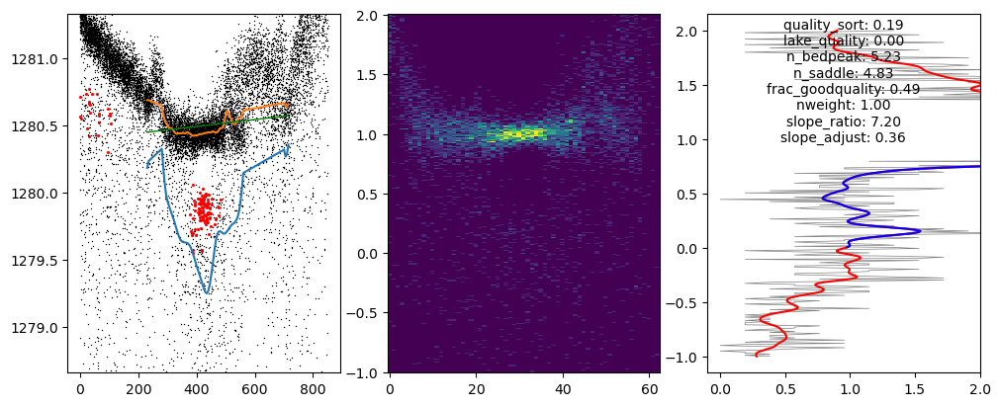

saved zzz_qual_test_sort/lake_099981_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0003.jpg
0.1916636959817282

_________________________112___________________________________



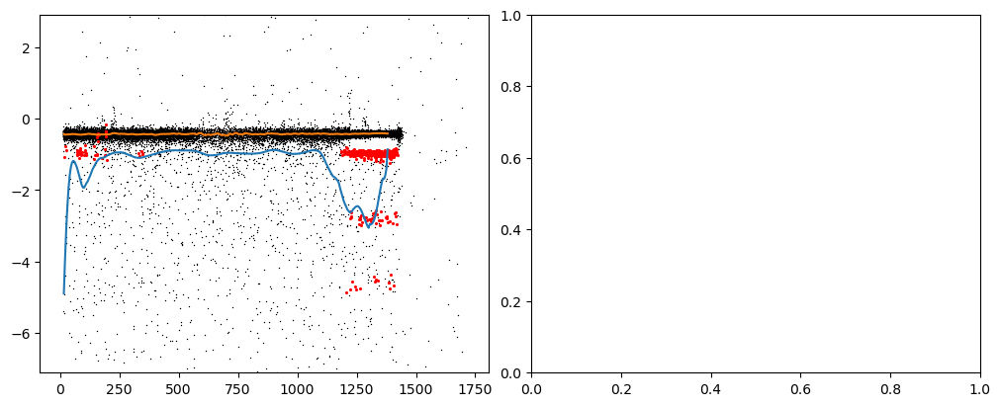

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt2l_0009.jpg
0.0

_________________________113___________________________________

(0.06519787942966104, 0.09141222517048672)


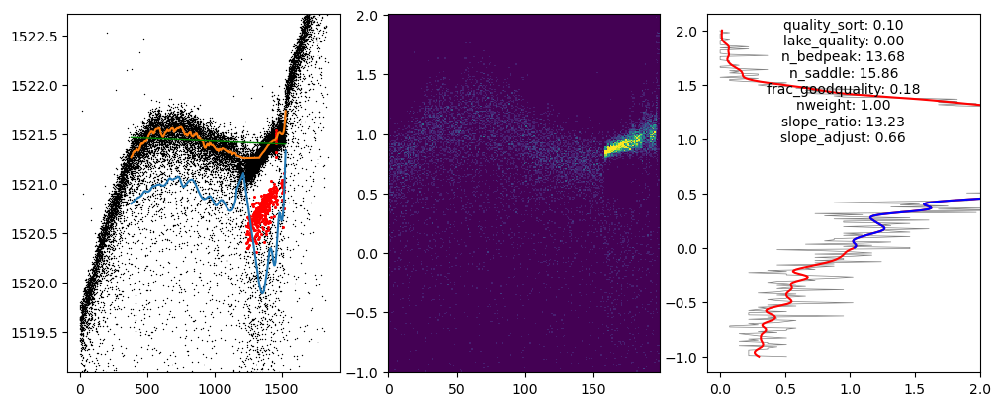

saved zzz_qual_test_sort/lake_099990_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0018.jpg
0.10328790855018258

_________________________114___________________________________

(0.12367180272372025, 0.07631640569816041)


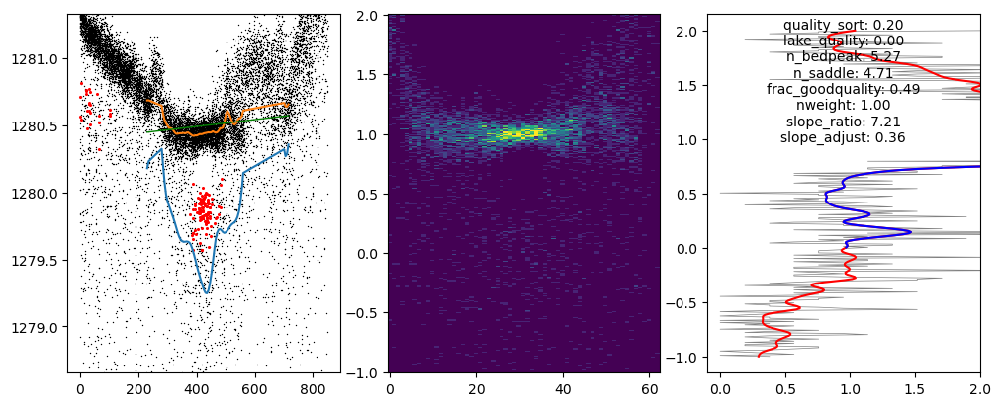

saved zzz_qual_test_sort/lake_099980_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0003.jpg
0.19852666533833896

_________________________115___________________________________

(0.043042193535256956, 0.06023697523148905)


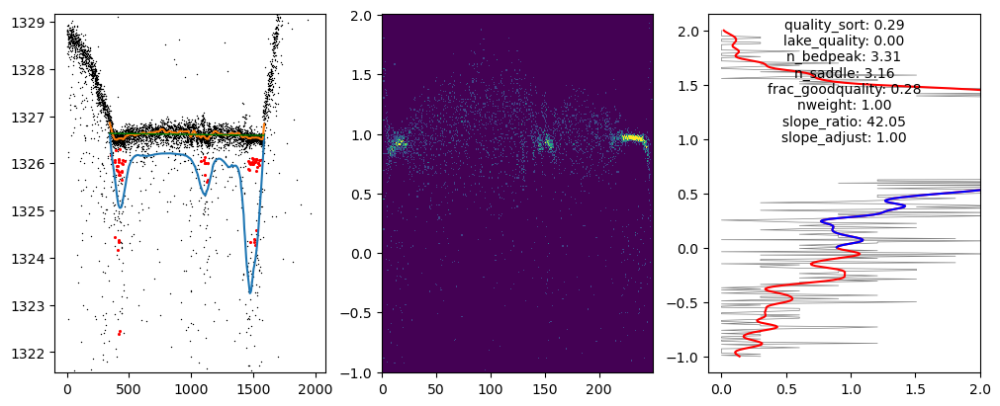

saved zzz_qual_test_sort/lake_099971_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0011.jpg
0.2896147078116686

_________________________116___________________________________



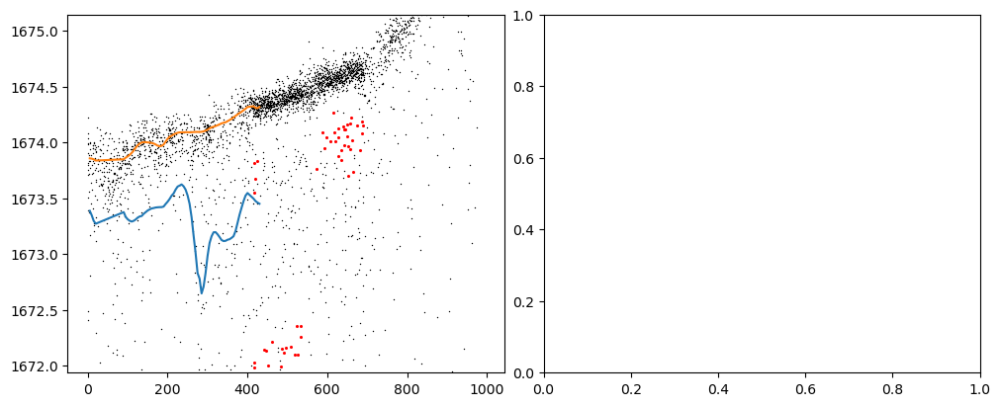

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0014.jpg
0.0

_________________________117___________________________________

(0.006804110463917823, 0.08668360260857681)


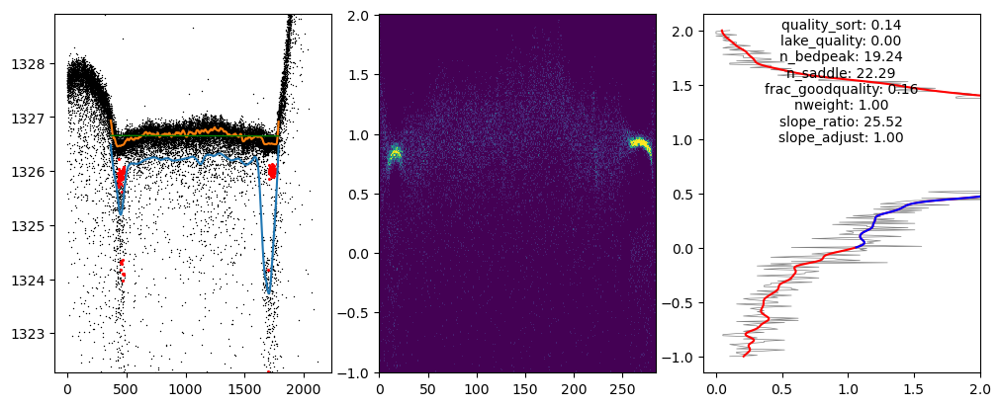

saved zzz_qual_test_sort/lake_099986_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0005.jpg
0.1362546978107091

_________________________118___________________________________

(0.06514330691743453, 0.09143304313180056)


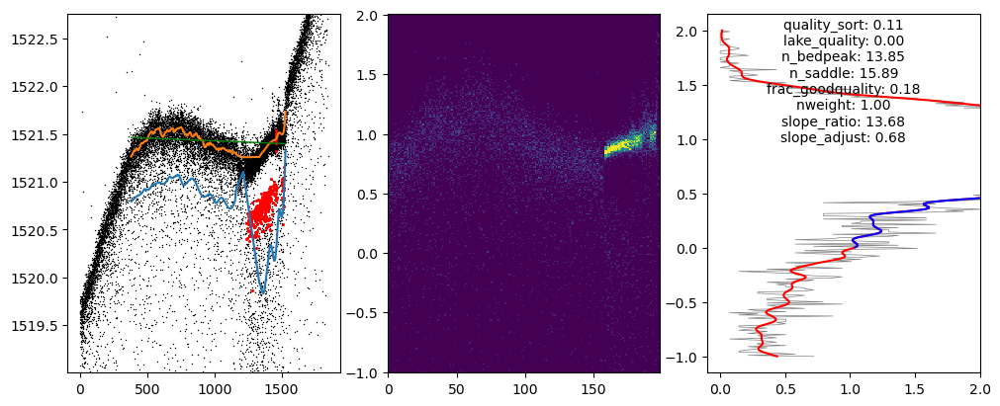

saved zzz_qual_test_sort/lake_099989_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0018.jpg
0.10789081092528607

_________________________119___________________________________

(0.06881743300617849, 0.040963940212514954)


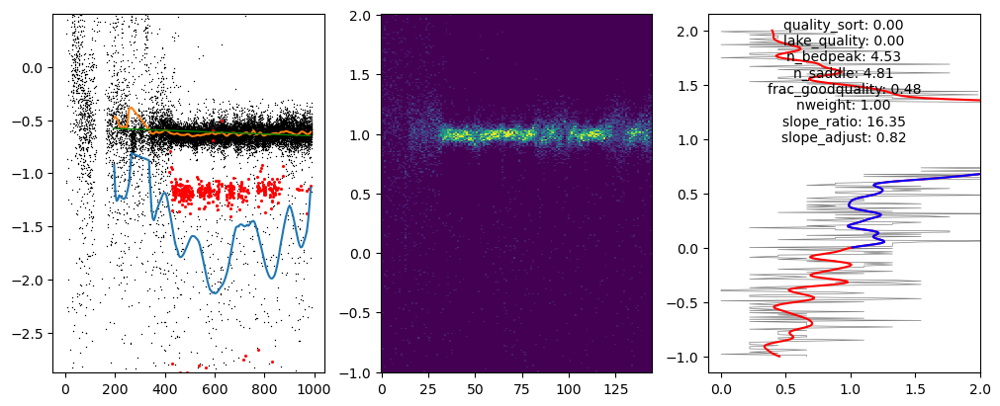

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt3l_0014.jpg
0.0

_________________________120___________________________________

(0.230629579811648, 0.0867606523389034)


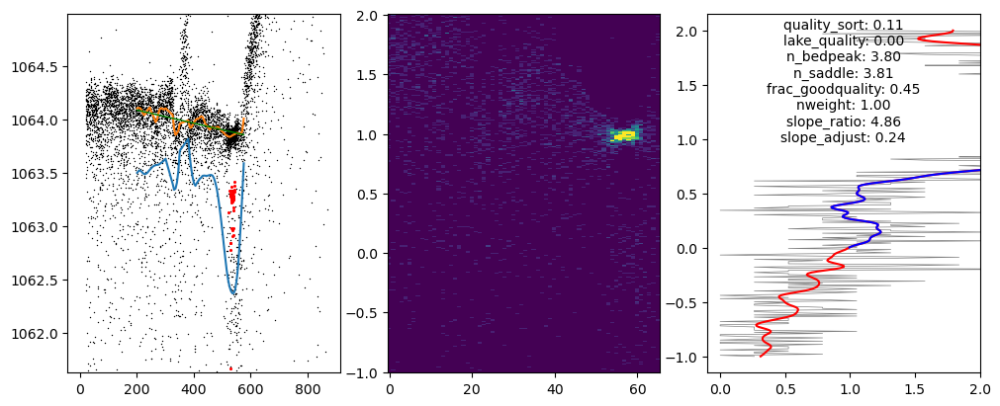

saved zzz_qual_test_sort/lake_099989_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt3l_0015.jpg
0.1100841007931544

_________________________121___________________________________

(0.07489576702744216, 0.07365775827467429)


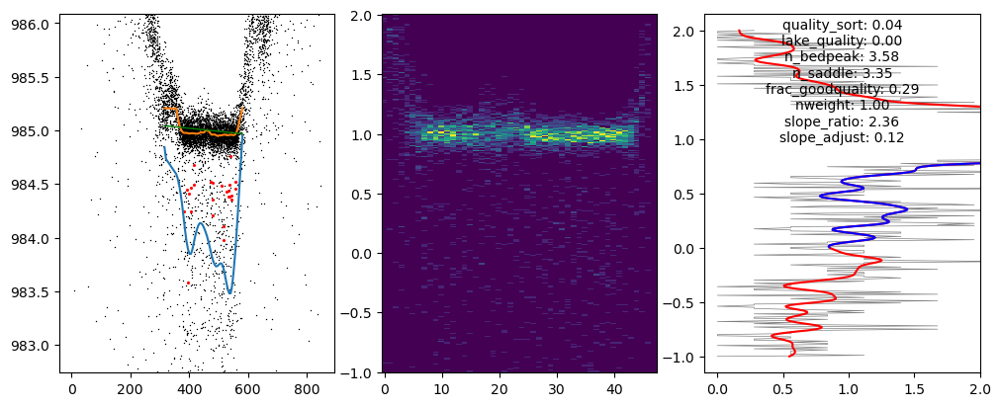

saved zzz_qual_test_sort/lake_099996_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1l_0002.jpg
0.03671305507208809

_________________________122___________________________________

(0.048082896918616225, 0.026742824012314207)


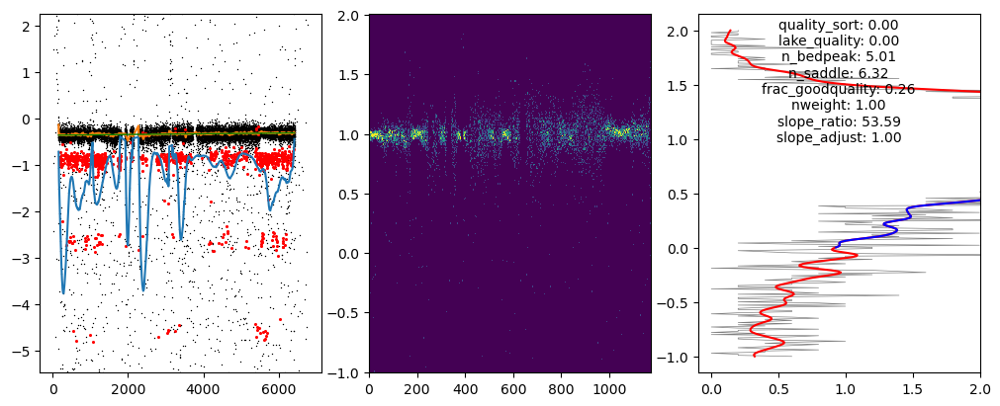

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt1r_0005.jpg
0.0

_________________________123___________________________________

(0.02901694295519519, 0.10334547280614882)


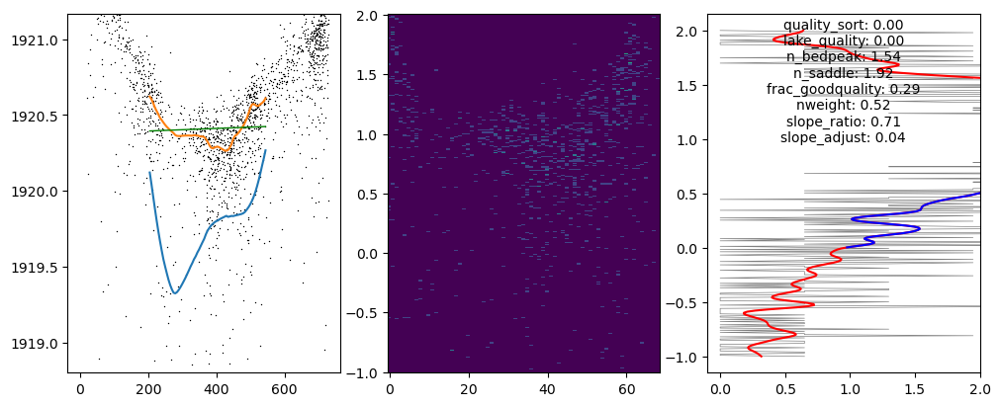

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1l_0000.jpg
0.0043035471001534615

_________________________124___________________________________



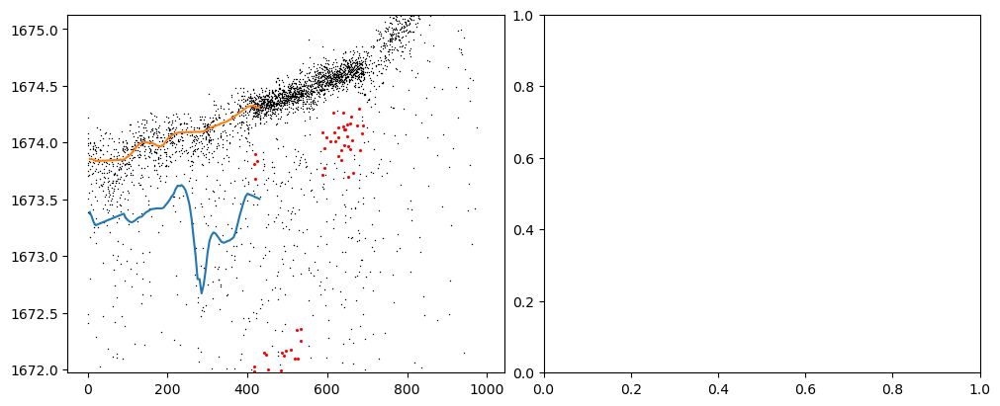

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0014.jpg
0.0

_________________________125___________________________________

(0.13816679014507827, 0.06693407593845083)


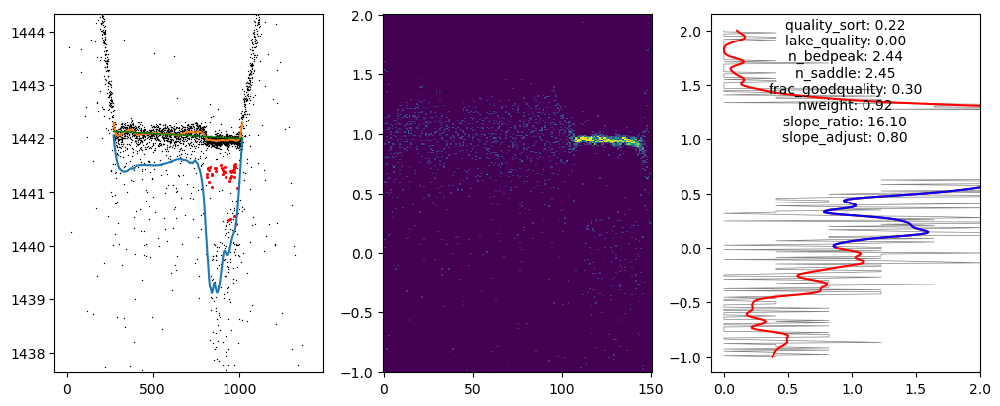

saved zzz_qual_test_sort/lake_099978_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2r_0022.jpg
0.22352554721675089

_________________________126___________________________________

(0.04908768161931221, 0.10091472668565327)


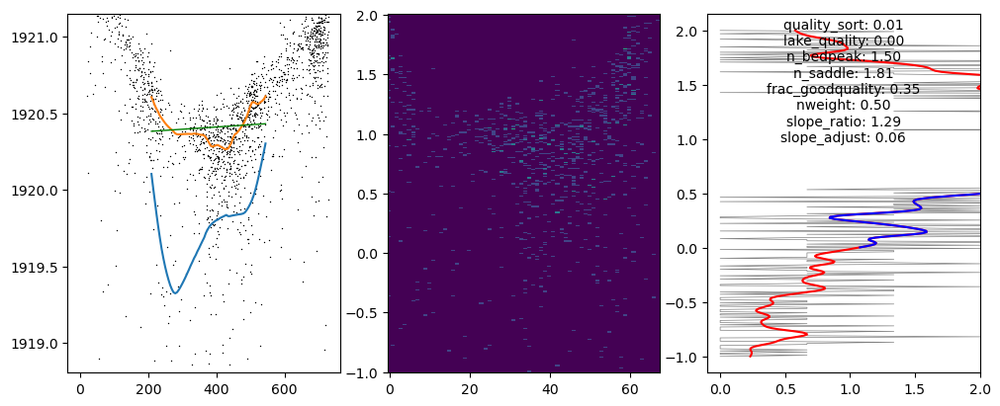

saved zzz_qual_test_sort/lake_099999_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt1l_0000.jpg
0.00935812948896636

_________________________127___________________________________

(0.0028729383958534527, 0.04870676024263909)


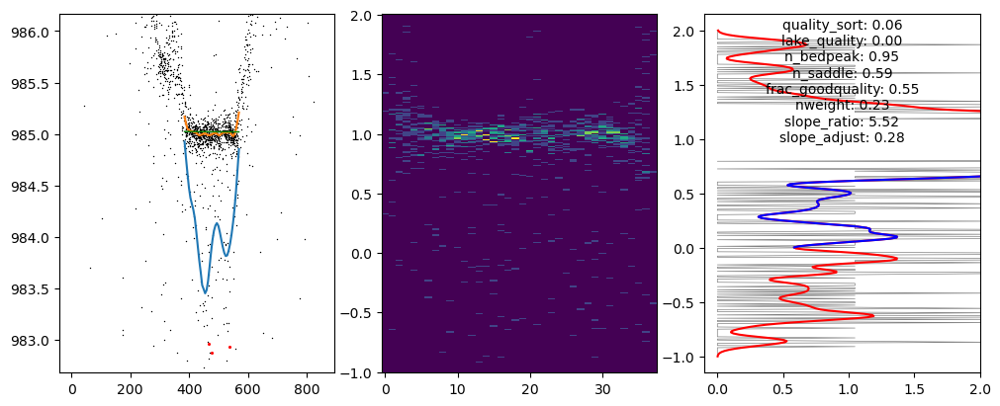

saved zzz_qual_test_sort/lake_099994_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0009.jpg
0.056441995457652105

_________________________128___________________________________

(0.002781533623647192, 0.048712312580620254)


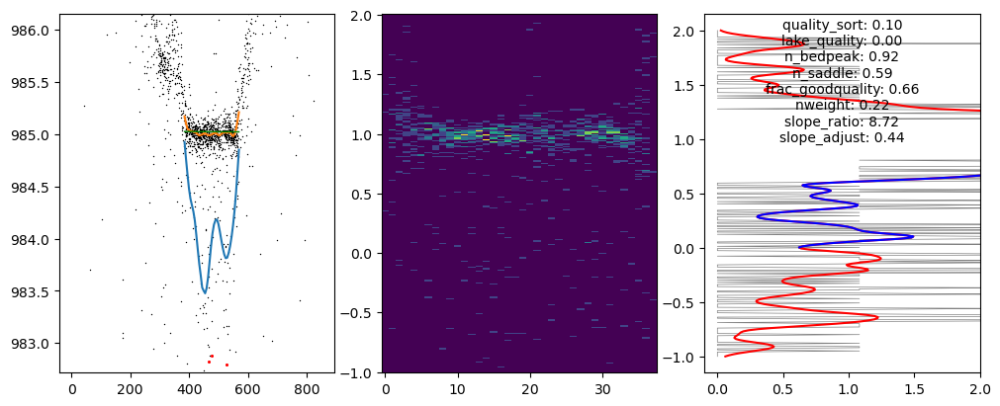

saved zzz_qual_test_sort/lake_099990_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0009.jpg
0.09707077431041243

_________________________129___________________________________

(0.06245136924326289, 0.0653954841330505)


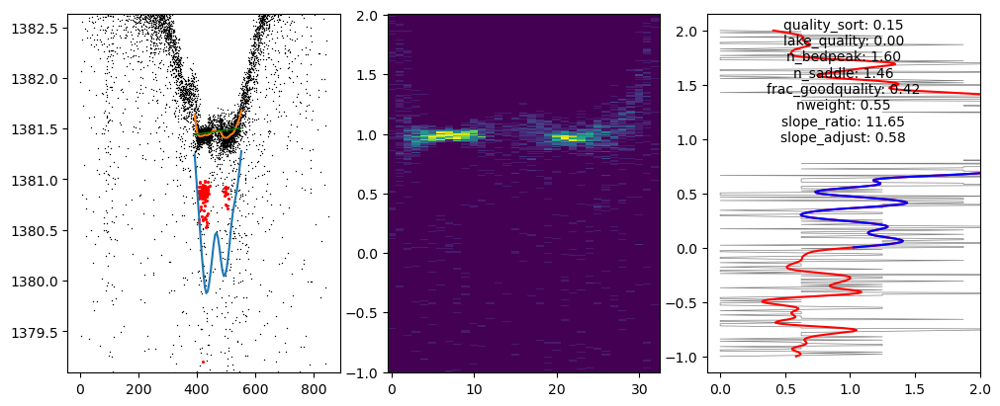

saved zzz_qual_test_sort/lake_099985_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0016.jpg
0.14994425522144741

_________________________130___________________________________

(0.06264787024474572, 0.06524152949530918)


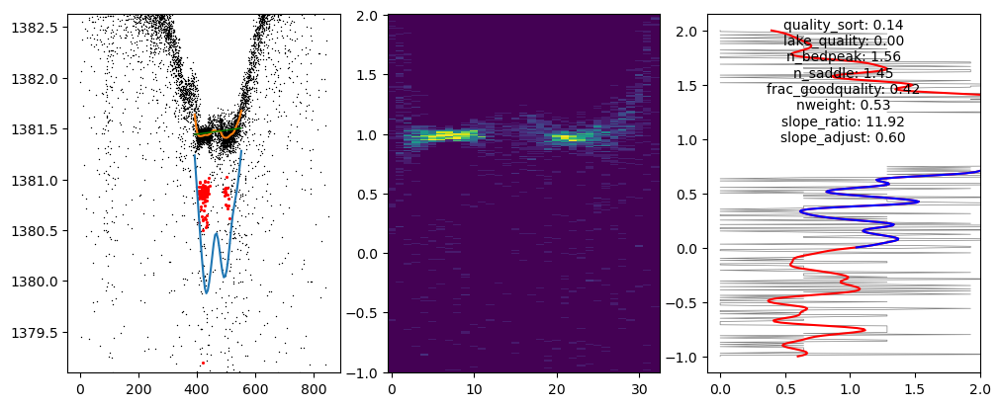

saved zzz_qual_test_sort/lake_099986_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt2l_0016.jpg
0.14315758829439396

_________________________131___________________________________

(0.027334529020008158, 0.035595962782348396)


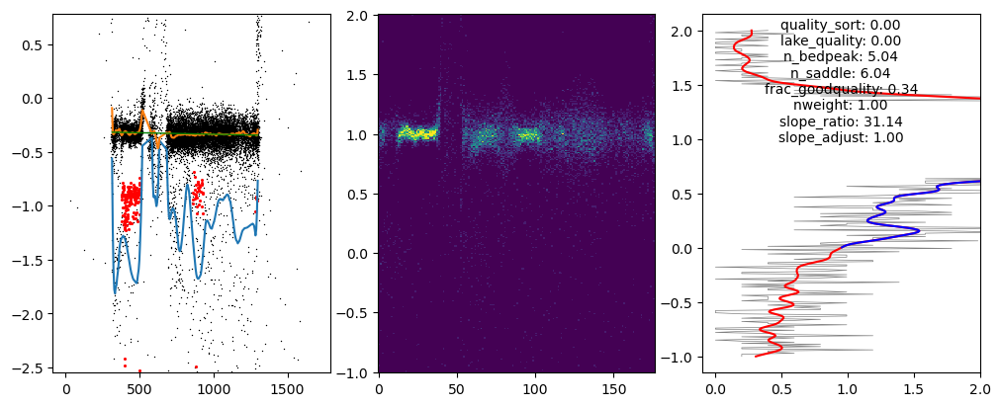

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt1l_0003.jpg
0.0

_________________________132___________________________________

(0.0427532698986397, 0.06021745644984957)


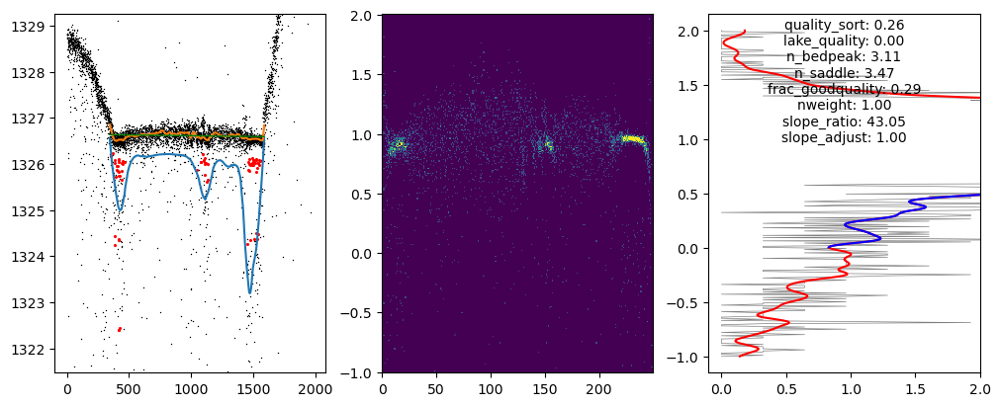

saved zzz_qual_test_sort/lake_099974_GrIS_2023_simplified_GRE_2000_CW_ATL03_20230806063138_07192003_006_02_gt1r_0011.jpg
0.25835215608818696

_________________________133___________________________________



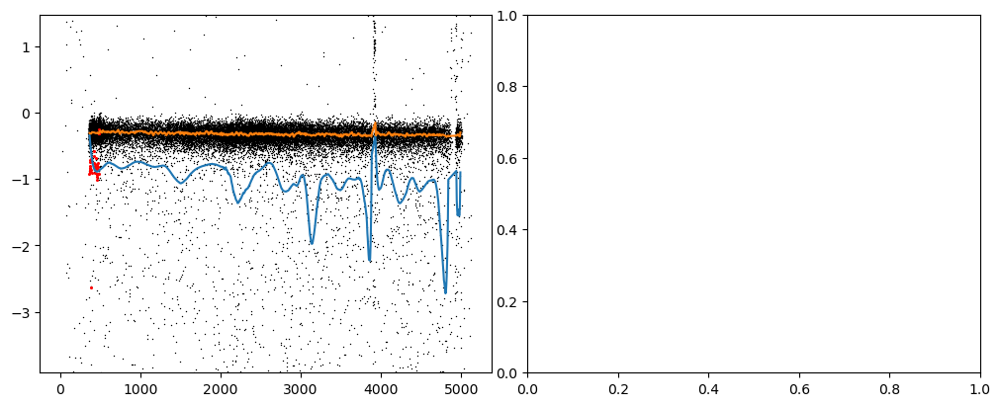

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_NE_ATL03_20230806174214_07262005_006_02_gt1l_0000.jpg
0.0

_________________________134___________________________________



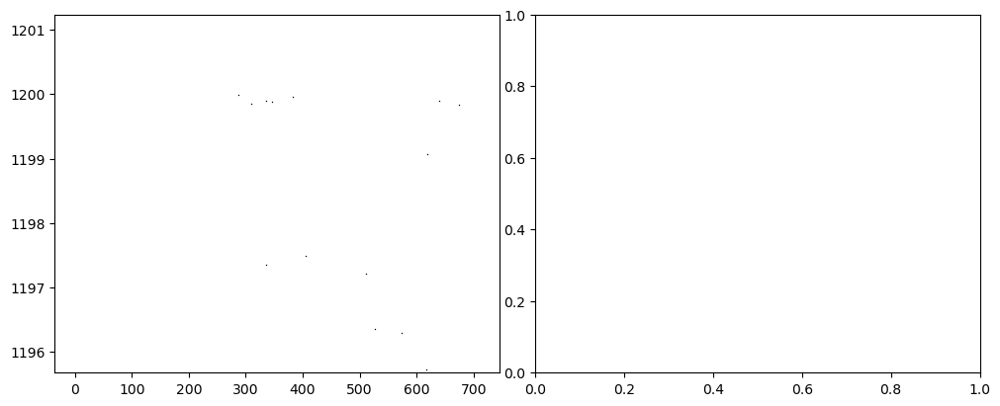

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_CE_ATL03_20230806045720_07182003_006_02_gt3r_0001.jpg
0.0

_________________________135___________________________________



/var/folders/8_/l1xn6w9502gfjh2zxy01thdc0000gr/T/ipykernel_88962/3978074497.py:126: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([surf_elev-2*maxd, surf_elev+maxd])


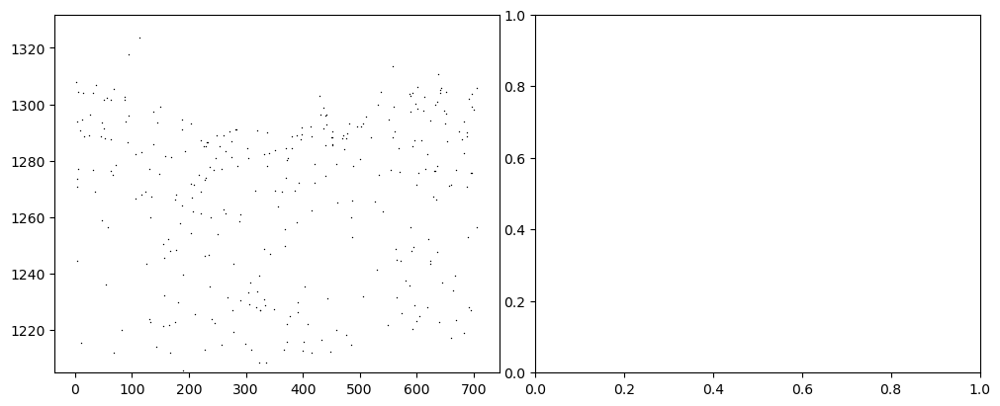

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0013.jpg
0.0

_________________________136___________________________________



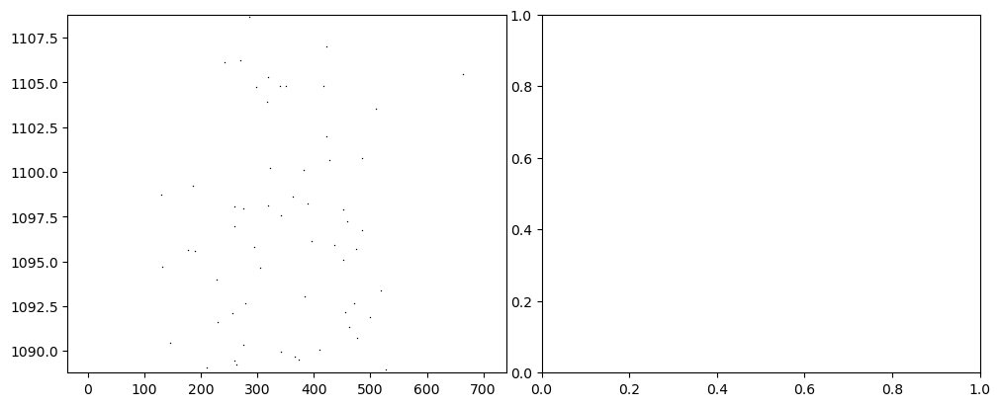

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0014.jpg
0.0

_________________________137___________________________________



/var/folders/8_/l1xn6w9502gfjh2zxy01thdc0000gr/T/ipykernel_88962/3978074497.py:126: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([surf_elev-2*maxd, surf_elev+maxd])


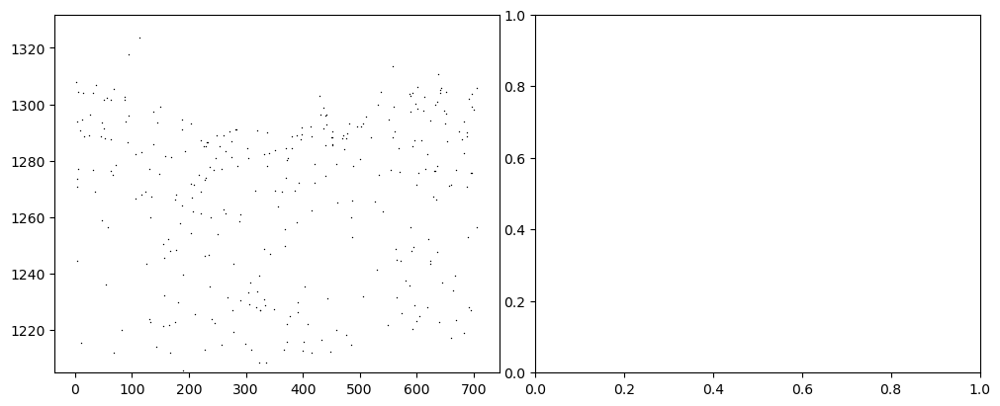

saved zzz_qual_test_sort/lake_100000_GrIS_2023_simplified_GRE_2000_SW_ATL03_20230806063138_07192003_006_02_gt3r_0015.jpg
0.0


In [54]:
plt.close('all')
fns, quals = [],[]
plotit = True
for i,fn in enumerate(filelist):
    try:
        print('\n_________________________%i___________________________________\n' % i)
        print('reading file %5i / %5i' % (i+1, len(filelist)), end='\r')
        lakedict = read_lake_file(fn)
        fns.append(fn)
    
        dfd = lakedict['depth_data']
        dfp = lakedict['photon_data']
        surf_elev = lakedict['surface_elevation']
        maxd = lakedict['max_depth']
        dfp['is_afterpulse'] = dfp.prob_afterpulse>np.random.uniform(0,1,len(dfp))
        df_nnz = dfp[~dfp.is_afterpulse]
    
        final_resolution = 5
        conf_thresh = 0.1
        df_bed = dfd[(dfd.h_fit_bed < surf_elev) & (dfd.h_fit_bed < dfd.h_fit_surf) 
                    & (dfd.h_fit_surf < (surf_elev+0.25)) & (dfd.h_fit_surf > (surf_elev-0.25)) & (dfd.depth != 0)]
        select_qual = df_bed.conf >= conf_thresh
        frac_goodquality = np.mean(select_qual)
        if (frac_goodquality > 0.1) & (np.sum(select_qual)>10):
            # df_bed = df_bed[select_qual]
            nbins = 300
            counts = np.zeros((len(df_bed), nbins))
            for i in range(len(df_bed)):
                vals = df_bed.iloc[i]
                in_xatc = (df_nnz.xatc > (vals.xatc-final_resolution/2)) & (df_nnz.xatc < (vals.xatc+final_resolution/2))
                thisdf = df_nnz[in_xatc]
                hrng = vals.h_fit_surf - vals.h_fit_bed
                bins = np.linspace(vals.h_fit_bed-hrng, vals.h_fit_surf+hrng, nbins+1)
                hrng = surf_elev - vals.h_fit_bed
                bins = np.linspace(vals.h_fit_bed-hrng, surf_elev+hrng, nbins+1)
                hist = np.histogram(thisdf.h, bins=bins)[0]
                counts[i,:] = hist
        
            scaled_hist = np.sum(counts, axis=0)
            scaled_smooth = pd.Series(scaled_hist).rolling(window=int(nbins/3), win_type='gaussian', min_periods=1, center=True).mean(std=nbins/100)
            df_dens_all = pd.DataFrame({'x': np.linspace(-1,2,nbins), 'n': scaled_smooth})
            # n_bedpeak = np.interp(0.0, df_dens_all.x, df_dens_all.n)
            n_bedpeak = np.nanmean(df_dens_all.n[np.abs(df_dens_all.x) < 0.1])
            
            nweight_width = 3
            nweight = (np.sin((np.clip(n_bedpeak / nweight_width, 0, 1) - 0.5) * np.pi) + 1) / 2
            
            df_dens_int = df_dens_all[(df_dens_all.x > 0) & (df_dens_all.x < 1)].copy()
            n_saddle = np.mean(df_dens_int.n[df_dens_int.n < np.percentile(df_dens_int.n, 33)])
            if n_saddle == 0:
                n_saddle += 1e-10
            depth_quality = np.clip(n_bedpeak / n_saddle - 2, 0, None)
            
            coef = np.polyfit(df_bed.xatc, df_bed.h_fit_surf, 1)
            poly1d_f = np.poly1d(coef)
            xminmax = [df_bed.xatc.min(), df_bed.xatc.max()]
            hminmax = poly1d_f(xminmax)
            hminmax1 = np.abs(np.diff(hminmax)[0])
            hminmax2 = np.std(df_bed.h_fit_surf)
            print((hminmax1, hminmax2))
            maxd5 = np.max(dfd.depth[dfd.conf >= 0.3])
            hrange = np.max((hminmax1, hminmax2))
            slope_ratio = maxd5 / hrange
            min_slope_ratio = 20
            slope_adjust = np.clip(slope_ratio / min_slope_ratio, 0, 1)
            
            depth_quality_sort = np.clip(n_bedpeak / n_saddle, 0, None) * frac_goodquality * nweight * slope_adjust
            if surf_elev < 2.0:
                depth_quality_sort = 0.0
            if np.isnan(depth_quality_sort):
                depth_quality_sort = 0.0
    
            if plotit:
                fig, axs = plt.subplots(ncols=3, figsize=[10,4])
                ax = axs[0]
                ax.scatter(dfp.xatc, dfp.h, s=1, color='k', linewidth=0)
                ax.scatter(dfp.xatc[dfp.is_afterpulse], dfp.h[dfp.is_afterpulse], s=5, color='r', linewidth=0)
                ax.plot(df_bed.xatc, df_bed.h_fit_bed)
                ax.plot(df_bed.xatc, df_bed.h_fit_surf)
                ax.plot(xminmax, hminmax, 'g-', lw=1)
                try:
                    ax.set_ylim([surf_elev-2*maxd, surf_elev+maxd])
                except:
                    ax.set_ylim([surf_elev-15, surf_elev+5])
                ax = axs[1]
                ax.pcolor(np.arange(len(df_bed)), df_dens_all.x, np.transpose(counts), vmin=0, vmax=np.max((5,np.percentile(counts, 99.9))))
                ax = axs[2]
                ax.plot(scaled_hist/n_bedpeak, df_dens_all.x, color='gray', lw=0.5)
                ax.plot(df_dens_all.n/n_bedpeak, df_dens_all.x, color='red')
                ax.plot(df_dens_int.n/n_bedpeak, df_dens_int.x, color='blue')
                ax.set_xlim([-0.1, 2.0])
                txt = 'quality_sort: %.2f\n' % depth_quality_sort
                txt += 'lake_quality: %.2f\n' % lakedict['lake_quality']
                txt += 'n_bedpeak: %.2f\n' % n_bedpeak
                txt += 'n_saddle: %.2f\n' % n_saddle
                txt += 'frac_goodquality: %.2f\n' % frac_goodquality
                txt += 'nweight: %.2f\n' % nweight
                txt += 'slope_ratio: %.2f\n' % slope_ratio
                txt += 'slope_adjust: %.2f\n' % slope_adjust
                ax.text(0.5, 0.99, txt, transform=ax.transAxes, ha='center', va='top')
                fig.tight_layout(pad=0.3)
                plt.close(fig)
                display(fig)
                figdir = 'zzz_qual_test_sort'
                if not os.path.isdir(figdir):
                    os.makedirs(figdir)
                filename_base = 'lake_%06i_%s_%s_%s' % (int(np.round(np.clip(1000-depth_quality_sort,0,None)*100)),
                                                     lakedict['ice_sheet'], lakedict['melt_season'], 
                                                     lakedict['lake_id'])
                figname_out = '%s/%s.jpg' % (figdir, filename_base)
                fig.savefig(figname_out, dpi=300)
                print('saved %s' % figname_out)
    
            quals.append(depth_quality_sort)
        else:
            depth_quality_sort = 0.0
            quals.append(depth_quality_sort)
            if plotit:
                fig, axs = plt.subplots(ncols=2, figsize=[10,4])
                ax = axs[0]
                ax.scatter(dfp.xatc, dfp.h, s=1, color='k', linewidth=0)
                ax.scatter(dfp.xatc[dfp.is_afterpulse], dfp.h[dfp.is_afterpulse], s=5, color='r', linewidth=0)
                ax.plot(df_bed.xatc, df_bed.h_fit_bed)
                ax.plot(df_bed.xatc, df_bed.h_fit_surf)
                try:
                    ax.set_ylim([surf_elev-2*maxd, surf_elev+maxd])
                except:
                    ax.set_ylim([surf_elev-15, surf_elev+5])
                fig.tight_layout(pad=0.3)
                display(fig)
                plt.close(fig)
                figdir = 'zzz_qual_test_sort'
                if not os.path.isdir(figdir):
                    os.makedirs(figdir)
                filename_base = 'lake_%06i_%s_%s_%s' % (int(np.round(np.clip(1000-depth_quality_sort,0,None)*100)),
                                                     lakedict['ice_sheet'], lakedict['melt_season'], 
                                                     lakedict['lake_id'])
                figname_out = '%s/%s.jpg' % (figdir, filename_base)
                fig.savefig(figname_out, dpi=300)
                print('saved %s' % figname_out)
        print(depth_quality_sort)
    except:
        traceback.print_exc()
  

138
25
57
39


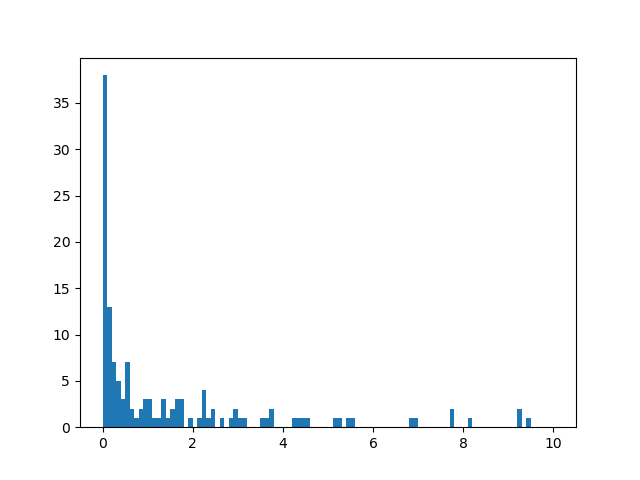

In [55]:
dfgood = pd.DataFrame({'qual': quals, 'fn': fns}).sort_values(by='qual', ascending=False)
fig, ax = plt.subplots()
ax.hist(dfgood.qual, bins=np.arange(0,10.05,0.1));
print(np.sum(dfgood.qual>=0))
print(np.sum(dfgood.qual==0))
print(np.sum(dfgood.qual>1))
print(np.sum(dfgood.qual>2))

In [ ]:
qualstart = 0.0
dfg = dfgood[dfgood.qual>qualstart].sort_values(by='qual', ascending=False)
print(np.sum(dfgood.qual>qualstart))
start = 0
n = 60
for i in np.arange(start,start+n):
    dat = dfg.iloc[i]
    lakedict = read_lake_file(dat.fn)
    print(dat.qual)
    dfd = lakedict['depth_data']
    dfp = lakedict['photon_data']
    surf_elev = lakedict['surface_elevation']
    maxd = lakedict['max_depth']
    dfp['is_afterpulse'] = dfp.prob_afterpulse>np.random.uniform(0,1,len(dfp))
    df_nnz = dfp[~dfp.is_afterpulse]
    df_bed = dfd[(dfd.h_fit_bed < surf_elev) & (dfd.h_fit_bed < dfd.h_fit_surf) 
                    & (dfd.h_fit_surf < (surf_elev+0.25))]
    fig, axs = plt.subplots(ncols=1, figsize=[6,2])
    ax = axs
    ax.scatter(df_nnz.xatc, df_nnz.h, s=1, color='k', linewidth=0)
    # ax.scatter(dfp.xatc[dfp.is_afterpulse], dfp.h[dfp.is_afterpulse], s=5, color='r', linewidth=0)
    bed = df_bed.h_fit_bed.copy()
    bed[df_bed.conf<0.1] = np.nan
    ax.plot(df_bed.xatc, bed)
    ax.plot(df_bed.xatc, df_bed.h_fit_surf)
    ax.set_ylim([surf_elev-2*maxd, surf_elev+maxd])
    fig.tight_layout(pad=0.3)
    display(fig)
    plt.close(fig)

In [ ]:
# dfbad = pd.DataFrame({'qual': quals, 'fn': fns}).sort_values(by='qual', ascending=False)
fig, ax = plt.subplots()
ax.hist(dfbad.qual, bins=100);
print(np.sum(dfbad.qual==0))

In [ ]:
for i in range(30):
    dat = dfbad.iloc[i]
    lakedict = read_lake_file(dat.fn)
    print(dat.qual)
    dfd = lakedict['depth_data']
    dfp = lakedict['photon_data']
    surf_elev = lakedict['surface_elevation']
    maxd = lakedict['max_depth']
    dfp['is_afterpulse'] = dfp.prob_afterpulse>np.random.uniform(0,1,len(dfp))
    df_nnz = dfp[~dfp.is_afterpulse]
    df_bed = dfd[(dfd.h_fit_bed < surf_elev) & (dfd.h_fit_bed < dfd.h_fit_surf) 
                    & (dfd.h_fit_surf < (surf_elev+0.25))]
    fig, axs = plt.subplots(ncols=1, figsize=[6,2])
    ax = axs
    ax.scatter(dfp.xatc, dfp.h, s=1, color='k', linewidth=0)
    ax.scatter(dfp.xatc[dfp.is_afterpulse], dfp.h[dfp.is_afterpulse], s=5, color='r', linewidth=0)
    ax.plot(df_bed.xatc, df_bed.h_fit_bed)
    ax.plot(df_bed.xatc, df_bed.h_fit_surf)
    ax.set_ylim([surf_elev-2*maxd, surf_elev+maxd])
    fig.tight_layout(pad=0.3)
    display(fig)
    plt.close(fig)

In [ ]:
num_missing_data = 0

for i,fn in enumerate(filelist):
    print('reading file %5i / %5i' % (i+1, len(filelist)), end='\r')

    try:
        with h5py.File(fn, 'r+') as f:
            ice_sheet = f['properties']['ice_sheet'][()].decode('utf-8')
            melt_season = f['properties']['melt_season'][()].decode('utf-8')
            polygon_name = f['properties']['polygon_name'][()].decode('utf-8')
            max_depth = f['properties']['max_depth'][()]
            length_water_surfaces = f['properties']['length_water_surfaces'][()]
            surface_elevation = f['properties']['surface_elevation'][()]
            n_photons_where_water = f['properties']['n_photons_where_water'][()]
            lon = f['properties']['lon'][()]
            lat = f['properties']['lat'][()]
            lon_min = f['properties']['lon_min'][()]
            lon_max = f['properties']['lon_max'][()]
            lat_min = f['properties']['lat_min'][()]
            lat_max = f['properties']['lat_max'][()]
            cycle_number = f['properties']['cycle_number'][()]
            rgt = f['properties']['rgt'][()]
            gtx = f['properties']['gtx'][()].decode('utf-8')
            beam_strength = f['properties']['beam_strength'][()].decode('utf-8')
            beam_number = f['properties']['beam_number'][()]
            granule_id = f['properties']['granule_id'][()].decode('utf-8')
            lake_id = f['properties']['lake_id'][()].decode('utf-8')

            # this is a fix. previously times were not UTC
            date_time = convert_time_to_string(np.median(f['mframe_data']['dt'][()]))
            if 'time_utc' in f['properties'].keys():
                del f['properties/time_utc']
            dset = f.create_dataset('properties/time_utc', data=date_time)

            lake_quality = f['properties']['lake_quality'][()]
            detection_quality = f['properties']['detection_quality'][()]
            if 'quality_summary' not in f['properties'].keys():
                dset = f.create_dataset('properties/quality_summary', data=get_quality_summary(detection_quality, lake_quality))
            quality_summary = f['properties']['quality_summary'][()]
            
            #############################################
            # if 'test_filchner' in polygon_name:
            #     polygon_name = 'geojsons/simplified_ANT_1000_West_J-Jpp.geojson'
            #     del f['properties/polygon_name']
            #     dset = f.create_dataset('properties/polygon_name', data=polygon_name)

            # if 'test_ross' in polygon_name:
            #     polygon_name = 'geojsons/simplified_ANT_1000_East_E-Ep.geojson'
            #     del f['properties/polygon_name']
            #     dset = f.create_dataset('properties/polygon_name', data=polygon_name)

            # if ('_E-Ep' in polygon_name) or ('_Ep-F' in polygon_name):
            #     pt = gpd.GeoDataFrame(geometry=[Point(lon, lat)], crs='EPSG:4326').to_crs(gdf.crs).loc[0].geometry
            #     if pt.within(ep_f):
            #         polygon_name = 'geojsons/simplified_ANT_1000_West_Ep-F.geojson'
            #         print(polygon_name)
            #     else:
            #         polygon_name = 'geojsons/simplified_ANT_1000_East_E-Ep.geojson'
            #     del f['properties/polygon_name']
            #     dset = f.create_dataset('properties/polygon_name', data=polygon_name)
            #############################################
        
        basin = polygon_name.replace('simplified_', '')
        file_name = fn
    
        datadict = {
            'ice_sheet': ice_sheet,
            'melt_season': melt_season,
            'basin': basin,
            'quality_summary': quality_summary,
            'max_depth': max_depth,
            'length_water_surfaces': length_water_surfaces,
            'surface_elevation': surface_elevation,
            'n_photons_where_water': n_photons_where_water,
            'lon': lon,
            'lat': lat,
            'date_time': date_time,
            'lon_min': lon_min,
            'lon_max': lon_max,
            'lat_min': lat_min,
            'lat_max': lat_max,
            'cycle_number': cycle_number,
            'rgt': rgt,
            'gtx': gtx,
            'beam_strength': beam_strength,
            'beam_number': beam_number,
            'detection_quality': detection_quality,
            'lake_quality': lake_quality,
            'granule_id': granule_id,
            'lake_id': lake_id,
            'file_name': file_name
        }
    
        if i == 0: 
            df = pd.DataFrame(datadict, index=[0])
        else:
            df.loc[i] = datadict.values()

    except:
        num_missing_data += 1
        traceback.print_exc()

print('\nNumber of lakes with missing data: %i' % num_missing_data)

df['main_region'] = df.apply(lambda x: 'AIS_'+x.basin.split('_')[2] if x.ice_sheet == 'AIS' else None, axis=1)
df['basin_name'] = df.apply(lambda x: x.basin.split('_')[-1], axis=1)

df

In [ ]:
# df.loc[df.basin=='test_ross','basin'] = 'geojsons/simplified_ANT_1000_East_E-Ep.geojson'
# df.loc[df.basin=='test_ross','lake_id'] = df.loc[df.basin=='test_ross','lake_id'].replace('test_ross','simplified_ANT_1000_East_E-Ep')
# df['main_region'] = df.apply(lambda x: 'AIS_'+x.basin.split('_')[2] if x.ice_sheet == 'AIS' else None, axis=1)
# df['basin_name'] = df.apply(lambda x: x.basin.split('_')[-1], axis=1)

# df

# Save the lake info to a csv file

In [ ]:
# out_file_csv = 'zzz_lakestats_methods_baddata.csv'

# out_path_csv = out_file_csv
# df.to_csv(out_path_csv, index=False)
# print(out_path_csv)

In [ ]:
out_file_csv = 'data/lakestats_methods_paper.csv'

out_path_csv = out_file_csv
df.to_csv(out_path_csv, index=False)
print(out_path_csv)
# '/Volumes/nox/Philipp/IceLakesRun1/GlacierLakeDetectionICESat2/GLD1_all_lakes.csv'
# '/Volumes/nox/Philipp/IceLakesRun2/GlacierLakeDetectionICESat2/GLD2_all_returned_lakes.csv'
# '/Volumes/nox/Philipp/IceLakesRun2/GlacierLakeDetectionICESat2/GLD2_lakestats_for-wais.csv'
# /Volumes/nox/Philipp/IceLakesRun2/GlacierLakeDetectionICESat2/GLD2_lakestats_for-wais_ross-fixed.csv
# /Volumes/nox/Philipp/IceLakesRun2/GlacierLakeDetectionICESat2/GLD2_lakestats_for-wais_ross-fixed_all.csv

In [ ]:
quality_sort = 0.1
'lake_%06i' % int(np.round(np.clip(1000-quality_sort,0,None)*100))

In [ ]:
from IPython.display import Image, display
badfilesfn = 'zzz_lakestats_methods_baddata.csv'
df = pd.read_csv(badfilesfn)
print(len(df))
df = df[df.lake_quality>0]
print(len(df))
for fn in df.file_name:
    display(Image(fn.replace('.h5', '_imagery.jpg')))

# Check that it worked 

In [ ]:
df = pd.read_csv(out_path_csv)
# df['basin'] = df.apply(lambda x: x.basin.replace('geojsons/', '').replace('.geojson',''), axis=1)
np.unique(df.basin)

In [ ]:
csv_file_name = 'data/lakestats_methods_paper.csv'
df = pd.read_csv(csv_file_name)
len(df)

# Subset for good lakes only for WAIS Conference

In [ ]:
to_remove = [
    'lake_09999770_AIS_2020-21_simplified_ANT_1000_West_Ep-F_ATL03_20210319070241_13021012_006_01_gt1l_0000.h5',
    'lake_09999783_AIS_2019-20_simplified_ANT_1000_East_K-A_ATL03_20191104231510_05960512_006_01_gt3l_0018.h5',
    'lake_09999834_AIS_2019-20_simplified_ANT_1000_Peninsula_I-Ipp_ATL03_20200222201311_08870612_006_01_gt2r_0000.h5',
    'lake_09994291_AIS_2020-21_simplified_ANT_1000_West_F-G_ATL03_20201125223347_09580910_006_01_gt2l_0000.h5',
    'lake_09999865_AIS_2021-22_simplified_ANT_1000_West_H-Hp_ATL03_20211229140312_01111412_006_01_gt2l_0000.h5',
]

wais_list = 'lakelistgood_temp20230922.csv'
df_sel = pd.read_csv(wais_list,header=None,names=['filename'])
df_sel.iloc[0].filename
df_sel['qual_int'] = df_sel.apply(lambda x: int(x.filename.split('_')[1]), axis=1)
df_sel['is_data'] = df_sel.apply(lambda x: '.h5' in x.filename, axis=1)
df_sel = df_sel[df_sel.is_data & (df_sel.qual_int != 10000000)].reset_index(drop=True)
df['fn_only'] = df.apply(lambda x: x.file_name.split('/')[-1], axis=1)
filelist_good = list(df_sel.filename)
df['is_good_wais'] = df.apply(lambda x: (x.fn_only in filelist_good) and (x.fn_only not in to_remove), axis=1)
df_forwais = df[df.is_good_wais]
df_forwais['basin']= df_forwais.apply(lambda x: x.basin.replace('geojsons/', '').replace('.geojson', ''), axis=1)
df_forwais['basin_name']= df_forwais.apply(lambda x: x.basin.replace('geojsons/', '').replace('.geojson', ''), axis=1)
df_forwais

waislist_out = '/Volumes/nox/Philipp/IceLakesRun2/GlacierLakeDetectionICESat2/GLD2_lakestats_for-wais_ross-fix_gooddata.csv'
df_forwais.to_csv(waislist_out, index=False)

In [ ]:
df = pd.read_csv('/Volumes/nox/Philipp/IceLakesRun2/GlacierLakeDetectionICESat2/GLD2_lakestats_for-wais_ross-fix_gooddata.csv')
df_ant = df[df.ice_sheet=='AIS']
df.groupby('basin_name')['lake_id'].count()

# now get granule stats from the actual selected data

In [ ]:
total_xatc = df_granule_stats.xatc_total.sum()
lakes_xatc = df.length_water_surfaces.sum()
total_photons = df_granule_stats.nphot_total.sum()
lakes_photons = df.n_photons_where_water.sum()
print('Total along-track distance analyzed:  %.1f million km (%.1f million miles)' % (total_xatc/1e9, total_xatc/1e9*0.621371))
print('Total along-track distance of lakes:  %.1f thousand km (%.1f thousand miles)' % (lakes_xatc/1e6, lakes_xatc/1e6*0.621371))
print('')
print('Total number of photons analyzed:     %i billion' % (total_photons/1e9))
print('Total number of lake photons:         %i million' % (lakes_photons/1e6))
print('')
print('Along-track distance lake percentage: %.3f %%' % (lakes_xatc/total_xatc*100))
print('Photon count percentage:              %.3f %%' % (lakes_photons/total_photons*100))

### This shows that lake segements have a lower photon density than non-lake ones. 
This at first seems counterintuitive, but lakes are harder to detect when there is more background noise...

# Now get the stats for all regions

In [ ]:
df['main_region'] = df.apply(lambda x: 'AIS_'+x.basin.split('_')[2] if x.ice_sheet == 'AIS' else None, axis=1)
df['basin_name'] = df.apply(lambda x: x.basin.split('_')[-1], axis=1)
df_granule_stats['ice_sheet'] = df_granule_stats.apply(lambda x: 'AIS' if x.region[:3] == 'ANT' else 'GrIS', axis=1)
df_granule_stats['main_region'] = df_granule_stats.apply(lambda x: 'AIS_'+x.region.split('_')[2] if x.ice_sheet == 'AIS' else None, axis=1)
df_granule_stats['basin_name'] = df_granule_stats.apply(lambda x: x.region.split('_')[3][:-8] if x.ice_sheet == 'AIS' else x.region.split('_')[2][:-8], axis=1)

def get_counts_by_region(df_g, df_l, group='ice_sheet'):
    if group=='all':
        granule_stats = pd.DataFrame(df_g[['xatc_total', 'nphot_total']].sum().to_dict(), index=['Total'])
        lake_stats = pd.DataFrame(df_l[['length_water_surfaces', 'n_photons_where_water']].sum().to_dict(), index=['Total'])
    else:
        granule_stats = df_g.groupby(by=group)[['xatc_total', 'nphot_total']].sum()
        lake_stats = df_l.groupby(by=group)[['length_water_surfaces', 'n_photons_where_water']].sum()
    stats_merge = pd.concat((granule_stats, lake_stats), axis=1)
    stats_merge['percentage_xatc'] = stats_merge.length_water_surfaces/stats_merge.xatc_total*100
    stats_merge['percentage_photons'] = stats_merge.n_photons_where_water/stats_merge.nphot_total*100
    return stats_merge

dfs_stat = []
for grp in ['all', 'ice_sheet', 'main_region', 'basin_name']:
    dfs_stat.append(get_counts_by_region(df_granule_stats, df, group=grp))
df_stats = pd.concat(dfs_stat)
df_stats.to_csv('/Volumes/nox/Philipp/IceLakesRun2/GlacierLakeDetectionICESat2/GLD2_granulestats_for-wais_ross-fix_gooddata.csv')
df_stats

# Code below for random plotting to check things...

In [ ]:
dfsort = df.sort_values(by='quality_summary', ascending=False)
df_ant = dfsort[dfsort.ice_sheet=='AIS'].reset_index(drop=True)
df_gre = dfsort[dfsort.ice_sheet=='GrIS'].reset_index(drop=True)
# df_ant['papergranule'] = df_ant.apply(lambda x: 'ATL03_20190102184312_00810210_' in x.granule_id ,axis=1)
# df_ant = df_ant[df_ant.papergranule & (df_ant.gtx=='gt2l')].reset_index(drop=True)

In [ ]:
for i in range(10):
    fn = df_ant.loc[i].file_name
    fig, ax = plt.subplots(figsize=[8,5])
    with h5py.File(fn, 'r') as f:
        xatc = f['photon_data']['xatc'][()]
        h = f['photon_data']['h'][()]
    ax.scatter(xatc, h, s=1, c='k')

In [ ]:
df_lakes = df[((df.quality_summary > 0) 
               & (df.surface_elevation > 1.0) 
               & (df.max_depth < 50) 
               & (df.max_depth > 0.5))].copy()
# df_lakes = df[df.quality_summary > 0]
df_lakes.sort_values(by='quality_summary', ascending=False, inplace=True)
len(df_lakes)

In [ ]:
sz_sup = 14
sz_tit_l = 12
sz_tit_s = 7
sz_lab_l = 10
sz_lab_s = 6
sz_tck_l = 8
sz_tck_s = 5
colors = {'GrIS': '#D00C33', # Greenland flag
          'AIS': '#3A7DCE' # Antarctica, Graham Bartram Design
         }

In [ ]:
fig, axs = plt.subplots(figsize=[8,4], ncols=2)
step = 25
for i,sheet in enumerate(['AIS', 'GrIS']):
    dfi = df_lakes[df_lakes.ice_sheet == sheet]
    uplim = 1000 if sheet=='AIS' else 2000
    sheet_name = 'Antarctic Ice Sheet' if sheet=='AIS' else 'Greenland Ice Sheet'
    bins = np.arange(0,uplim+step,step)
    mids = bins[:-1] + np.diff(bins)
    hist = np.histogram(dfi.surface_elevation, bins=bins)[0]
    ax = axs[i]
    ax.bar(mids, hist, np.diff(bins)[0], color=colors[sheet])
    ax.set_title(sheet_name, fontsize=sz_tit_l)
    if i==0:
        ax.set_ylabel('counts of lakes per %i m bin' % step, fontsize=sz_lab_l)
    ax.set_xlabel('elevation above geoid (m)', fontsize=sz_lab_l)
    ax.set_xlim((0,uplim))
    ax.tick_params(axis='both', labelsize=sz_tck_l)

fig.suptitle('surface elevation distributions of ICESat-2 lakes', fontsize=sz_sup)
fig.tight_layout()

In [ ]:
fig, axs = plt.subplots(figsize=[6,6], ncols=5, nrows=5)
axs = axs.flatten()
basins = np.unique(df_lakes.basin)
# maybe order basins in a reasonable way??

step = 50
for i,basin in enumerate(basins):
    dfi = df_lakes[df_lakes.basin == basin]
    sheet = 'AIS' if basin[:3]=='ANT' else 'GrIS'
    parms = basin.split('_')
    if sheet == 'AIS':
        basin_disp = '%s (%s)' % (parms[3], parms[2])
        basin_name = parms[3]
    else:
        basin_disp = parms[2]
        basin_name = basin_disp

    uplim = 1000 if sheet=='AIS' else 2000
    bins = np.arange(0,uplim+step,step)
    mids = bins[:-1] + np.diff(bins)
    hist = np.histogram(dfi.surface_elevation, bins=bins)[0]
    ax = axs[i]
    ax.bar(mids, hist, np.diff(bins)[0], color=colors[sheet])
    ax.set_title(basin_disp, fontsize=sz_tit_s)
    if i%5==0:
        ax.set_ylabel('counts', fontsize=sz_lab_s)
    if i>=20:
        ax.set_xlabel('elevation (m)', fontsize=sz_lab_s)
    ax.set_xlim((0,uplim))
    ax.tick_params(axis='both', labelsize=sz_tck_s)
    
fig.tight_layout(pad=0.2, h_pad=0.5, w_pad=0.5)

In [ ]:
import matplotlib.gridspec as gridspec
sz_sup = 12
sz_tit_l = 10
sz_tit_s = 7
sz_lab_l = 8
sz_lab_s = 6
sz_tck_l = 8
sz_tck_s = 5
colors = {'GrIS': '#D00C33', # Greenland flag
          'AIS': '#3A7DCE' # Antarctica, Graham Bartram Design
         }

fig = plt.figure(figsize=[10,10])
spec = gridspec.GridSpec(ncols=10, nrows=15, figure=fig)
axs = []
axs.append(fig.add_subplot(spec[:5, :5]))
axs.append(fig.add_subplot(spec[:5, 5:]))
for i in range(25):
    xloc = 5 + int(i/5)*2
    yloc = (i%5) * 2
    axs.append(fig.add_subplot(spec[xloc:xloc+2, yloc:yloc+2]))

step = 25
for i,sheet in enumerate(['AIS', 'GrIS']):
    dfi = df_lakes[df_lakes.ice_sheet == sheet]
    uplim = 1000 if sheet=='AIS' else 2000
    sheet_name = 'Antarctic Ice Sheet' if sheet=='AIS' else 'Greenland Ice Sheet'
    bins = np.arange(0,uplim+step,step)
    mids = bins[:-1] + np.diff(bins)
    hist = np.histogram(dfi.surface_elevation, bins=bins)[0]
    ax = axs[i]
    ax.bar(mids, hist, np.diff(bins)[0], color=colors[sheet])
    ax.set_title(sheet_name, fontsize=sz_tit_l)
    if i==0:
        ax.set_ylabel('counts of lakes per %i m bin' % step, fontsize=sz_lab_l)
    ax.set_xlabel('elevation above geoid (m)\n', fontsize=sz_lab_l)
    ax.set_xlim((0,uplim))
    ax.tick_params(axis='both', labelsize=sz_tck_l)

basins = np.unique(df_lakes.basin)
# maybe order basins in a reasonable way??
step = 50
for i,basin in enumerate(basins):
    dfi = df_lakes[df_lakes.basin == basin]
    sheet = 'AIS' if basin[:3]=='ANT' else 'GrIS'
    parms = basin.split('_')
    if sheet == 'AIS':
        basin_disp = '%s (%s)' % (parms[3], parms[2])
        basin_name = parms[3]
    else:
        basin_disp = parms[2]
        basin_name = basin_disp

    uplim = 1000 if sheet=='AIS' else 2000
    bins = np.arange(0,uplim+step,step)
    mids = bins[:-1] + np.diff(bins)
    hist = np.histogram(dfi.surface_elevation, bins=bins)[0]
    ax = axs[i+2]
    ax.bar(mids, hist, np.diff(bins)[0], color=colors[sheet])
    ax.margins(x=0, y=0)
    # if i%5==0:
    #     ax.set_ylabel('counts', fontsize=sz_lab_s, labelpad=1)
    # if i>=20:
    #     ax.set_xlabel('elevation', fontsize=sz_lab_s, labelpad=1)
    ax.set_xlim((0,uplim))
    ax.tick_params(axis='both', labelsize=sz_tck_s)
    ax.text(0.5, 1.03, basin_disp, fontsize=sz_tit_s, transform=ax.transAxes, ha='center', va='bottom')

fig.suptitle('surface elevation distributions of ICESat-2 lakes', fontsize=sz_sup)
fig.tight_layout(h_pad=0.01, w_pad=0.01)

In [ ]:
df_lakes_hq = df_lakes[df_lakes.quality_summary > 0.0]
len(df_lakes_hq)

In [ ]:
import calendar


In [ ]:
tckdtms = [datetime.datetime(2019,m,1) for m in np.arange(5,10)]
tckdoys = [d.timetuple().tm_yday for d in tckdtms]
tckstrs = [datetime.datetime.strftime(d, '%b %d') for d in tckdtms]
tckstrs

In [ ]:
import calendar
def get_doy(x):
    doy = x.dtime.timetuple().tm_yday
    if calendar.isleap(x.dtime.year):
        if doy==60:
            doy = -1
        if doy>60:
            doy -= 1
    return doy
    
fig, axs = plt.subplots(figsize=[8,4], ncols=2)
step = 25
for i,sheet in enumerate(['AIS', 'GrIS']):
    dfi = df_lakes_hq[df_lakes_hq.ice_sheet == sheet]
    dfdt = dfi[['ice_sheet', 'basin', 'date_time', 'quality_summary']].copy()
    dfdt['dtime'] = dfdt.apply(lambda x: datetime.datetime.strptime(x.date_time,'%Y-%m-%dT%H:%M:%SZ'), axis=1)
    dfdt['doy'] = dfdt.apply(get_doy, axis=1)
    cnts = dfdt.groupby('doy')['dtime'].count()
    if -1 in cnts.index:
        cnts = cnts.drop([-1]) # drop feb 29 values
    dayhist = pd.DataFrame({'doy': np.array(cnts.index), 'cnts': np.array(cnts)})
    dayhist.loc[dayhist.doy>300,'doy'] -= 365
    ax = axs[i]
    ax.bar(dayhist.doy, dayhist.cnts, 1, color=colors[sheet])
    months = [5, 6, 7, 8, 9, 10] if sheet == 'GrIS' else [11, 12, 1, 2, 3, 4]
    tckdtms = [datetime.datetime(2019,m,1) for m in months]
    tckdoys = [d.timetuple().tm_yday for d in tckdtms]
    tckdoys = [d-365 if d>300 else d for d in tckdoys]
    tckstrs = [datetime.datetime.strftime(d, '%b %d') for d in tckdtms]
    ax.set_xticks(tckdoys)
    ax.set_xticklabels(tckstrs)
    print(tckdoys, tckstrs)

    sheet_name = 'Antarctic Ice Sheet' if sheet=='AIS' else 'Greenland Ice Sheet'
    ax.set_title(sheet_name, fontsize=sz_tit_l)
    if i==0:
        ax.set_ylabel('counts of lakes by day of year', fontsize=sz_lab_l)
    ax.set_xlabel('time of year', fontsize=sz_lab_l)
    ax.set_xlim((tckdoys[0], tckdoys[-1]))
    ax.tick_params(axis='both', labelsize=sz_tck_l)

fig.suptitle('time of year for ICESat-2 lakes', fontsize=sz_sup)
fig.tight_layout()

In [ ]:
fn_basin = '../GlacierLakeDetectionICESat2/basins/shapefiles/Basins_Antarctica_v02.shp'
fn_shelf = '../GlacierLakeDetectionICESat2/basins/shapefiles/IceShelf_Antarctica_v02.shp'
fn_coast = '../GlacierLakeDetectionICESat2/basins/shapefiles/Coastline_Antarctica_v02.shp'
fn_ground = '../GlacierLakeDetectionICESat2/basins/shapefiles/GroundingLine_Antarctica_v02.shp'
fn_merged =  '../GlacierLakeDetectionICESat2/basins/shapefiles/ANT_basins_merged.shp'
fn_thresh = '../GlacierLakeDetectionICESat2/basins/shapefiles/ANT_basins_thresh1000.shp'

ant_gdf_basin = gpd.read_file(fn_basin)
ant_gdf_shelf = gpd.read_file(fn_shelf)
ant_gdf_coast = gpd.read_file(fn_coast)
ant_gdf_ground = gpd.read_file(fn_ground)
ant_gdf_merged = gpd.read_file(fn_merged)
ant_gdf_thresh = gpd.read_file(fn_thresh)

fn_basin = '../GlacierLakeDetectionICESat2/basins/shapefiles/Greenland_Basins_PS_v1.4.2.shp'
fn_merged = '../GlacierLakeDetectionICESat2/basins/shapefiles/GRE_basins_merged.shp'
fn_thresh = '../GlacierLakeDetectionICESat2/basins/shapefiles/GRE_basins_thresh2000.shp'
gre_gdf_basin = gpd.read_file(fn_basin)
gre_gdf_basin['geometry'] = gre_gdf_basin.geometry.buffer(1)
gre_gdf_merged = gpd.read_file(fn_merged)
gre_gdf_thresh = gpd.read_file(fn_thresh)

In [ ]:
gdf_lakes = gpd.GeoDataFrame(df_lakes, geometry=gpd.points_from_xy(df_lakes.lon, df_lakes.lat), crs="EPSG:4326")
gdf_ant = gdf_lakes[gdf_lakes.ice_sheet=='AIS'].to_crs(ant_gdf_basin.crs)
gdf_gre = gdf_lakes[gdf_lakes.ice_sheet=='GrIS'].to_crs(gre_gdf_basin.crs)
for gdf in [gdf_ant, gdf_gre]:
    gdf['x'] = gdf.apply(lambda x: x.geometry.x, axis=1)
    gdf['y'] = gdf.apply(lambda x: x.geometry.y, axis=1)

In [ ]:
from matplotlib import colormaps as cm
plt.close('all')
fig = plt.figure(figsize=[9,5])
gs = fig.add_gridspec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])

# Antarctica
ax = ax2
ant_gdf_merged.plot(column='Subregions', cmap=cmc.grayCS, alpha=0.2, ax=ax)
ant_gdf_merged.exterior.plot(color='gray', ax=ax, lw=0.1)
ant_gdf_shelf.plot(color='blue', alpha=0.1, ax=ax, lw=0.1)
ant_gdf_shelf.boundary.plot(color='gray', ax=ax, lw=0.2)
ant_gdf_thresh.exterior.plot(color='green', ax=ax, lw=0.1)
ant_gdf_basin.dissolve().boundary.plot(color='gray', ax=ax, lw=0.2)
gdf_ant.sort_values(by='quality_summary', inplace=True)
ax.scatter(gdf_ant.x, gdf_ant.y, s=3, alpha=np.clip(gdf_ant.quality_summary**(1/5),0,1), 
           c=np.clip(gdf_ant.quality_summary**(1/8),0,1), cmap=cm['hot_r'], vmin=0, vmax=1.66)

ax.scatter(0,0,s=3,color='k')
def add_shelf_label(shelf, min_area=1e10):
    if shelf.geometry.area > min_area: 
        ax.annotate(text=shelf['NAME'], xy=shelf.geometry.centroid.coords[0], ha='center',va='center',
                                       color='b',fontsize=4)
ant_gdf_shelf.reset_index().apply(add_shelf_label, axis=1);

ant_gdf_merged.apply(lambda x: ax.annotate(text=x['Subregions'], xy=x.geometry.centroid.coords[0], ha='center',va='center',
                                       color='k',fontsize=6, weight='bold'),axis=1);
ax.set_title('Antarctic Ice Sheet', fontsize=10)
ax.axis('off')

# Greenland
ax = ax1
gre_gdf_merged.plot(column='SUBREGION1', cmap=cmc.grayCS, alpha=0.2, ax=ax)
gre_gdf_merged.exterior.plot(color='gray', ax=ax, lw=0.1)
gre_gdf_thresh.exterior.plot(color='green', ax=ax, lw=0.1)
gre_gdf_basin.dissolve().boundary.plot(color='gray', ax=ax, lw=0.2)
gdf_gre.sort_values(by='quality_summary', inplace=True)
ax.scatter(gdf_gre.x, gdf_gre.y, s=1, alpha=np.clip(gdf_gre.quality_summary**(1/5),0,1), 
           c=np.clip(gdf_gre.quality_summary**(1/8),0,1), cmap=cm['hot_r'], vmin=0, vmax=1.66)
gre_gdf_merged.apply(lambda x: ax.annotate(text=x['SUBREGION1'], xy=x.geometry.centroid.coords[0], ha='center',va='center',
                                       color='k',fontsize=6, weight='bold'),axis=1);
ax.set_title('Greenland Ice Sheet', fontsize=10)

ax.axis('off')
fig.suptitle('melt lakes identified in ICESat-2 data', fontsize=14)

fig.tight_layout()

In [ ]:
thisplot = 'gre'
ax = ax2 if thisplot=='ant' else ax1
thisgdf = gdf_ant if thisplot=='ant' else gdf_gre
xl = ax.get_xlim()
yl = ax.get_ylim()
thislk = thisgdf[
    (thisgdf.x>xl[0]) &
    (thisgdf.x<xl[1]) &
    (thisgdf.y>yl[0]) &
    (thisgdf.y<yl[1])  
].copy()
thislk.sort_values(by='quality_summary', ascending=False, inplace=True)
thislk.head()

for i in range(np.min((len(thislk),10))):
    fn = thislk.file_name.iloc[i]
    print(fn)
    lk = dictobj(read_melt_lake_h5(fn))
    qual_sum = get_quality_summary(lk.detection_quality, lk.lake_quality)
    print('quality summary: %.10f | detection_quality: %.7f | lake_quality: %.5f' % (qual_sum, lk.detection_quality, lk.lake_quality))
    fig, ax = plt.subplots(figsize=[9,5])
    ax.scatter(lk.photon_data.xatc, lk.photon_data.h, s=1, c='k')
    isdepth = lk.depth_data.depth>0
    ax.scatter(lk.depth_data.xatc[isdepth], lk.depth_data.h_fit_bed[isdepth], s=4, color='r', alpha=lk.depth_data.conf[isdepth])
    bed = lk.depth_data.h_fit_bed
    bed[~isdepth] = np.nan
    ax.plot(lk.depth_data.xatc, lk.depth_data.h_fit_bed, color='gray', lw=0.5)
    surf = np.ones_like(lk.depth_data.xatc) * lk.surface_elevation
    surf[~isdepth] = np.nan
    ax.plot(lk.depth_data.xatc, surf, color='C0', lw=0.8)
    rng = lk.surface_elevation - np.min(lk.depth_data.h_fit_bed[isdepth])
    ax.set_ylim((lk.depth_data.h_fit_bed[isdepth].min()-rng, lk.surface_elevation+rng))

In [ ]:
print('%.8f, %.8f' % (lk.lat, lk.lon))

In [ ]:
dfd = df_lakes[df_lakes.quality_summary > 0.2]
dfd = dfd[dfd.max_depth < 100]
dfd = dfd.sort_values(by='max_depth', ascending=False)
dfd[:20]
for i in range(20):
    x = dfd.iloc[i]
    print(i, x.max_depth, x.quality_summary)
    print(x.file_name)
    print('')

In [ ]:
# for i in [8]:
istart = 0
ilength = 10
for i in np.arange(istart,istart+ilength):
    fn = df_lakes.iloc[i].file_name
    lk = dictobj(read_melt_lake_h5(fn))
    print(fn)
    qual_sum = get_quality_summary(lk.detection_quality, lk.lake_quality)
    print('quality summary: %.10f | detection_quality: %.7f | lake_quality: %.5f' % (qual_sum, lk.detection_quality, lk.lake_quality))
    fig = lk.plot_lake(set_yl='auto', closefig=True)
    display(fig)

In [ ]:
for i in np.arange(10,20):
    fn = dfd.iloc[i].file_name
    lk = dictobj(read_melt_lake_h5(fn))
    print(fn)
    print('detection_quality: %.2f | lake_quality: %.2f' % (lk.detection_quality, lk.lake_quality))
    fig = lk.plot_lake(set_yl='auto')

In [ ]:
df.iloc[4].file_name

In [ ]:
pd.DataFrame({ k:v for (k,v) in zip(props_to_get, datalist)}, index=[0])

In [ ]:
lk.length_water_surfaces

In [ ]:
beam_number
beam_strength
cycle_number
granule_id
gtx
lake_id
lat
lat_max
lat_min
lat_str
length_extent
length_water_surfaces
n_photons_where_water
lon
lon_max
lon_min
lon_str
max_depth
polygon_name
rgt
sc_orient
surface_elevation

In [ ]:
dt

In [ ]:
lk.date_time

In [ ]:
lk.figure

In [ ]:
# totally off, got the surface elevation of the lake wrong...
fn = 'lake_07645_AIS_2020-21_simplified_ANT_1000_Peninsula_I-Ipp_ATL03_20201125070417_09480912_006_01_gt2l_0000.h5'
# misclassified calving front
fn = 'lake_08873_AIS_2018-19_simplified_ANT_1000_West_F-G_ATL03_20190126065316_04400210_006_02_gt2r_0000.h5'
# some afterpulse misclassification it seems
fn = 'lake_08878_GrIS_2020_simplified_GRE_2000_NE_ATL03_20200831210304_10310805_006_01_gt2r_0006.h5'
# finally a good lake
fn = 'lake_09090_GrIS_2019_simplified_GRE_2000_CW_ATL03_20190814035453_07190403_006_02_gt3l_0013.h5'
# awesome lake!!
fn = 'lake_09175_GrIS_2021_simplified_GRE_2000_NE_ATL03_20210720053125_04061205_006_01_gt3r_0042.h5'
fn = 'lake_09216_GrIS_2019_simplified_GRE_2000_CW_ATL03_20190818034635_07800403_006_02_gt3l_0015.h5'
fn = 'lake_09233_GrIS_2019_simplified_GRE_2000_CW_ATL03_20190810040312_06580403_006_02_gt3l_0011.h5'
fn = 'lake_09356_GrIS_2019_simplified_GRE_2000_CW_ATL03_20190716051841_02770403_006_02_gt1l_0000.h5'
# insane deadtime returns (up to the 6th or even 7th)
fn = 'lake_09241_GrIS_2019_simplified_GRE_2000_NW_ATL03_20190813042032_07040403_006_02_gt2r_0011.h5'
# weird data gap? otherwise great lake
fn = 'lake_09349_GrIS_2019_simplified_GRE_2000_CW_ATL03_20190810040312_06580403_006_02_gt3r_0014.h5'

path = base_dir + out_data_dir + fn
path

In [ ]:
lk = dictobj(read_melt_lake_h5(path))
print('detection_quality: %.2f | lake_quality: %.2f' % (lk.detection_quality, lk.lake_quality))
fig = lk.plot_lake(set_yl='none')

In [ ]:
def write_to_hdf5(self, filename):
    with h5py.File(filename, 'w') as f:
        comp="gzip"
        dpdat = f.create_group('depth_data')
        dpdat.create_dataset('lon', data=self.depth_data.lon, compression=comp)
        dpdat.create_dataset('lat', data=self.depth_data.lat, compression=comp)
        dpdat.create_dataset('xatc', data=self.depth_data.xatc, compression=comp)
        dpdat.create_dataset('depth', data=self.depth_data.depth, compression=comp)
        dpdat.create_dataset('conf', data=self.depth_data.conf, compression=comp)
        dpdat.create_dataset('h_fit_surf', data=self.depth_data.h_fit_surf, compression=comp)
        dpdat.create_dataset('h_fit_bed', data=self.depth_data.h_fit_bed, compression=comp)
        dpdat.create_dataset('std_surf', data=self.depth_data.std_surf, compression=comp)
        dpdat.create_dataset('std_bed', data=self.depth_data.std_bed, compression=comp)
        
        phdat = f.create_group('photon_data')
        phdat.create_dataset('lon', data=self.photon_data.lon, compression=comp)
        phdat.create_dataset('lat', data=self.photon_data.lat, compression=comp)
        phdat.create_dataset('xatc', data=self.photon_data.xatc, compression=comp)
        phdat.create_dataset('h', data=self.photon_data.h, compression=comp)
        phdat.create_dataset('geoid', data=self.photon_data.geoid, compression=comp)
        phdat.create_dataset('snr', data=self.photon_data.snr, compression=comp)
        phdat.create_dataset('sat_ratio', data=self.photon_data.sat_ratio, compression=comp)
        phdat.create_dataset('sat_elev', data=self.photon_data.sat_elev, compression=comp)
        phdat.create_dataset('prob_afterpulse', data=self.photon_data.prob_afterpulse, compression=comp)
        phdat.create_dataset('mframe', data=self.photon_data.mframe, compression=comp)
        phdat.create_dataset('ph_id_pulse', data=self.photon_data.ph_id_pulse, compression=comp)
        phdat.create_dataset('prob_surf', data=self.photon_data.prob_surf, compression=comp)
        phdat.create_dataset('prob_bed', data=self.photon_data.prob_bed, compression=comp)
        phdat.create_dataset('is_afterpulse', data=self.photon_data.is_afterpulse, compression=comp)

        mfdat = f.create_group('mframe_data')
        mfdat.create_dataset('mframe', data=self.mframe_data.index, compression=comp)
        mfdat.create_dataset('lon', data=self.mframe_data.lon, compression=comp)
        mfdat.create_dataset('lat', data=self.mframe_data.lat, compression=comp)
        mfdat.create_dataset('xatc', data=self.mframe_data.xatc, compression=comp)
        mfdat.create_dataset('dt', data=self.mframe_data.dt, compression=comp)
        mfdat.create_dataset('xatc_min', data=self.mframe_data.xatc_min, compression=comp)
        mfdat.create_dataset('xatc_max', data=self.mframe_data.xatc_max, compression=comp)
        mfdat.create_dataset('n_phot', data=self.mframe_data.n_phot, compression=comp)
        mfdat.create_dataset('peak', data=self.mframe_data.peak, compression=comp)
        mfdat.create_dataset('is_flat', data=self.mframe_data.is_flat, compression=comp)
        mfdat.create_dataset('lake_qual_pass', data=self.mframe_data.lake_qual_pass, compression=comp)
        mfdat.create_dataset('quality_summary', data=self.mframe_data.quality_summary, compression=comp)
        mfdat.create_dataset('snr_surf', data=self.mframe_data.snr_surf, compression=comp)
        mfdat.create_dataset('snr_upper', data=self.mframe_data.snr_upper, compression=comp)
        mfdat.create_dataset('snr_lower', data=self.mframe_data.snr_lower, compression=comp)
        mfdat.create_dataset('snr_allabove', data=self.mframe_data.snr_allabove, compression=comp)
        mfdat.create_dataset('ratio_2nd_returns', data=self.mframe_data.ratio_2nd_returns, compression=comp)
        mfdat.create_dataset('quality_secondreturns', data=self.mframe_data.quality_secondreturns, compression=comp)
        mfdat.create_dataset('alignment_penalty', data=self.mframe_data.alignment_penalty, compression=comp)
        mfdat.create_dataset('range_penalty', data=self.mframe_data.range_penalty, compression=comp)
        mfdat.create_dataset('length_penalty', data=self.mframe_data.length_penalty, compression=comp)

        scnds = f.create_group('detection_2nd_returns')
        scnds.create_dataset('h', data=np.array(self.detection_2nd_returns['h']), compression=comp)
        scnds.create_dataset('xatc', data=np.array(self.detection_2nd_returns['xatc']), compression=comp)
        scnds.create_dataset('prom', data=np.array(self.detection_2nd_returns['prom']), compression=comp)

        dqinf = f.create_group('detection_quality_info')
        for k in self.detection_quality_info.keys():
            dqinf.create_dataset(k, data=np.array(self.detection_quality_info[k]))

        props = f.create_group('properties')
        props.create_dataset('lake_id', data=self.lake_id)
        props.create_dataset('lake_quality', data=self.lake_quality)
        props.create_dataset('max_depth', data=self.max_depth)
        props.create_dataset('mframe_start', data=self.mframe_start)
        props.create_dataset('mframe_end', data=self.mframe_end)
        props.create_dataset('main_peak', data=self.main_peak)
        props.create_dataset('n_subsegs_per_mframe', data=self.n_subsegs_per_mframe)
        props.create_dataset('len_subsegs', data=self.len_subsegs)
        props.create_dataset('surface_extent_detection', data=np.array([x for y in self.surface_extent_detection for x in y]))
        props.create_dataset('lat_surface_extent_detection', data=np.array([x for y in self.lat_surface_extent_detection for x in y]))
        props.create_dataset('length_extent', data=self.length_extent)
        props.create_dataset('full_lat_extent_detection', data=self.full_lat_extent_detection)
        props.create_dataset('lat_min', data=self.lat_min)
        props.create_dataset('lat_max', data=self.lat_max)
        props.create_dataset('lat', data=self.lat)
        props.create_dataset('lat_str', data=self.lat_str.replace('°',''))
        props.create_dataset('lon_min', data=self.lon_min)
        props.create_dataset('lon_max', data=self.lon_max)
        props.create_dataset('lon', data=self.lon)
        props.create_dataset('lon_str', data=self.lon_str.replace('°',''))
        props.create_dataset('beam_number', data=self.beam_number)
        props.create_dataset('beam_strength', data=self.beam_strength)
        props.create_dataset('cycle_number', data=self.cycle_number)
        props.create_dataset('sc_orient', data=self.sc_orient)
        props.create_dataset('dead_time', data=self.dead_time)
        props.create_dataset('dead_time_meters', data=self.dead_time_meters)
        props.create_dataset('polygon_filename', data=self.polygon_filename)
        props.create_dataset('polygon_name', data=self.polygon_name)
        props.create_dataset('length_water_surfaces', data=self.length_water_surfaces)
        props.create_dataset('n_photons_where_water', data=self.n_photons_where_water)
        props.create_dataset('detection_quality', data=self.detection_quality)
        props.create_dataset('surface_elevation', data=self.surface_elevation)
        props.create_dataset('oaurl', data=self.oaurl)
        props.create_dataset('gtx', data=self.gtx)
        props.create_dataset('rgt', data=self.rgt)
        props.create_dataset('granule_id', data=self.granule_id)
        props.create_dataset('melt_season', data=self.melt_season)
        props.create_dataset('ice_sheet', data=self.ice_sheet)